In [1]:
# project 2
#importing relevant libraries

import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
from typing import List, Tuple, Callable
import math
import os

warnings.filterwarnings('ignore')

In [2]:
# importing accounting data for towns from 1997-2017
colNames = ['CALENDAR_YEAR', 'MUNICIPAL_CODE', 'ENTITY_NAME', 'CLASS_DESCRIPTION', 'COUNTY',
            'FISCAL_YEAR_END', 'ACCOUNT_CODE', 'ACCOUNT_CODE_NARRATIVE', 'FINANCIAL_STATEMENT',
            'FINANCIAL_STATEMENT_SEGMENT', 'LEVEL_1_CATEGORY', 'LEVEL_2_CATEGORY',
            'OBJECT_OF_EXPENDITURE', 'AMOUNT', 'SNAPSHOT_DATE']
acct_data_df = pd.DataFrame(columns = colNames)

for subdir, dirs, files in os.walk("../data/accounting_data/"):
    for file in files:
        df = pd.read_csv(f'{subdir}{file}')
        acct_data_df = acct_data_df.merge(df, how='outer')        

In [3]:
# importing debt data for towns from 1997-2017
colNames = ['CALENDAR_YEAR', 'MUNICIPAL_CODE', 'ENTITY_NAME', 'SUB_GOVT_TYPE', 'COUNTY',
            'FISCAL_YEAR_END', 'DEBT_TYPE_DESC', 'BEGINNING_YEAR_BALANCE_SUM',
            'PRIOR_YEAR_ADJUSTMENT_SUM', 'DEBT_ISSUED_IN_CURRENT_YEAR', 'DEBT_PAID_CURRENT_YEAR',
            'ACCRETED_INTEREST_SUM', 'ENDING_YEAR_BALANCE_SUM', 'SNAPSHOT_DATE']
debt_data_df = pd.DataFrame(columns = colNames)

for subdir, dirs, files in os.walk("../data/debt_data/"):
    for file in files:
        df1 = pd.read_csv(f'{subdir}{file}')
        debt_data_df = debt_data_df.merge(df1, how='outer')        

In [7]:
# print(acct_data_df.head(2))
# print(debt_data_df.head(2))
# print(acct_data_df.shape)
# print(debt_data_df.shape)

In [8]:
# drop null values in amount for accounting data
# acct_data_df = acct_data_df.dropna(subset=['AMOUNT'])
# print(acct_data_df.shape)

# filter debt data for towns
debt_data_df = debt_data_df[debt_data_df.SUB_GOVT_TYPE == 'Town']
print(debt_data_df.shape)

AttributeError: 'DataFrame' object has no attribute 'SUB_GOVT_TYPE'

In [6]:
# dropping unnecessary columns
acct_data_df = acct_data_df.drop(['MUNICIPAL_CODE', 'CLASS_DESCRIPTION', 'FISCAL_YEAR_END', 'LEVEL_1_CATEGORY', 'LEVEL_2_CATEGORY', 'SNAPSHOT_DATE'], axis=1)
# print(acct_data_df.head(2))
print(acct_data_df.shape)

debt_data_df = debt_data_df.drop(['MUNICIPAL_CODE', 'SUB_GOVT_TYPE', 'FISCAL_YEAR_END', 'SNAPSHOT_DATE'], axis=1)
# print(debt_data_df.head(2))
print(debt_data_df.shape)

(3819900, 9)
(23717, 10)


In [9]:
#merging the two df
accounting_data_df = pd.concat([acct_data_df, debt_data_df], ignore_index=True)
# print(accounting_data_df.head(2))
print(accounting_data_df.shape)
# accounting_data_df.to_csv("../concat.csv", index=False)

(3843617, 16)


In [62]:
# accounting_data_df.info()

In [58]:
# descriptive statistics of sample data
accounting_data_df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ACCOUNT_CODE,3819900,6015,A8021,18482,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ACCOUNT_CODE_NARRATIVE,3819900,1583,Fund Balance - End of Year,130479,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ACCRETED_INTEREST_SUM,16,NaN,NaN,NaN,34.7669,139.068,0,0,0,0,556.27
AMOUNT,3.61439e+06,NaN,NaN,NaN,368605,1.61224e+07,-5.8592e+08,1633,12315,74954,1.90653e+10
BEGINNING_YEAR_BALANCE_SUM,22735,NaN,NaN,NaN,4.0916e+06,2.27658e+07,0,86437.5,360179,1.691e+06,7.17421e+08
CALENDAR_YEAR,3.84362e+06,NaN,NaN,NaN,2007.62,5.74995,1998,2003,2008,2013,2017
COUNTY,3843617,57,Erie,160766,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DEBT_ISSUED_IN_CURRENT_YEAR,9202,NaN,NaN,NaN,2.14381e+06,8.85004e+06,0,85668.2,260000,1.17291e+06,3.80145e+08
DEBT_PAID_CURRENT_YEAR,22181,NaN,NaN,NaN,765600,4.71412e+06,0,23000,58786.5,220000,3.3565e+08
DEBT_TYPE_DESC,23717,10,Bond,11533,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# declaring constant
AMOUNT = 'AMOUNT'

In [14]:
# function to filter df based on some conditions
def get_filtered_df(raw_df: pd.DataFrame,
                    exact_conditions: List[Tuple[str, List[str]]],
                    prefix_conditions: List[Tuple[str, List[str]]] = []):
    filtered_df = raw_df.copy()
    for column_name, values in exact_conditions:
        filtered_df = filtered_df[filtered_df[column_name].isin(values)]
    for column_name, values in prefix_conditions:
        filtered_df = filtered_df[filtered_df.apply(lambda row: any([row[column_name].startswith(value) for value in values]), axis=1)]
    return filtered_df     
    

In [15]:
# function to accounting code to filter data for calculating indicators
def get_codes(prefixes: List[str], code_numbers: List[int]):
    codes = []
    for prefix in prefixes:
        for code_number in code_numbers:
            codes.append(f'{prefix}{code_number}')
    return codes

In [16]:
# function for scoring each of the 9 indicators based on its own conditions
def indicator_1_scoring(value_general: float, value_combined: float):
    general_score = None
    combined_score = None
    if math.isnan(value_general) or math.isnan(value_combined):
        return np.nan
    if math.isinf(value_general) or math.isinf(value_combined):
        return 0
    if value_general <= 3.33:
        general_score = 3
    elif value_general > 3.33 and value_general <= 6.67:
        general_score = 2
    elif value_general > 6.67 and value_general <= 10:
        general_score = 1
    elif value_general > 10:
        general_score = 0
    
    if value_combined < 0:
        combined_score = 1
    else:
        combined_score = 0
    
    return ((general_score + combined_score) * 25)/4
    
def indicator_2_scoring(value_general: float, value_combined: float):
    if math.isnan(value_general) or math.isnan(value_combined):
        return np.nan
    if math.isinf(value_general) or math.isinf(value_combined):
        return 0
    general_score = None
    combined_score = None
    if value_general <= 10:
        general_score = 3
    elif value_general > 10 and value_general <= 15:
        general_score = 2
    elif value_general > 15 and value_general <= 20:
        general_score = 1
    elif value_general > 20:
        general_score = 0
    
    if value_combined < 0:
        combined_score = 1
    else:
        combined_score = 0
    
    return ((general_score + combined_score) * 25)/4

def indicator_3_scoring(value_combined: List[bool]):
    if any(math.isnan(value) or value is None for value in value_combined):
        return np.nan
    if any(math.isinf(value) for value in value_combined):
        return 0
    combined_score = 0
    for value in value_combined:
        if value:
            combined_score += 1
    return combined_score * 10/3
    
def indicator_4_scoring(value_combined: float):
    if math.isnan(value_combined):
        return np.nan
    if math.isinf(value_combined):
        return 0
    combined_score = None
    if value_combined <= 50:
        combined_score = 3
    elif value_combined > 50 and value_combined <= 75:
        combined_score = 2
    elif value_combined > 75 and value_combined <= 100:
        combined_score = 1
    elif value_combined > 100:
        combined_score = 0
    
    return combined_score * 10/3

def indicator_5_scoring(value_combined: float):
    if math.isnan(value_combined):
        return np.nan
    if math.isinf(value_combined):
        return 0
    combined_score = None
    if value_combined <= 33.33:
        combined_score = 3
    elif value_combined > 33.33 and value_combined <= 66.67:
        combined_score = 2
    elif value_combined > 66.67 and value_combined <= 100:
        combined_score = 1
    elif value_combined > 100:
        combined_score = 0
    
    return combined_score * 10/3

def indicator_6_scoring(value_general: float):
    if math.isnan(value_general):
        return np.nan
    if math.isinf(value_general):
        return 0
    general_score = None
    if value_general > 15:
        general_score = 3
    elif value_general > 5 and value_general <= 15:
        general_score = 2
    elif value_general > 0 and value_general <= 5:
        general_score = 1
    elif value_general == 0:
        general_score = 0
    
    return general_score * 5/3

def indicator_7_scoring(value_allFunds: List[bool], is_issued_budget_in_last_yr: bool):
    assert len(value_allFunds) == 3
    if any(math.isnan(value) or value is None for value in value_allFunds):
        return np.nan
    score = None
    if is_issued_budget_in_last_yr:
        score = 3
    elif value_allFunds[0] and value_allFunds[1] and value_allFunds[2]:
        score = 3
    elif value_allFunds[0] and value_allFunds[1]:
        score = 2
    elif value_allFunds[0]:
        score = 1
    else:
        score = 0

    return score * 5/3

def indicator_8_scoring(value_allFunds: List[float]):
    if any(math.isnan(value) for value in value_allFunds):
        return np.nan
    if any(math.isinf(value) for value in value_allFunds):
        return 0
    value_allFunds_average = sum(value_allFunds) / len(value_allFunds)
    allFunds_score = None
    if value_allFunds_average >= 75:
        allFunds_score = 3
    elif value_allFunds_average >= 70 and value_allFunds_average < 75:
        allFunds_score = 2
    elif value_allFunds_average >= 65 and value_allFunds_average < 70:
        allFunds_score = 1
    elif value_allFunds_average < 65:
        allFunds_score = 0
    
    return allFunds_score * 5/3

def indicator_9_scoring(value_allFunds: List[float]):
    if any(math.isnan(value) for value in value_allFunds):
        return np.nan
    if any(math.isinf(value) for value in value_allFunds):
        return 0
    value_allFunds_average = sum(value_allFunds) / len(value_allFunds)
    allFunds_score = None
    if value_allFunds_average >= 20:
        allFunds_score = 3
    elif value_allFunds_average >= 15 and value_allFunds_average < 20:
        allFunds_score = 2
    elif value_allFunds_average >= 10 and value_allFunds_average < 15:
        allFunds_score = 1
    elif value_allFunds_average < 10:
        allFunds_score = 0
    
    return allFunds_score * 5/3

In [17]:
# prefix for general and combined codes for calculating indicator's value
general_fund_prefix = ['A', 'DA']
combined_fund_prefix = ['A', 'B', 'DA', 'DB', 'FX', 'G', 'ES', 'EW', 'SS', 'SW']

In [18]:
# functions for calculation of value for each of the 9 indicators to be sent for scoring 

# indicator 1 = Assigned and Unassigned Fund Balance
# indicator 2 = Total Fund Balance
def calculator_indicator_1(df: pd.DataFrame):
    return calculator_indicator_1_or_2(df, [915, 917], [915, 917, 924])

def calculator_indicator_2(df: pd.DataFrame):
    return calculator_indicator_1_or_2(df, [8029], [8029])

def calculator_indicator_1_or_2(df: pd.DataFrame, general_target_codes, combined_target_codes):
    num_codes = get_codes(general_fund_prefix, general_target_codes)
    num_df = get_filtered_df(df, [('ACCOUNT_CODE', num_codes)])
    den_df = get_filtered_df(df,
                             [('FINANCIAL_STATEMENT', ['STATEMENT OF EXPENDITURES AND OTHER USES'])],
                             [('ACCOUNT_CODE', general_fund_prefix)])
    num_total = num_df.AMOUNT.sum()
    den_total = den_df.AMOUNT.sum()
    value_general = (num_total/den_total)*100
    
    num_codes = get_codes(combined_fund_prefix, combined_target_codes)
    num_df = get_filtered_df(df, [('ACCOUNT_CODE', num_codes)])
    den_df = get_filtered_df(df,
                             [('FINANCIAL_STATEMENT', ['STATEMENT OF EXPENDITURES AND OTHER USES'])],
                             [('ACCOUNT_CODE', combined_fund_prefix)])
    num_total = num_df.AMOUNT.sum()
    den_total = den_df.AMOUNT.sum()
    value_combined = (num_total/den_total)*100
    return value_general, (value_combined - value_general)

# indicator 3 = Operating Deficits
def calculator_indicator_3(df: pd.DataFrame):
    gross_revenue_df = get_filtered_df(df,
                             [('FINANCIAL_STATEMENT', ['STATEMENT OF REVENUES AND OTHER SOURCES'])],
                             [('ACCOUNT_CODE', combined_fund_prefix)])
    revenue_total = gross_revenue_df.AMOUNT.sum()
    
    gross_expenditure_df = get_filtered_df(df,
                             [('FINANCIAL_STATEMENT', ['STATEMENT OF EXPENDITURES AND OTHER USES'])],
                             [('ACCOUNT_CODE', combined_fund_prefix)])
    
    expenditure_total = gross_expenditure_df.AMOUNT.sum()
    
    return (revenue_total-expenditure_total)/expenditure_total, None


# indicator 4 = Cash Ratio
def calculator_indicator_4(df: pd.DataFrame):
    combined_cash_and_invest__codes = list(range(200, 223)) + [450, 451]
    combined_current_liab_codes = list(range(600, 626)) + list(range(631, 637)) + list(range(639, 668))
    combined_tax_rec_codes = [280,290, 295]
    
    num_codes = get_codes(combined_fund_prefix, combined_cash_and_invest__codes)
    den_1_codes = get_codes(combined_fund_prefix, combined_current_liab_codes)
    den_2_codes = get_codes(combined_fund_prefix, combined_tax_rec_codes)
    cash_and_invest_df = get_filtered_df(df, [('ACCOUNT_CODE', num_codes)])
    current_liab_df = get_filtered_df(df, [('ACCOUNT_CODE', den_1_codes)])
    tax_rec_df = get_filtered_df(df, [('ACCOUNT_CODE', den_2_codes)])
                            
    num_total = cash_and_invest_df.AMOUNT.sum()
    den_1_total = current_liab_df.AMOUNT.sum()
    den_2_total = tax_rec_df.AMOUNT.sum()
    value_combined = (num_total/(den_1_total-den_2_total))*100
    return value_combined, None                 
    

#indicator 5 = Cash as a Percentage of Monthly Expenditures
def calculator_indicator_5(df: pd.DataFrame):
    combined_target_codes = [200, 201, 450, 451]
    num_codes = get_codes(combined_fund_prefix, combined_target_codes)
    num_df = get_filtered_df(df, [('ACCOUNT_CODE', num_codes)])
    den_df = get_filtered_df(df,
                             [('FINANCIAL_STATEMENT', ['STATEMENT OF EXPENDITURES AND OTHER USES'])],
                             [('ACCOUNT_CODE', combined_fund_prefix)])
    num_total = num_df.AMOUNT.sum()
    den_total = den_df.AMOUNT.sum()
    value_combined = (num_total/(den_total/12))*100
    return value_combined, None


# indicator 6 = Short-Term Debt Issuance
def calculator_indicator_6(df: pd.DataFrame):
    short_term_debt_df = get_filtered_df(df,
                                         [('DEBT_TYPE_DESC', ['Revenue Anticipation Note', 'Tax Anticipation Note',
                                                              'Budget Note', 'Deficiency Note'])])
                                       
    total_revenue_df = get_filtered_df(df,
                                       [('FINANCIAL_STATEMENT', ['STATEMENT OF REVENUES AND OTHER SOURCES']),
                                        ('FINANCIAL_STATEMENT_SEGMENT', ['REVENUES'])],
                                       [('ACCOUNT_CODE', general_fund_prefix)])
    num_total = short_term_debt_df.ENDING_YEAR_BALANCE_SUM.sum()
    den_total = total_revenue_df.AMOUNT.sum()
    value_general = (num_total/den_total)*100
    return value_general, None
                                         
# indicator 7 = Short-Term Debt Issuance Trend
def calculator_indicator_7(df: pd.DataFrame):
    short_term_debt_df = get_filtered_df(df,
                                         [('DEBT_TYPE_DESC', ['Revenue Anticipation Note', 'Tax Anticipation Note',
                                                              'Budget Note', 'Deficiency Note'])])
    budget_note_issued = get_filtered_df(df,
                                         [('DEBT_TYPE_DESC', ['Budget Note'])])                                                          
    debt_issuance = short_term_debt_df.AMOUNT.sum()
    is_issued_budget_in_last_yr = budget_note_issued.DEBT_ISSUED_IN_CURRENT_YEAR.sum() > 0
    
    return debt_issuance, is_issued_budget_in_last_yr

# name of what returns to scoring function

# indicator 8 = Personal Services and Employee Benefits % Revenues
def calculator_indicator_8(df: pd.DataFrame):
    personal_service_employee_benefits_df = get_filtered_df(df,
                                                            [('OBJECT_OF_EXPENDITURE', ['Personal Services', 'Employee Benefits'])])
                                       
    total_revenue_df = get_filtered_df(df,
                                       [('FINANCIAL_STATEMENT', ['STATEMENT OF REVENUES AND OTHER SOURCES']),
                                        ('FINANCIAL_STATEMENT_SEGMENT', ['REVENUES'])])
    num_total = personal_service_employee_benefits_df.AMOUNT.sum()
    den_total = total_revenue_df.AMOUNT.sum()
    value_allFunds = (num_total/den_total)*100
    return value_allFunds, None

# indicator 9 = Debt Service % Revenues
def calculator_indicator_9(df: pd.DataFrame):
    debt_service_df = get_filtered_df(df,
                                      [('OBJECT_OF_EXPENDITURE', ['Debt Interest', 'Debt Principal'])])
    current_refunding_bond_proceeds_df = get_filtered_df(df,
                                                      [('ACCOUNT_CODE', ['V5729'])])

                                       
    total_revenue_df = get_filtered_df(df,
                                       [('FINANCIAL_STATEMENT', ['STATEMENT OF REVENUES AND OTHER SOURCES']),
                                        ('FINANCIAL_STATEMENT_SEGMENT', ['REVENUES'])])
    num_total_1 = debt_service_df.AMOUNT.sum()
    num_total_2 = current_refunding_bond_proceeds_df.AMOUNT.sum()
    den_total = total_revenue_df.AMOUNT.sum()
    value_allFunds = ((num_total_1-num_total_2)/den_total)*100
    return value_allFunds, None

In [19]:
# list of all indicators and list of indicators currently running(for test)
indicator_scoring_functions = [indicator_1_scoring, indicator_2_scoring, indicator_3_scoring, indicator_4_scoring,
                               indicator_5_scoring, indicator_6_scoring, indicator_7_scoring, indicator_8_scoring,
                               indicator_9_scoring]
indicator_calculators = [calculator_indicator_1, calculator_indicator_2, calculator_indicator_3, calculator_indicator_4,
                         calculator_indicator_5, calculator_indicator_6, calculator_indicator_7, calculator_indicator_8,
                         calculator_indicator_9]

In [20]:
# class of indicators to store intermediate data i.e. value of each of the 9 indicators of all towns in all years
class Indicator:
    def __init__(self,
                 indicator_number: str,
                 indicator_weight: int,
                 calculator: Callable,
                 score_condition: Callable):
        self.indicator_number = indicator_number
        self.indicator_weight = indicator_weight
        self.calculator = calculator
        self.score_condition = score_condition
        self.score = None
        self.value_1 = None
        self.value_2 = None
        self.year_dependent_values = None
        
    def run_calculator(self, df: pd.DataFrame):
        if self.calculator is None:
            self.score = np.nan
        else:
            value_1, value_2 = self.calculator(df)
            self.value_1 = value_1
            self.value_2 = value_2
    
    
    def calculate_score(self):
        if self.value_1 is None:
            return
        if self.year_dependent_values is not None:
            if type(self.year_dependent_values) is not list:
                self.score = np.nan
            else:
                if self.value_2 is None:
                    # Indicator 3, 8, 9
                    self.score = self.score_condition(self.year_dependent_values)
                else:
                    # Indicator 7
                    self.score = self.score_condition(self.year_dependent_values, self.value_2)
            return
        if self.value_2 is None:
            # Indicator 4,5,6
            self.score = self.score_condition(self.value_1)
        else:
            # Indicator 1,2
            self.score = self.score_condition(self.value_1, self.value_2)
    
    def get_score(self):
        return self.score
    
    def get_number(self):
        return self.indicator_number
    
    def get_number_with_weight(self):
        return f'{self.indicator_number} ({self.indicator_weight}%)'
    
    def get_value_1(self):
        return self.value_1
    
    def get_value_2(self):
        return self.value_2
    
    def set_year_dependent_values(self, values):
        self.year_dependent_values = values
    
    def get_year_dependent_values(self):
        return self.year_dependent_values
    

In [21]:
# list of unique values of all years
years_list = accounting_data_df.CALENDAR_YEAR.unique().tolist()

In [22]:
# creating the final result df which will have scores for all towns, all years, all 9 indicators, their resultant stress score and its classification
col_Names = ('Year', 'Town_Name', 'Indicator_1 (25%)', 'Indicator_2 (25%)', 'Indicator_3 (10%)', 'Indicator_4 (10%)', 'Indicator_5 (10%)',
             'Indicator_6 (5%)', 'Indicator_7 (5%)', 'Indicator_8 (5%)', 'Indicator_9 (5%)', 'Max_score', 'Stress_Score', 'Score_Classifications')
stress_score_df = pd.DataFrame(columns=col_Names)
stress_score_df.head()


,Year,Town_Name,Indicator_1 (25%),Indicator_2 (25%),Indicator_3 (10%),Indicator_4 (10%),Indicator_5 (10%),Indicator_6 (5%),Indicator_7 (5%),Indicator_8 (5%),Indicator_9 (5%),Max_score,Stress_Score,Score_Classifications


In [23]:
indicators_weight = {
    1: 25,
    2: 25,
    3: 10,
    4: 10,
    5: 10,
    6: 5,
    7: 5,
    8: 5,
    9: 5
}

In [24]:
# intermediate calculation of indicators requiring either bool condition or >1 years data
def calculate_year_dependent_values_for_indicator_3(year, town, data_map):
    if year-1 not in data_map or year-2 not in data_map:
        return np.nan
    if town not in data_map[year-1] or town not in data_map[year-2]:
        return np.nan
    this_year_deficit = data_map[year][town][2].get_value_1() < 0
    prev_year_deficit = data_map[year-1][town][2].get_value_1() < 0
    prev_2_year_deficit = data_map[year-2][town][2].get_value_1() < 0
    return [this_year_deficit, prev_year_deficit, prev_2_year_deficit]


def calculate_year_dependent_values_for_indicator_7(year, town, data_map):
    if year-1 not in data_map or year-2 not in data_map:
        return np.nan
    if town not in data_map[year-1] or town not in data_map[year-2]:
        return np.nan
    this_year_issuance = data_map[year][town][6].get_value_1() > 0
    prev_year_issuance = data_map[year-1][town][6].get_value_1() > 0
    prev_2_year_issuance = data_map[year-2][town][6].get_value_1() > 0
    return [this_year_issuance, prev_year_issuance, prev_2_year_issuance]


def calculate_year_dependent_values_for_indicator_8_or_9(year, town, data_map, index):
    if year-1 not in data_map or year-2 not in data_map:
        return np.nan
    if town not in data_map[year-1] or town not in data_map[year-2]:
        return np.nan
    this_year_percent_revenue = data_map[year][town][index].get_value_1()
    prev_year_percent_revenue = data_map[year-1][town][index].get_value_1()
    prev_2_year_percent_revenue = data_map[year-2][town][index].get_value_1()
    return [this_year_percent_revenue, prev_year_percent_revenue, prev_2_year_percent_revenue]


In [25]:
data_map = {}
    
# Run calculator for each year for each town
print('Running all calculators')
for year in years_list:
    print(f'Running calculator for year={year}')
    data_map[year] = {}
    filtered_year_df = accounting_data_df[accounting_data_df.CALENDAR_YEAR == year]
    towns = filtered_year_df.ENTITY_NAME.unique().tolist()
    for town in towns:
        print(f'Running calculator for town={town}')
        indicators = []
        count = 1
        for scoring_function, calculator in zip(indicator_scoring_functions, indicator_calculators):
            indicators.append(Indicator(f'Indicator_{count}', indicators_weight[count], calculator, scoring_function))
            count += 1
        filtered_town_df = filtered_year_df[filtered_year_df.ENTITY_NAME == town]
        for indicator in indicators:
            indicator.run_calculator(filtered_town_df)
        data_map[year][town] = indicators
print('Running all calculators finished')

Running all calculators
Running calculator for year=1998
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Running calculator for town=Town of Alabama
Running calculator for town=Town of Albion
Running calculator for town=Town of Alden
Running calculator for town=Town of Alexander
Running calculator for town=Town of Alexandria
Running calculator for town=Town of Alfred
Running calculator for town=Town of Allegany
Running calculator for town=Town of Allen
Running calculator for town=Town of Alma
Running calculator for town=Town of Almond
Running calculator for town=Town of Altona
Running calculator for town=Town of Amboy
Running calculator for town=Town of Amenia
Running calculator for town=Town of Amherst
Running calculator for town=Town of Amity
Running calculator for town=Town of Amsterdam
Running calculator for town=Town of Ancram
Running calculator for town=Town of Andes
Running calculator for town=Town o

Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Running calculator for town=Town of Constable
Running calculator for town=Town of Constantia
Running calculator for town=Town of Copake
Running calculator for town=Town of Corinth
Running calculator for town=Town of Corning
Running calculator for town=Town of Cornwall
Running calculator for town=Town of Cortlandt
Running calculator for town=Town of Cortlandville
Running calculator for town=Town of Coventry
Running calculator for town=Town of Covert
Running calculator for town=Town of Covington
Running calculator for town=Town of Coxsackie
Running calculator for town=Town of Crawford
Running calculator for town=Town of Croghan
Running calculator for town=Town of Crown Point
Running calculator for town=Town of Cuba
Running calculator for town=Town of Cuyler
Running 

Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstead
Running calculator for town=Town of Henderson
Running calculator for town=Town of Henrietta
Running calculator for town=Town of Herkimer
Running calculator for town=Town of Hermon
Running calculator for town=Town of Highland
Running calculator for town=Town of Highlands
Running calculator for town=Town of Hillsdale
Running calculator for town=Town of Hinsdale
Running calculator for town=Town of Holland
Running calculator for town=Town of Homer
Running calculator for town=Town of Hoosick
Running calculator for town=Town of Hope
Running calculator for town=Town of Hopewell
Running calculator for town=Town of Hopkinton
Running calculator for town=Town of Horicon
Running calculat

Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town of New Lebanon
Running calculator for town=Town of New Lisbon
Running calculator for town=Town of New Paltz
Running calculator for town=Town of New Scotland
Running calculator for town=Town of New Windsor
Running calculator for town=Town of Newark Valley
Running calculator for town=Town of Newburgh
Running calculator for town=Town of Newcomb
Running calculator for town=Town of Newfane
Running calculator for town=Town of Newfield
Running calculator for town=Town of Newport
Running calculator for town=Town of Newstead
Running calculator for town=Town of Niagara
Running calculator for town=Town of Nichols
Running calculator for t

Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Running calculator for town=Town of Schuyler
Running calculator for town=Town of Schuyler Falls
Running calculator for town=Town of Scio
Running calculator for town=Town of Scipio
Running calculator for town=Town of Scott
Running calculator for town=Town of Scriba
Running calculator for town=Town of Sempronius
Running calculator for town=Town of Seneca
Running calculator for town=Town of Seneca Falls
Running calculator for town=Town of Sennett
Running calculator for town=Town of Seward
Running calculator for town=Town of Shandaken
Running calculator for town=Town of Sharon
Running calculator for town=Town of Shawangunk
Running calculator for town=Town of Shelby
Running

Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=1999
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Running calculator for town=Town of Alabama
Running calculator for town=Town of Albion
Running calculator for town=Town of Alden
Running calculator for town=Town of Alexander
Running calculator for town=Town of Alexandria
Running calculator for town=Town of Alfred
Running calculator for town=Town of Allegany
Running calculator for town=Town of Allen
Running calculator for town=Town of Alma
Running calculator for town=Town of Almond
Running calculator for town=Town of Altona
Running calculator for town=Town of Amboy
Running calculator for town=Town of Amenia
Running calculator for town=Town of Amherst
Running calculator for town=Town of Amity
Running calcula

Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Running calculator for town=Town of Constable
Running calculator for town=Town of Constantia
Running calculator for town=Town of Copake
Running calculator for town=Town of Corinth
Running calculator for town=Town of Corning
Running calculator for town=Town of Cornwall
Running calculator for town=Town of Cortlandt
Running calculator for town=Town of Cortlandville
Running calculator for town=Town of Coventry
Running calculator for town=Town of Covert
Running calculator for town=Town of Covington
Running calculator for town=Town of Coxsackie
Running 

Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstead
Running calculator for town=Town of Henderson
Running calculator for town=Town of Henrietta
Running calculator for town=Town of Herkimer
Running calculator for town=Town of Hermon
Running calculator for town=Town of Highland
Running calculator for town=Town of Highlands
Running calculator for town=Town of Hillsdale
Running calculator for town=Town of Hinsdale
Running calculator for town=Town of Holland
Running calculator for town=Town of Homer
Runni

Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town of New Lebanon
Running calculator for town=Town of New Lisbon
Running calculator for town=Town of New Paltz
Running calculator for town=Town of New Scotland
Running calculator for town=Town of New Windsor
Running calculator for town=Town of Newark Valley
Running calculator for town=Town of Newburgh
Running calculator for town=Town of Newcomb
Running calculator for town=Town of Newfane
Running calculator for t

Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Running calculator for town=Town of Schuyler
Running calculator for town=Town of Schuyler Falls
Running calculator for town=Town of Scio
Running calculator for town=Town of Scipio
Running calculator for town=Town of Scott
Running calculator for town=Town of Scriba
Running calculator for town=Town of Sempronius
Running calculator for town=Town of Seneca


Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2000
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Running calculator for town=Town of Alabama
Running calculator for town=Town of Albion
Running calculator for town=Town of Alden
Running calculator for town=Town of Alexander
Running calculator for town=Town of Alexandria
Running calculator for town=Town of Alfred
Running calculator for town=Town of Allegany
Running calculator for town=Town of Allen
Ru

Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Running calculator for town=Town of Constable
Running calculator for town=Town of Constantia
Running calculator for town=Town of Copake
Running calculator for town=Town of Corinth
Running calculator for town=Town of Corning
Running calculator for town=Town of Cornwall
Running calculator for town=Town of Cortlandt
Running ca

Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstead
Running calculator for town=Town of Henderson
Running calculator for town=Town of Henrietta
Running calculator for town=Town of Herkimer
Running calculator for town=Town of Hermon
Running calculator for town=Town of Highland
Running calculator for town=Town of Highlan

Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town of New Lebanon
Running calculator for town=Town of New Lisbon
Running calculator for town=Town of New Paltz
Running calculator for town=Town of New Scotland
Running calculator for town=Town of New Windsor
Running calculator for t

Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Running calculator for town=Town of Schuyler
Running calculator for town=Town of Schuyler Falls
Running calculator for town=Town of Scio
Running calculator for town=Town of Scipio
Running calculator for town=Town of Scot

Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2001
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Running calculator for town=Town of Alabama
Running calculator for town=Town of Albion
Running calculator for town=Town of Alden
Running calculator for town=Town of Alexander
Running calculator for town=Town of Alexandria
Ru

Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Running calculator for town=Town of Constable
Running calculator for town=Town of Constantia
Running calculator for town=Town of Copake
Running calculator for town=Town of Corinth
Running c

Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstead
Running calculator for town=Town of Henderson
Running calculator for town=Town of Henrietta
Running calculator for town=Town of Herkime

Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town of New Lebanon
Running calculator for town=Town of New Lisbon
Running calculator for town=Town of New Paltz
Running calculator for to

Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Running calculator for town=Town of Schuyler
Running calculator for town=Town of Schuyler Falls
Running calculator for town=Town of 

Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2002
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Running calculator for town=Town of Alabama
Running calculator for town=Town of Albion
Running calculator for town=Town of Alden
Running 

Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Running calculator for town=Town of Constable
Running calculator for town=Town of Constantia
Running calculator for town=Town of Copake
Running calculator for town=Town of Corinth
Running c

Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstead
Running calculator for town=Town of Henderson
Running calculator for town=Town of Henrietta
Running calculator for town=Town of Herkimer
Running calculator for town=Town of Hermon

Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town of New Lebanon
Running calculator for town=Town of New Lisbon
Running calculator for town=Town of New Paltz
Running calculator for to

Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Running calculator for town=Town of Schuyler
Running calculator for town=Town of Schuyler Falls
Running calculator for town=Town of 

Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2003
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Running calculator for town=Town of Alabama
Running calculator for town=Town of Albion
Running calculator for town=Town of Alden
Running 

Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Running calculator for town=Town of Constable
Running calculator for town=Town of Constantia
Runnin

Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstea

Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town 

Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Runni

Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2004
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Runni

Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Runnin

Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
R

Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town o

Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running

Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2005
Running calculator for town=Town of Adams
R

Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running 

Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Ru

Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle

Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calc

Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year

Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calcul

Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Run

Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Ru

Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculato

Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for

Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Runnin

Running calculator for town=Town of Guilderland
Running calculator for town=Town of Guilford
Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running

Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calc

Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator f

Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for

Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Runnin

Running calculator for town=Town of Guilford
Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running ca

Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calc

Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator f

Running calculator for town=Town of Whitehall
Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator

Running calculator for town=Town of Clarendon
Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Run

Running calculator for town=Town of Guilderland
Running calculator for town=Town of Guilford
Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running

Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calc

Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator f

Running calculator for town=Town of White Creek
Running calculator for town=Town of Whitehall
Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calcu

Running calculator for town=Town of Clarence
Running calculator for town=Town of Clarendon
Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Ru

Running calculator for town=Town of Guilford
Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running ca

Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calc

Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator f

Running calculator for town=Town of Whitehall
Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator

Running calculator for town=Town of Clarendon
Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Run

Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running ca

Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Morehouse
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calc

Running calculator for town=Town of Rosendale
Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator 

Running calculator for town=Town of Wheeler
Running calculator for town=Town of White Creek
Running calculator for town=Town of Whitehall
Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running cal

Running calculator for town=Town of Clarence
Running calculator for town=Town of Clarendon
Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Ru

Running calculator for town=Town of Guilderland
Running calculator for town=Town of Guilford
Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running

Running calculator for town=Town of Minisink
Running calculator for town=Town of Mohawk
Running calculator for town=Town of Moira
Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculato

Running calculator for town=Town of Roseboom
Running calculator for town=Town of Rosendale
Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator 

Running calculator for town=Town of Wheeler
Running calculator for town=Town of White Creek
Running calculator for town=Town of Whitehall
Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running cal

Running calculator for town=Town of Cincinnatus
Running calculator for town=Town of Clare
Running calculator for town=Town of Clarence
Running calculator for town=Town of Clarendon
Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Run

Running calculator for town=Town of Grove
Running calculator for town=Town of Groveland
Running calculator for town=Town of Guilderland
Running calculator for town=Town of Guilford
Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calcula

Running calculator for town=Town of Minisink
Running calculator for town=Town of Mohawk
Running calculator for town=Town of Moira
Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculato

Running calculator for town=Town of Roseboom
Running calculator for town=Town of Rosendale
Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator 

Running calculator for town=Town of Wheeler
Running calculator for town=Town of White Creek
Running calculator for town=Town of Whitehall
Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running cal

Running calculator for town=Town of Clarence
Running calculator for town=Town of Clarendon
Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Ru

Running calculator for town=Town of Guilford
Running calculator for town=Town of Hadley
Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running ca

Running calculator for town=Town of Monroe
Running calculator for town=Town of Montague
Running calculator for town=Town of Montezuma
Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running cal

Running calculator for town=Town of Rosendale
Running calculator for town=Town of Rossie
Running calculator for town=Town of Rotterdam
Running calculator for town=Town of Roxbury
Running calculator for town=Town of Royalton
Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator 

Running calculator for town=Town of Whitehall
Running calculator for town=Town of Whitestown
Running calculator for town=Town of Willet
Running calculator for town=Town of Williamson
Running calculator for town=Town of Williamstown
Running calculator for town=Town of Willing
Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator

Running calculator for town=Town of Clarendon
Running calculator for town=Town of Clarkson
Running calculator for town=Town of Clarkstown
Running calculator for town=Town of Clarksville
Running calculator for town=Town of Claverack
Running calculator for town=Town of Clay
Running calculator for town=Town of Clayton
Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Run

Running calculator for town=Town of Hague
Running calculator for town=Town of Halcott
Running calculator for town=Town of Halfmoon
Running calculator for town=Town of Hamburg
Running calculator for town=Town of Hamden
Running calculator for town=Town of Hamilton
Running calculator for town=Town of Hamlin
Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running 

Running calculator for town=Town of Montgomery
Running calculator for town=Town of Montour
Running calculator for town=Town of Mooers
Running calculator for town=Town of Moravia
Running calculator for town=Town of Moreau
Running calculator for town=Town of Moriah
Running calculator for town=Town of Morris
Running calculator for town=Town of Morristown
Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
R

Running calculator for town=Town of Rush
Running calculator for town=Town of Rushford
Running calculator for town=Town of Russell
Running calculator for town=Town of Russia
Running calculator for town=Town of Rutland
Running calculator for town=Town of Rye
Running calculator for town=Town of Salamanca
Running calculator for town=Town of Salem
Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calc

Running calculator for town=Town of Willsboro
Running calculator for town=Town of Wilmington
Running calculator for town=Town of Wilna
Running calculator for town=Town of Wilson
Running calculator for town=Town of Wilton
Running calculator for town=Town of Windham
Running calculator for town=Town of Windsor
Running calculator for town=Town of Winfield
Running calculator for town=Town of Wirt
Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2016
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
R

Running calculator for town=Town of Clermont
Running calculator for town=Town of Clifton
Running calculator for town=Town of Clifton Park
Running calculator for town=Town of Clinton
Running calculator for town=Town of Clymer
Running calculator for town=Town of Cobleskill
Running calculator for town=Town of Cochecton
Running calculator for town=Town of Coeymans
Running calculator for town=Town of Cohocton
Running calculator for town=Town of Colchester
Running calculator for town=Town of Colden
Running calculator for town=Town of Coldspring
Running calculator for town=Town of Colesville
Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Runnin

Running calculator for town=Town of Hammond
Running calculator for town=Town of Hampton
Running calculator for town=Town of Hamptonburgh
Running calculator for town=Town of Hancock
Running calculator for town=Town of Hannibal
Running calculator for town=Town of Hanover
Running calculator for town=Town of Hardenburgh
Running calculator for town=Town of Harford
Running calculator for town=Town of Harmony
Running calculator for town=Town of Harpersfield
Running calculator for town=Town of Harrietstown
Running calculator for town=Town of Harrisburg
Running calculator for town=Town of Harrison
Running calculator for town=Town of Hartford
Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstea

Running calculator for town=Town of Mount Hope
Running calculator for town=Town of Mount Morris
Running calculator for town=Town of Mount Pleasant
Running calculator for town=Town of Murray
Running calculator for town=Town of Nanticoke
Running calculator for town=Town of Naples
Running calculator for town=Town of Napoli
Running calculator for town=Town of Nassau
Running calculator for town=Town of Nelson
Running calculator for town=Town of Neversink
Running calculator for town=Town of New Albion
Running calculator for town=Town of New Baltimore
Running calculator for town=Town of New Berlin
Running calculator for town=Town of New Bremen
Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town of New Lebanon
Running calculator for town=Town of New Lisbon
Running calculator for town=Town of New Paltz
Running calculator for to

Running calculator for town=Town of Salina
Running calculator for town=Town of Salisbury
Running calculator for town=Town of Sand Lake
Running calculator for town=Town of Sandy Creek
Running calculator for town=Town of Sanford
Running calculator for town=Town of Sangerfield
Running calculator for town=Town of Santa Clara
Running calculator for town=Town of Saranac
Running calculator for town=Town of Saratoga
Running calculator for town=Town of Sardinia
Running calculator for town=Town of Saugerties
Running calculator for town=Town of Savannah
Running calculator for town=Town of Schaghticoke
Running calculator for town=Town of Schodack
Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Running calculator for town=Town of Schuyler
Running calculator for town=Town of Schuyler Falls
Running calculator for town=Town of Scio
Running calculator for town=Town of Scipio
Running calculator for town=Town of Scot

Running calculator for town=Town of Wolcott
Running calculator for town=Town of Woodbury
Running calculator for town=Town of Woodhull
Running calculator for town=Town of Woodstock
Running calculator for town=Town of Worcester
Running calculator for town=Town of Worth
Running calculator for town=Town of Wright
Running calculator for town=Town of Yates
Running calculator for town=Town of York
Running calculator for town=Town of Yorkshire
Running calculator for town=Town of Yorktown
Running calculator for year=2017
Running calculator for town=Town of Adams
Running calculator for town=Town of Addison
Running calculator for town=Town of Afton
Running calculator for town=Town of Alabama
Running calculator for town=Town of Albion
Running calculator for town=Town of Alden
Running calculator for town=Town of Alexander
Running calculator for town=Town of Alexandria
Running calculator for town=Town of Allegany
Running calculator for town=Town of Allen
Running calculator for town=Town of Alma
Runn

Running calculator for town=Town of Collins
Running calculator for town=Town of Colonie
Running calculator for town=Town of Colton
Running calculator for town=Town of Columbia
Running calculator for town=Town of Columbus
Running calculator for town=Town of Concord
Running calculator for town=Town of Conesus
Running calculator for town=Town of Conesville
Running calculator for town=Town of Conewango
Running calculator for town=Town of Conklin
Running calculator for town=Town of Conquest
Running calculator for town=Town of Constable
Running calculator for town=Town of Constantia
Running calculator for town=Town of Copake
Running calculator for town=Town of Corinth
Running calculator for town=Town of Corning
Running calculator for town=Town of Cornwall
Running calculator for town=Town of Cortlandt
Running calculator for town=Town of Cortlandville
Running calculator for town=Town of Coventry
Running calculator for town=Town of Covert
Running calculator for town=Town of Covington
Running ca

Running calculator for town=Town of Hartland
Running calculator for town=Town of Hartsville
Running calculator for town=Town of Hartwick
Running calculator for town=Town of Hastings
Running calculator for town=Town of Haverstraw
Running calculator for town=Town of Hebron
Running calculator for town=Town of Hector
Running calculator for town=Town of Hempstead
Running calculator for town=Town of Henderson
Running calculator for town=Town of Henrietta
Running calculator for town=Town of Herkimer
Running calculator for town=Town of Hermon
Running calculator for town=Town of Highland
Running calculator for town=Town of Highlands
Running calculator for town=Town of Hillsdale
Running calculator for town=Town of Hinsdale
Running calculator for town=Town of Holland
Running calculator for town=Town of Homer
Running calculator for town=Town of Hoosick
Running calculator for town=Town of Hope
Running calculator for town=Town of Hopewell
Running calculator for town=Town of Hopkinton
Running calcula

Running calculator for town=Town of New Castle
Running calculator for town=Town of New Hartford
Running calculator for town=Town of New Haven
Running calculator for town=Town of New Hudson
Running calculator for town=Town of New Lebanon
Running calculator for town=Town of New Lisbon
Running calculator for town=Town of New Paltz
Running calculator for town=Town of New Scotland
Running calculator for town=Town of New Windsor
Running calculator for town=Town of Newark Valley
Running calculator for town=Town of Newburgh
Running calculator for town=Town of Newcomb
Running calculator for town=Town of Newfane
Running calculator for town=Town of Newfield
Running calculator for town=Town of Newport
Running calculator for town=Town of Newstead
Running calculator for town=Town of Niagara
Running calculator for town=Town of Nichols
Running calculator for town=Town of Niles
Running calculator for town=Town of Niskayuna
Running calculator for town=Town of Norfolk
Running calculator for town=Town of 

Running calculator for town=Town of Schoharie
Running calculator for town=Town of Schroeppel
Running calculator for town=Town of Schroon
Running calculator for town=Town of Schuyler
Running calculator for town=Town of Schuyler Falls
Running calculator for town=Town of Scio
Running calculator for town=Town of Scipio
Running calculator for town=Town of Scott
Running calculator for town=Town of Scriba
Running calculator for town=Town of Sempronius
Running calculator for town=Town of Seneca
Running calculator for town=Town of Seneca Falls
Running calculator for town=Town of Sennett
Running calculator for town=Town of Seward
Running calculator for town=Town of Shandaken
Running calculator for town=Town of Sharon
Running calculator for town=Town of Shawangunk
Running calculator for town=Town of Shelby
Running calculator for town=Town of Sheldon
Running calculator for town=Town of Shelter Island
Running calculator for town=Town of Sherburne
Running calculator for town=Town of Sheridan
Running

In [26]:
# indicators requiring year_dependent_values
for year in data_map.keys():
    for town in data_map[year].keys():
        for indicator in data_map[year][town]:
            if indicator.get_number() == 'Indicator_3':
                indicator.set_year_dependent_values(calculate_year_dependent_values_for_indicator_3(year, town, data_map))
            elif indicator.get_number() == 'Indicator_7':
                indicator.set_year_dependent_values(calculate_year_dependent_values_for_indicator_7(year, town, data_map))
            elif indicator.get_number() == 'Indicator_8':
                indicator.set_year_dependent_values(calculate_year_dependent_values_for_indicator_8_or_9(year, town, data_map, 7))
            elif indicator.get_number() == 'Indicator_9':
                indicator.set_year_dependent_values(calculate_year_dependent_values_for_indicator_8_or_9(year, town, data_map, 8))


In [27]:
# for year in data_map.keys():
#     print(f'year={year}')
#     for town in data_map[year].keys():
#         print(f'\ttown={town}')
#         for indicator in data_map[year][town]:
#             print(f'\t\t{indicator.get_value_1()} {indicator.get_value_2()}')


In [28]:
# printing intermediate results to keep check
for year in data_map.keys():
    print(f'year={year}')
    for town in data_map[year].keys():
        print(f'\ttown={town}')
        for indicator in data_map[year][town]:
            print(f'\t\t{indicator.get_number()}: {indicator.get_value_1()} {indicator.get_value_2()} {indicator.get_year_dependent_values()}')


year=1998
	town=Town of Adams
		Indicator_1: 0.0 0.0 None
		Indicator_2: 88.37276493422371 -15.53838904338835 None
		Indicator_3: 0.12196147826227269 None nan
		Indicator_4: inf None None
		Indicator_5: 874.0125106900242 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 38.920340686032354 None nan
		Indicator_9: 1.7969156319263597 None nan
	town=Town of Addison
		Indicator_1: 0.0 0.0 None
		Indicator_2: 40.19838907082134 -8.79005430930858 None
		Indicator_3: -0.04963321542658549 None nan
		Indicator_4: inf None None
		Indicator_5: 340.4581225012713 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 39.05048553447881 None nan
		Indicator_9: 10.918802106309435 None nan
	town=Town of Afton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 14.022942684936723 35.84606319350595 None
		Indicator_3: -0.04022529685483766 None nan
		Indicator_4: inf None None
		Indicator_5: 598.4319808135973 None None
		Indicator_6: 0.0 None None
		Indica

		Indicator_7: 0.0 False nan
		Indicator_8: 39.51513608348826 None nan
		Indicator_9: 5.4773473224531655 None nan
	town=Town of Catskill
		Indicator_1: 0.0 0.0 None
		Indicator_2: 27.539156742776633 -4.520941283770114 None
		Indicator_3: 0.10557541326132379 None nan
		Indicator_4: 1952.2096976203259 None None
		Indicator_5: 213.48613620501848 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 47.05413046488135 None nan
		Indicator_9: 0.8624756636827793 None nan
	town=Town of Cayuta
		Indicator_1: 0.0 0.0 None
		Indicator_2: 86.56659921091328 0.0 None
		Indicator_3: 0.09965010361009603 None nan
		Indicator_4: inf None None
		Indicator_5: 654.7556306142357 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 35.77174944575486 None nan
		Indicator_9: 0.0 None nan
	town=Town of Cazenovia
		Indicator_1: 0.0 0.0 None
		Indicator_2: 52.1389753531296 6.134924806968101 None
		Indicator_3: 0.21103734699709162 None nan
		Indicator_4: 3

		Indicator_7: 0.0 False nan
		Indicator_8: 42.08686301765061 None nan
		Indicator_9: 0.0 None nan
	town=Town of Eagle
		Indicator_1: 0.0 0.0 None
		Indicator_2: 31.13950743043193 0.0 None
		Indicator_3: 0.026625317733075655 None nan
		Indicator_4: inf None None
		Indicator_5: 358.47145400367475 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 44.798230202459685 None nan
		Indicator_9: 0.0 None nan
	town=Town of East Bloomfield
		Indicator_1: 0.0 0.0 None
		Indicator_2: 124.95723060025922 -20.068459964312453 None
		Indicator_3: 0.23788159092704303 None nan
		Indicator_4: inf None None
		Indicator_5: 1252.7694885236906 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 33.69517812553314 None nan
		Indicator_9: 8.847309893450378 None nan
	town=Town of East Fishkill
		Indicator_1: 0.0 0.0 None
		Indicator_2: 38.500724530880525 -0.5750012420409405 None
		Indicator_3: 0.0677521696737851 None nan
		Indicator_4: 847.33655808536

	town=Town of Hadley
		Indicator_1: 0.0 0.0 None
		Indicator_2: 43.84777356220344 -2.4651923186586018 None
		Indicator_3: -0.02248515862496745 None nan
		Indicator_4: 11605.904834702847 None None
		Indicator_5: 426.33405601832754 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 35.665212643277556 None nan
		Indicator_9: 6.700186247066578 None nan
	town=Town of Hague
		Indicator_1: 0.0 0.0 None
		Indicator_2: 71.6698418065137 0.0 None
		Indicator_3: 0.07256874231952093 None nan
		Indicator_4: 2139043.4782608696 None None
		Indicator_5: 639.4722982594164 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 33.992006107693 None nan
		Indicator_9: 0.0 None nan
	town=Town of Halcott
		Indicator_1: 0.0 0.0 None
		Indicator_2: 74.57407967026161 0.0 None
		Indicator_3: 0.39090048896000634 None nan
		Indicator_4: inf None None
		Indicator_5: 894.8889560431393 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Ind

		Indicator_1: 0.0 0.0 None
		Indicator_2: 25.23158312280322 15.317596073206882 None
		Indicator_3: -0.02525769427589736 None nan
		Indicator_4: inf None None
		Indicator_5: 376.6893291419938 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 32.4295662697558 None nan
		Indicator_9: 6.217244597602125 None nan
	town=Town of Lockport
		Indicator_1: 0.0 0.0 None
		Indicator_2: 61.27576115703934 -29.997751148514936 None
		Indicator_3: 0.033988140177364706 None nan
		Indicator_4: 639.6846848862655 None None
		Indicator_5: 388.76120541998836 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 16.563881525872997 None nan
		Indicator_9: 21.37705658637778 None nan
	town=Town of Lodi
		Indicator_1: 0.0 0.0 None
		Indicator_2: 35.10073854824342 19.314657449027877 None
		Indicator_3: -0.06565445478915055 None nan
		Indicator_4: inf None None
		Indicator_5: 652.981869541406 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False

		Indicator_5: 203.56842877238583 None None
		Indicator_6: 9.1277231344942 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 28.474287093672867 None nan
		Indicator_9: 22.681058260547722 None nan
	town=Town of North Hudson
		Indicator_1: 0.0 0.0 None
		Indicator_2: 87.25015128240935 0.0 None
		Indicator_3: 0.27110505981473726 None nan
		Indicator_4: 12262.570387545544 None None
		Indicator_5: 1033.9533584694875 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 39.97495420173161 None nan
		Indicator_9: 0.0 None nan
	town=Town of North Norwich
		Indicator_1: 0.0 0.0 None
		Indicator_2: 70.23397500071509 0.0 None
		Indicator_3: 0.05245130288035239 None nan
		Indicator_4: 6857.72921108742 None None
		Indicator_5: 735.9686507823003 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 24.505444206488946 None nan
		Indicator_9: 1.512817857130925 None nan
	town=Town of North Salem
		Indicator_1: 0.0 0.0 None
		Indicator_2: 25.2

		Indicator_5: 248.26383174535525 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 47.89640303187846 None nan
		Indicator_9: 3.2978359878727352 None nan
	town=Town of Queensbury
		Indicator_1: 0.0 0.0 None
		Indicator_2: 58.11568329677662 17.676113921016523 None
		Indicator_3: 0.16693168051316642 None nan
		Indicator_4: 2667.235859976849 None None
		Indicator_5: 651.046539409129 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 34.26439060139461 None nan
		Indicator_9: 12.318505475070301 None nan
	town=Town of Ramapo
		Indicator_1: 0.0 0.0 None
		Indicator_2: 33.12836538588609 -5.519544192921202 None
		Indicator_3: 0.06425297546895527 None nan
		Indicator_4: 1886.774676583941 None None
		Indicator_5: 336.2419514210222 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 54.31838744722054 None nan
		Indicator_9: 13.03638418518499 None nan
	town=Town of Randolph
		Indicator_1: 0.0 0.0 None
		

		Indicator_4: inf None None
		Indicator_5: 358.08892165641976 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 41.28884401261493 None nan
		Indicator_9: 6.892435530999156 None nan
	town=Town of St. Johnsville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 14.000490289543214 58.72225687261038 None
		Indicator_3: -0.030119221256896443 None nan
		Indicator_4: inf None None
		Indicator_5: 872.1973492295009 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 44.80372806020198 None nan
		Indicator_9: 0.0 None nan
	town=Town of Stafford
		Indicator_1: 0.0 0.0 None
		Indicator_2: 71.65536432638588 0.0 None
		Indicator_3: 0.22728818825092267 None nan
		Indicator_4: 1528.098974372707 None None
		Indicator_5: 916.9968985521219 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 38.464412672876826 None nan
		Indicator_9: 5.504865201484211 None nan
	town=Town of Stamford
		Indicator_1: 0.0 0.0 None
		Indica

		Indicator_3: -0.1023287148943731 None nan
		Indicator_4: inf None None
		Indicator_5: 270.00877293641656 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 46.36437232065647 None nan
		Indicator_9: 9.296241099519788 None nan
	town=Town of Willing
		Indicator_1: 0.0 0.0 None
		Indicator_2: 19.079148283636886 0.0 None
		Indicator_3: -0.0951293363915764 None nan
		Indicator_4: inf None None
		Indicator_5: 227.9751268672718 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 37.91041455705913 None nan
		Indicator_9: 3.911404154776151 None nan
	town=Town of Willsboro
		Indicator_1: 0.0 0.0 None
		Indicator_2: 23.52411574252777 -2.9147305894366973 None
		Indicator_3: -0.06359239614208624 None nan
		Indicator_4: inf None None
		Indicator_5: 246.77292264383524 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 41.79868534575649 None nan
		Indicator_9: 5.629587508894295 None nan
	town=Town of Wilmin

		Indicator_3: -0.08867120724956688 None nan
		Indicator_4: 2838.880901030434 None None
		Indicator_5: 655.2950802669033 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 44.447860135340186 None nan
		Indicator_9: 0.985295450693845 None nan
	town=Town of Cambria
		Indicator_1: 0.0 0.0 None
		Indicator_2: 31.979173197246496 17.36382898724844 None
		Indicator_3: -0.12948361861644514 None nan
		Indicator_4: 854.2982261288993 None None
		Indicator_5: 501.4411302093257 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 30.432314611209755 None nan
		Indicator_9: 7.786209818487229 None nan
	town=Town of Cambridge
		Indicator_1: 0.0 0.0 None
		Indicator_2: 38.18846015580681 -7.05367252217491 None
		Indicator_3: 0.04911297312915342 None nan
		Indicator_4: 4270.969614863558 None None
		Indicator_5: 382.44322450158916 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 31.048275663349973 None nan
		Ind

		Indicator_2: 154.71630166508433 -86.88261508792041 None
		Indicator_3: 0.09076890122915969 None nan
		Indicator_4: 3658.374385592171 None None
		Indicator_5: 802.7826004329116 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 30.80282116786053 None nan
		Indicator_9: 7.213707481622602 None nan
	town=Town of Clayton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 36.63472698284411 0.6336791859018049 None
		Indicator_3: -0.017601156375259497 None nan
		Indicator_4: inf None None
		Indicator_5: 447.03943439218483 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 46.35098603601852 None nan
		Indicator_9: 4.528132171613054 None nan
	town=Town of Clermont
		Indicator_1: 0.0 0.0 None
		Indicator_2: 134.05139928205313 0.0 None
		Indicator_3: 0.12292250817066419 None nan
		Indicator_4: inf None None
		Indicator_5: 1612.3243976925685 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 31.091184033856024

		Indicator_1: 0.0 0.0 None
		Indicator_2: 66.74127506099501 -8.202468872308401 None
		Indicator_3: 0.09850358729074138 None nan
		Indicator_4: 819.657271212231 None None
		Indicator_5: 529.8807360046854 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 36.65239827203614 None nan
		Indicator_9: 11.50172665082262 None nan
	town=Town of Esopus
		Indicator_1: 0.0 0.0 None
		Indicator_2: 26.335343143048405 0.8032327530219057 None
		Indicator_3: 0.05514180375543756 None nan
		Indicator_4: 6897.574287446938 None None
		Indicator_5: 243.6596852747818 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 32.139417236680494 None nan
		Indicator_9: 16.19781168465135 None nan
	town=Town of Esperance
		Indicator_1: 0.0 0.0 None
		Indicator_2: 75.11954198800649 -3.272960544841581 None
		Indicator_3: 0.13681135157538868 None nan
		Indicator_4: inf None None
		Indicator_5: 852.026428495965 None None
		Indicator_6: 0.0 None None
		Indicator

		Indicator_1: 0.0 0.0 None
		Indicator_2: 73.25153518713681 0.0 None
		Indicator_3: 0.02259654163403965 None nan
		Indicator_4: inf None None
		Indicator_5: 1154.917603282916 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 42.34321977876691 None nan
		Indicator_9: 0.0 None nan
	town=Town of Harrison
		Indicator_1: 0.0 0.0 None
		Indicator_2: 23.45086704611225 0.8963044681444465 None
		Indicator_3: 0.006470587315444903 None nan
		Indicator_4: 898.0289124613126 None None
		Indicator_5: 166.3397369249643 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 69.53112867867371 None nan
		Indicator_9: 0.8756284800626633 None nan
	town=Town of Hartford
		Indicator_1: 0.0 0.0 None
		Indicator_2: 35.0976948799528 0.0 None
		Indicator_3: -0.06534440192202227 None nan
		Indicator_4: 2220312.5 None None
		Indicator_5: 421.5263327743603 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 42.7903278522457

		Indicator_1: 0.0 0.0 None
		Indicator_2: 88.52914570683723 5.901333467788575 None
		Indicator_3: -0.035496398458576654 None nan
		Indicator_4: 10825.861854387056 None None
		Indicator_5: 1116.975026245076 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 43.60922060845394 None nan
		Indicator_9: 0.5605477199038877 None nan
	town=Town of Lumberland
		Indicator_1: 0.0 0.0 None
		Indicator_2: 31.03101898314349 0.0 None
		Indicator_3: 0.01985551562713512 None nan
		Indicator_4: 13749.682791435367 None None
		Indicator_5: 376.56830158013383 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 40.67540218736678 None nan
		Indicator_9: 0.0 None nan
	town=Town of Lyme
		Indicator_1: 0.0 0.0 None
		Indicator_2: 39.4930652674525 -0.9762524554116254 None
		Indicator_3: -0.038736280173645964 None nan
		Indicator_4: inf None None
		Indicator_5: 462.102033625624 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indi

		Indicator_5: 146.1063329479128 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 50.74802863902128 None nan
		Indicator_9: 12.77028829933203 None nan
	town=Town of North Harmony
		Indicator_1: 0.0 0.0 None
		Indicator_2: 51.02154093500716 -0.6204443349082851 None
		Indicator_3: 0.07751140629936301 None nan
		Indicator_4: inf None None
		Indicator_5: 592.0973001680376 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 38.665955547310695 None nan
		Indicator_9: 1.1073558340773033 None nan
	town=Town of North Hempstead
		Indicator_1: 0.0 0.0 None
		Indicator_2: 7.722774810188258 11.106600455239384 None
		Indicator_3: 0.016715024605270457 None nan
		Indicator_4: 414.72316968083663 None None
		Indicator_5: 166.75059274290447 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 34.18026406859011 None nan
		Indicator_9: 26.88531090167605 None nan
	town=Town of North Hudson
		Indicator_1: 0.0 0.0 N

		Indicator_8: 43.60579413024428 None nan
		Indicator_9: 1.436525672340967 None nan
	town=Town of Rhinebeck
		Indicator_1: 0.0 0.0 None
		Indicator_2: 64.42458960154761 38.52065525335526 None
		Indicator_3: 0.07678250499533025 None nan
		Indicator_4: 14733.156254426973 None None
		Indicator_5: 1160.7707506204629 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 40.17486984443803 None nan
		Indicator_9: 0.763522739673837 None nan
	town=Town of Richfield
		Indicator_1: 0.0 0.0 None
		Indicator_2: 75.99400261735485 16.021457599754513 None
		Indicator_3: 0.029441044536371964 None nan
		Indicator_4: inf None None
		Indicator_5: 1090.1142659966447 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 42.78057256822224 None nan
		Indicator_9: 0.0 None nan
	town=Town of Richford
		Indicator_1: 0.0 0.0 None
		Indicator_2: 49.09740355717594 0.0 None
		Indicator_3: -0.035170222200325174 None nan
		Indicator_4: inf None None
		Indicator

		Indicator_2: 51.01026030624587 0.0 None
		Indicator_3: 0.11177178840895315 None nan
		Indicator_4: 1279.088929684498 None None
		Indicator_5: 493.022936899528 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 42.498164161433905 None nan
		Indicator_9: 4.438608059705966 None nan
	town=Town of Sterling
		Indicator_1: 0.0 0.0 None
		Indicator_2: 90.90889026220536 3.3143045426874664 None
		Indicator_3: 0.1875953510663172 None nan
		Indicator_4: 11939.971665654726 None None
		Indicator_5: 914.2913243932087 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 29.463972796074756 None nan
		Indicator_9: 0.6896649711573982 None nan
	town=Town of Steuben
		Indicator_1: 0.0 0.0 None
		Indicator_2: 31.15301154880814 0.0 None
		Indicator_3: 0.06861666246759263 None nan
		Indicator_4: inf None None
		Indicator_5: 373.8361385856977 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False nan
		Indicator_8: 29.801337356250624 None

		Indicator_8: 38.87284121994039 None [38.87284121994039, 37.488455762481834, 39.05048553447881]
		Indicator_9: 5.334432286775813 None [5.334432286775813, 5.843726493255488, 10.918802106309435]
	town=Town of Afton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 53.962898479686125 -1.3591463275911266 None
		Indicator_3: -0.017981297872453814 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 631.2444217282974 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.71617793006627 None [33.71617793006627, 29.432455932337366, 33.11938918249408]
		Indicator_9: 2.9906022802655525 None [2.9906022802655525, 2.9980690402791423, 3.693249157855729]
	town=Town of Alabama
		Indicator_1: 0.0 0.0 None
		Indicator_2: 55.84457060773117 0.0 None
		Indicator_3: 0.059010425376182556 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 670.1348472927741 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, Fals

		Indicator_1: 0.0 0.0 None
		Indicator_2: 41.20385820132883 5.590186538959351 None
		Indicator_3: -0.009833964799967641 None [True, False, True]
		Indicator_4: 1077.6511920718085 None None
		Indicator_5: 585.3848759642641 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.23766492947625 None [43.23766492947625, 40.06342964790996, 49.282013401572314]
		Indicator_9: 4.543276272282997 None [4.543276272282997, 9.114224131994114, 2.906188993826835]
	town=Town of Caledonia
		Indicator_1: 0.0 0.0 None
		Indicator_2: 114.80624492171356 -18.437258273204137 None
		Indicator_3: -0.028911453861866842 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 705.0453832262648 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.587578673788975 None [46.587578673788975, 43.395856289492535, 42.30654784838458]
		Indicator_9: 1.1124219250600345 None [1.1124219250600345, 1.068603372495653

		Indicator_4: 3231.6935610214637 None None
		Indicator_5: 582.4539761759028 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 23.03602443035197 None [23.03602443035197, 25.37747205121782, 35.02874663994997]
		Indicator_9: 34.40470523523709 None [34.40470523523709, 5.912601909879633, 6.941265834389232]
	town=Town of Dansville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 21.890370556869374 0.0 None
		Indicator_3: -0.07366177806152269 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 145.68882574565464 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.8225711592057 None [34.8225711592057, 35.78473823314401, 32.77641786792038]
		Indicator_9: 0.0 None [0.0, 3.3654935291329604, 3.5459649531802464]
	town=Town of Danube
		Indicator_1: 0.0 0.0 None
		Indicator_2: 75.14788298955264 0.0 None
		Indicator_3: 0.24391377762443242 None [False, False, False]
		Indicator_4: inf Non

		Indicator_5: 454.0953214078025 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.33286019211123 None [32.33286019211123, 29.202231004824032, 33.1939543575147]
		Indicator_9: 5.458082619169534 None [5.458082619169534, 17.61183619567765, 9.479358539074553]
	town=Town of Gardiner
		Indicator_1: 0.0 0.0 None
		Indicator_2: 79.23411499985879 -2.5263929111635974 None
		Indicator_3: -0.017245771766130187 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 614.6881027348999 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.66694286511496 None [47.66694286511496, 38.923803372990506, 40.324375808693155]
		Indicator_9: 3.5966125767279165 None [3.5966125767279165, 4.293825873435815, 4.5446159007044615]
	town=Town of Gates
		Indicator_1: 0.0 0.0 None
		Indicator_2: 19.429356237648367 0.0 None
		Indicator_3: -0.0263410014256654 None [True, False, False]
		Indicator_4: 383.56

		Indicator_3: 0.07015110732717335 None [False, False, False]
		Indicator_4: 1319.0541352928328 None None
		Indicator_5: 449.30585962260085 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.003143355533666 None [35.003143355533666, 34.48712127306728, 33.57110234494087]
		Indicator_9: 13.742422035299162 None [13.742422035299162, 17.359769881545255, 17.687626007372565]
	town=Town of Italy
		Indicator_1: 0.0 0.0 None
		Indicator_2: 120.75870365191608 0.0 None
		Indicator_3: 0.8569729091482118 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 1449.1026682469294 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 21.503795221016723 None [21.503795221016723, 28.953064271061564, 63.873084616545896]
		Indicator_9: 2.483072429670853 None [2.483072429670853, 0.0, 0.0]
	town=Town of Ithaca
		Indicator_1: 0.0 0.0 None
		Indicator_2: 68.60948262800267 13.216475901831004 None
		

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.20006261554551 None [36.20006261554551, 25.961533115877973, 41.34811834043902]
		Indicator_9: 10.967455697977066 None [10.967455697977066, 0.0, 0.0]
	town=Town of Milton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 76.28728942334871 -12.20279586273179 None
		Indicator_3: -0.0695561505551982 None [True, False, False]
		Indicator_4: 440.65353864272805 None None
		Indicator_5: 828.8534942268027 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.208814529878474 None [51.208814529878474, 42.31438750707555, 47.9096985837275]
		Indicator_9: 0.0 None [0.0, 4.421429760596677, 2.76463899311433]
	town=Town of Mina
		Indicator_1: 0.0 0.0 None
		Indicator_2: 33.38974012048942 0.0 None
		Indicator_3: 0.1408580489909906 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 469.9539637702598 None None
		Indicator_6: 0.0 None None
		Indicator_

		Indicator_3: 0.024154019344901155 None [False, False, False]
		Indicator_4: 6789.137296159916 None None
		Indicator_5: 1317.0758775524523 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.597140337721875 None [41.597140337721875, 46.46988364476902, 45.121413881666186]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Osceola
		Indicator_1: 0.0 0.0 None
		Indicator_2: 36.510597755478294 0.0 None
		Indicator_3: 0.12779482547420778 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 441.0299558272189 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 28.056793293557885 None [28.056793293557885, 31.508386647912033, 28.78095613636558]
		Indicator_9: 6.109550013151418 None [6.109550013151418, 7.178184128136484, 7.1405916490223476]
	town=Town of Ossian
		Indicator_1: 0.0 0.0 None
		Indicator_2: 70.41471495018247 0.0 None
		Indicator_3: 0.4420273493466454 None [False,

		Indicator_1: 0.0 0.0 None
		Indicator_2: 53.491244844263605 -28.619065175191892 None
		Indicator_3: 0.0038477101081779404 None [False, True, True]
		Indicator_4: 430.66154693849444 None None
		Indicator_5: 236.38572131562844 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 28.69590111714056 None [28.69590111714056, 32.41014099594561, 31.06965067729189]
		Indicator_9: 20.79576346640971 None [20.79576346640971, 20.752225150607256, 22.280155693233002]
	town=Town of Rush
		Indicator_1: 0.0 0.0 None
		Indicator_2: 52.25534226612615 -0.33752781837487333 None
		Indicator_3: -0.03601867356100491 None [True, True, False]
		Indicator_4: 1715.455331617643 None None
		Indicator_5: 611.4556135863959 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 56.306006421816434 None [56.306006421816434, 56.03043716104954, 52.37354624988502]
		Indicator_9: 5.10288584132075 None [5.10288584132075, 1.77649610

		Indicator_3: 0.19122006653710596 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1205.3583780756944 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 31.074606646615795 None [31.074606646615795, 31.442161405963105, 33.44590111333166]
		Indicator_9: 5.850587855136586 None [5.850587855136586, 2.8934161056221037, 5.7570001643951745]
	town=Town of Vienna
		Indicator_1: 0.0 0.0 None
		Indicator_2: 99.83790506267205 -14.091424885134757 None
		Indicator_3: 0.10772227716059386 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1028.9577621304477 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 29.73210644178709 None [29.73210644178709, 29.047929619682535, 23.038120634410017]
		Indicator_9: 4.280828581377589 None [4.280828581377589, 4.574279681569878, 4.571224268670116]
	town=Town of Villenova
		Indicator_1: 0.0 0.0 None
		Indicator_2: 23.0881364400

		Indicator_2: 10.577665030079963 9.636015289669665 None
		Indicator_3: 0.07579278970243808 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 354.8002913822542 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 24.4691729750458 None [24.4691729750458, 27.740083210819677, 28.622051585959834]
		Indicator_9: 6.94868553736028 None [6.94868553736028, 1.524698525518818, 0.0]
	town=Town of Arcadia
		Indicator_1: 0.0 0.0 None
		Indicator_2: 151.681499538426 -35.98167383288498 None
		Indicator_3: 0.007057961696042711 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 750.1889796459907 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.57478798341156 None [32.57478798341156, 43.571790000482395, 40.61733288771786]
		Indicator_9: 4.409098235900164 None [4.409098235900164, 2.7832603070695376, 2.901578566931704]
	town=Town of Argyle
		Indicator_1: 0.0 0.0 Non

		Indicator_1: 0.0 0.0 None
		Indicator_2: 105.1284163166639 0.0 None
		Indicator_3: 0.3591795551225717 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 1261.5409957999668 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.53508977760241 None [39.53508977760241, 52.574301439163364, 44.76274019637371]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Colesville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 64.41047382671205 0.0 None
		Indicator_3: 0.04225110822129187 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 771.7624422264777 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 52.97632583314383 None [52.97632583314383, 51.02964609343172, 53.80076200502892]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Collins
		Indicator_1: 0.0 0.0 None
		Indicator_2: 194.21978469386534 -77.19250691129659 None
		Indicator_3: 0.25292686770885064 

		Indicator_5: 338.25209083281453 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.79287160071451 None [45.79287160071451, 37.692481670656086, 37.23276999462809]
		Indicator_9: 0.0 None [0.0, 0.00897507352828988, 0.0]
	town=Town of Franklinville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 35.214296516233176 -9.516598310645673 None
		Indicator_3: -0.03903375911295418 None [True, True, True]
		Indicator_4: 1351.0910247347351 None None
		Indicator_5: 323.9086385302092 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.97430899394084 None [33.97430899394084, 26.367466519395027, 35.04638311591011]
		Indicator_9: 1.2710553542440388 None [1.2710553542440388, 0.9856492191138142, 0.3181886292120546]
	town=Town of Freedom
		Indicator_1: 0.0 0.0 None
		Indicator_2: 44.942252243936075 0.0 None
		Indicator_3: -0.027662994195359544 None [True, False, False]
		Indicator_4: inf None None
		Indica

	town=Town of Kingston
		Indicator_1: 0.0 0.0 None
		Indicator_2: 62.714110929853184 0.0 None
		Indicator_3: 0.03492047308319739 None [False, True, True]
		Indicator_4: inf None None
		Indicator_5: 238.06804940573292 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 55.84007528029286 None [55.84007528029286, 56.976749956576754, 50.2028198085418]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Kirkland
		Indicator_1: 0.0 0.0 None
		Indicator_2: 37.6697488769501 0.6564700777313561 None
		Indicator_3: 0.023063244619676605 None [False, False, False]
		Indicator_4: 1073.0251674059168 None None
		Indicator_5: 361.0481880687866 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.64814843108876 None [44.64814843108876, 46.51429018240261, 44.90644567618523]
		Indicator_9: 5.698152933559395 None [5.698152933559395, 5.722620915605922, 7.076177134773711]
	town=Town of Kirkwood
		Indicator_1

		Indicator_3: 0.1986628607471025 None [False, True, False]
		Indicator_4: 1282.386494142868 None None
		Indicator_5: 838.498807967392 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 25.855455174159836 None [25.855455174159836, 16.324689447617978, 30.7356515355552]
		Indicator_9: 0.5117587982290106 None [0.5117587982290106, 0.8879428006399441, 1.7603855359187799]
	town=Town of Morehouse
		Indicator_1: 0.0 0.0 None
		Indicator_2: 47.73680950335195 0.0 None
		Indicator_3: -0.02382082305102357 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 572.8477085851875 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 58.42012533187568 None [58.42012533187568, 53.899042030471215, 61.71125813849277]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Moriah
		Indicator_1: 0.0 0.0 None
		Indicator_2: 29.643958387822604 -3.491098909279547 None
		Indicator_3: 0.04833074068652625

		Indicator_9: 3.943253423861232 None [3.943253423861232, 1.686017924591556, 1.6775656021120646]
	town=Town of Preble
		Indicator_1: 0.0 0.0 None
		Indicator_2: 103.35391691733726 0.0 None
		Indicator_3: 0.012181542628274752 None [False, False, False]
		Indicator_4: 5718.0870589744 None None
		Indicator_5: 366.0581190419664 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.0999335751794 None [38.0999335751794, 33.04432309422006, 33.22712152252501]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Preston
		Indicator_1: 0.0 0.0 None
		Indicator_2: 72.92683017039549 0.0 None
		Indicator_3: 0.07122435468300964 None [False, False, True]
		Indicator_4: 71424.36363636363 None None
		Indicator_5: 871.7665725983926 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.696087932265634 None [40.696087932265634, 38.73014305639557, 38.49194543785803]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	

		Indicator_9: 6.333534498146411 None [6.333534498146411, 2.442490681584744, 2.6737651582372077]
	town=Town of Stony Creek
		Indicator_1: 0.0 0.0 None
		Indicator_2: 52.75940431027284 0.0 None
		Indicator_3: 0.09756852184554368 None [False, False, False]
		Indicator_4: 1977.4430380045153 None None
		Indicator_5: 485.2203107744002 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.44012401279092 None [45.44012401279092, 42.15602931440248, 43.35694199959419]
		Indicator_9: 5.787441254546133 None [5.787441254546133, 6.084834317716427, 6.637586965551602]
	town=Town of Stony Point
		Indicator_1: 0.0 0.0 None
		Indicator_2: -3.123115398121842 1.370859052145789 None
		Indicator_3: -0.043715978454706594 None [True, True, True]
		Indicator_4: 11.391429901528703 None None
		Indicator_5: 5.47526794078514 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 62.36520493895552 None [62.36520493895552

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.5749363670078 None [43.5749363670078, 40.02122591515588, 40.02770892557645]
		Indicator_9: 0.0 None [0.0, 0.0, 16.77695956299969]
	town=Town of Alexandria
		Indicator_1: 0.0 0.0 None
		Indicator_2: 136.76413951094807 0.3013227168753474 None
		Indicator_3: -0.05331351092479971 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 1612.8443879886859 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.41231254994904 None [38.41231254994904, 37.01463132322152, 33.44386738742477]
		Indicator_9: 1.519776385368047 None [1.519776385368047, 1.593752032268261, 1.5205701312876754]
	town=Town of Alfred
		Indicator_1: 0.0 0.0 None
		Indicator_2: 22.510190990543588 -7.148183183660759 None
		Indicator_3: -0.09191876845011436 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 184.34409368259395 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 Fal

		Indicator_1: 0.0 0.0 None
		Indicator_2: 60.70499550044992 0.0 None
		Indicator_3: -0.18050120287441127 None [True, False, False]
		Indicator_4: 7128.464814861031 None None
		Indicator_5: 644.3374531785572 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 56.074453921378876 None [56.074453921378876, 50.04501852505599, 45.421143325316145]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Caroline
		Indicator_1: 0.0 0.0 None
		Indicator_2: 59.84103518967525 0.0 None
		Indicator_3: 0.11770040503697177 None [False, True, False]
		Indicator_4: 17089.92451100245 None None
		Indicator_5: 658.1902775814066 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.71742957418213 None [39.71742957418213, 41.379352085300354, 39.6441824144387]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Carroll
		Indicator_1: 0.0 0.0 None
		Indicator_2: 30.594923470162694 10.238712357950998 None
		Indic

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 31.88813291114805 None [31.88813291114805, 53.536169536901646, 46.665309222290524]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Elma
		Indicator_1: 0.0 0.0 None
		Indicator_2: 115.19171286965071 -38.05361290720393 None
		Indicator_3: 0.14100347931672075 None [False, False, False]
		Indicator_4: 848.9302122724501 None None
		Indicator_5: 997.7896762388133 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.65935474455334 None [32.65935474455334, 29.220461230016063, 30.160067215767338]
		Indicator_9: 0.67990088612374 None [0.67990088612374, 3.3091737719828846, 5.2445020420833055]
	town=Town of Elmira
		Indicator_1: 0.0 0.0 None
		Indicator_2: 90.83992993817391 -18.70985888713507 None
		Indicator_3: -0.024457697117373552 None [True, False, False]
		Indicator_4: 13655.073832417582 None None
		Indicator_5: 749.0117146685737 None None
		Indicator_6: 0.0 None None
		Indic

		Indicator_5: 480.36673415967135 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.03042047125685 None [40.03042047125685, 41.957052276415205, 38.32247293007187]
		Indicator_9: 2.132077549495874 None [2.132077549495874, 2.4813533393856644, 0.7362664231075939]
	town=Town of Herkimer
		Indicator_1: 0.0 0.0 None
		Indicator_2: 69.52197868856597 32.15445047962021 None
		Indicator_3: -0.14116791715198948 None [True, True, False]
		Indicator_4: 2931.739580972119 None None
		Indicator_5: 1259.6967643148728 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 60.71385610828995 None [60.71385610828995, 50.53108554935193, 35.70631033618222]
		Indicator_9: 9.327102195054033 None [9.327102195054033, 5.620035823208824, 5.178938902362435]
	town=Town of Hermon
		Indicator_1: 0.0 0.0 None
		Indicator_2: 44.95495280580803 -9.638619922817753 None
		Indicator_3: -0.061910580412726166 None [True, False, 

		Indicator_5: 452.7598883648308 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.49464556556907 None [37.49464556556907, 43.51232463166001, 43.86545592368197]
		Indicator_9: 6.199066162090423 None [6.199066162090423, 7.525644760370722, 4.850345658816466]
	town=Town of Mentz
		Indicator_1: 0.0 0.0 None
		Indicator_2: 24.37300936062316 35.77013265826379 None
		Indicator_3: 0.003858378411417744 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 721.7199963326304 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.168883700796805 None [41.168883700796805, 35.68200833769297, 33.08548974159318]
		Indicator_9: 10.304353942642685 None [10.304353942642685, 15.433299367655074, 10.28249099107256]
	town=Town of Meredith
		Indicator_1: 0.0 0.0 None
		Indicator_2: 18.59155012486884 0.0 None
		Indicator_3: 0.06877131121847559 None [False, False, True]
		Indicator_4: inf None 

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.52657613642244 None [35.52657613642244, 37.83695695588814, 41.24784160485693]
		Indicator_9: 0.17561865182478317 None [0.17561865182478317, 0.0, 0.0]
	town=Town of Owasco
		Indicator_1: 0.0 0.0 None
		Indicator_2: 129.4409755624205 -49.00974166965939 None
		Indicator_3: 0.012042945731152215 None [False, False, False]
		Indicator_4: 207925740.0 None None
		Indicator_5: 939.2174807235547 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 23.10021105420784 None [23.10021105420784, 30.75986460260997, 29.523051426006123]
		Indicator_9: 21.320817291314047 None [21.320817291314047, 25.469740235529287, 20.661218843941253]
	town=Town of Owego
		Indicator_1: 0.0 0.0 None
		Indicator_2: 103.56340319702151 -22.6049766328329 None
		Indicator_3: -0.10564323845240882 None [True, False, False]
		Indicator_4: 3095.8306119229396 None None
		Indicator_5: 880.5777308069661 None None
		Indicat

		Indicator_5: 820.0513579040452 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.20745801497324 None [46.20745801497324, 38.59760922695537, 42.69114063721208]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Seneca
		Indicator_1: 0.0 0.0 None
		Indicator_2: 88.46018092494963 -10.941567254004113 None
		Indicator_3: -0.020906911327135548 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 930.2233640513462 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.189879752355626 None [30.189879752355626, 27.162052059520907, 31.60128633899629]
		Indicator_9: 11.007639991039811 None [11.007639991039811, 8.379351312330135, 11.707870549683316]
	town=Town of Seneca Falls
		Indicator_1: 0.0 0.0 None
		Indicator_2: 74.42945345386524 7.609408757196761 None
		Indicator_3: 0.0234846889241912 None [False, True, True]
		Indicator_4: 13154.90300729076 None None
		Indicator_5: 60

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.255788967665836 None [46.255788967665836, 43.365505609834834, 40.3447935626764]
		Indicator_9: 3.0698931651435193 None [3.0698931651435193, 3.228339712887138, 3.0989616466171075]
	town=Town of Victor
		Indicator_1: 0.0 0.0 None
		Indicator_2: 79.86673511650028 8.033876673680837 None
		Indicator_3: 0.1473737777585225 None [False, False, False]
		Indicator_4: 26220.38952730719 None None
		Indicator_5: 669.3716710020465 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 23.006485496501636 None [23.006485496501636, 21.10442319503622, 20.991287025051392]
		Indicator_9: 10.70986530011626 None [10.70986530011626, 18.56437450234952, 14.511211458006237]
	town=Town of Victory
		Indicator_1: 0.0 0.0 None
		Indicator_2: 40.61737984277174 0.0 None
		Indicator_3: -0.2851668785011533 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 487.3506566869087 None None
		Indic

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.317575571879935 None [47.317575571879935, 54.53659874907535, 64.19887546528801]
		Indicator_9: 0.0 None [0.0, 10.43785835587799, 0.0]
	town=Town of Altona
		Indicator_1: 0.0 0.0 None
		Indicator_2: 58.7352745253792 0.0 None
		Indicator_3: 0.06980139277788296 None [False, False, True]
		Indicator_4: 4490.8574830784655 None None
		Indicator_5: 717.4761008917694 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 49.250145603952255 None [49.250145603952255, 50.07974826146951, 59.168209907948196]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Amboy
		Indicator_1: 0.0 0.0 None
		Indicator_2: 27.784406765510095 0.0 None
		Indicator_3: 0.04563101392203383 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 333.4128811861211 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.43921576411673 None [39.43921

		Indicator_9: 35.40225457798755 None [35.40225457798755, 28.945620900383386, 22.963705827957252]
	town=Town of Carlisle
		Indicator_1: 0.0 0.0 None
		Indicator_2: 182.96846042062035 0.0 None
		Indicator_3: 0.24244853388608406 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 2003.993364768253 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.39602049730745 None [36.39602049730745, 35.184282785033986, 32.96860345674602]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Carlton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 47.55613607434338 -13.420827012725795 None
		Indicator_3: 0.02267498193886382 None [False, False, True]
		Indicator_4: 3773.872299872935 None None
		Indicator_5: 388.20527800531517 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.435585712114 None [36.435585712114, 34.46004259691758, 23.634048984693443]
		Indicator_9: 9.413609113197408 Non

		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Denmark
		Indicator_1: 0.0 0.0 None
		Indicator_2: 22.46576713903113 -9.111271947086292 None
		Indicator_3: 0.06797890747869081 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 160.25394230333805 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.212432302911154 None [46.212432302911154, 51.6123960577316, 53.85623328586476]
		Indicator_9: 1.6995115367970985 None [1.6995115367970985, 2.0051906794054313, 0.0]
	town=Town of Denning
		Indicator_1: 0.0 0.0 None
		Indicator_2: 61.46002628261861 0.0 None
		Indicator_3: 0.11986590500710703 None [False, False, False]
		Indicator_4: 6678.799803246435 None None
		Indicator_5: 349.32496580577686 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.047324004350465 None [42.047324004350465, 41.79860712669736, 29.359420866377704]
		Indicator_9: 5.21686625171623 None [5.21686

		Indicator_8: 43.01453533161609 None [43.01453533161609, 39.72395707932898, 35.98168609837299]
		Indicator_9: 3.4781911568764423 None [3.4781911568764423, 7.212124803624214, 8.116373576852865]
	town=Town of Franklin
		Indicator_1: 0.0 0.0 None
		Indicator_2: 49.710790100993734 -10.552705676847033 None
		Indicator_3: 0.07585353161396126 None [False, False, False]
		Indicator_4: 11570.798438515614 None None
		Indicator_5: 372.1162705283689 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.687223080323015 None [44.687223080323015, 43.819127993152954, 45.79287160071451]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Franklinville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 29.03095345919669 -10.419770915754626 None
		Indicator_3: -0.05401064617529907 None [True, True, True]
		Indicator_4: 124.65993546270455 None None
		Indicator_5: 308.91508811000153 None None
		Indicator_6: 30.094032314938463 None None
		Indicator_7: 0.0 False [

		Indicator_3: 0.04003051323534011 None [False, True, True]
		Indicator_4: 6841.960594863955 None None
		Indicator_5: 478.31729991578385 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.06161762954524 None [51.06161762954524, 55.42475502781539, 50.44096103372352]
		Indicator_9: 1.3405030432671778 None [1.3405030432671778, 1.5060105377469652, 0.0]
	town=Town of Greenwood
		Indicator_1: 0.0 0.0 None
		Indicator_2: 42.199332148435396 2.7440141190759277 None
		Indicator_3: 0.034673253187169496 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 539.3201552101359 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.65035488521681 None [51.65035488521681, 36.66220610008343, 17.025366800116828]
		Indicator_9: 2.568759010757458 None [2.568759010757458, 2.1843388472751903, 1.0442169875199212]
	town=Town of Greig
		Indicator_1: 0.0 0.0 None
		Indicator_2: 15.954108862714978

		Indicator_3: -0.03194975253346741 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 323.51672530281513 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.4463784632835 None [41.4463784632835, 38.68435809011131, 38.510472221884754]
		Indicator_9: 5.595812065637196 None [5.595812065637196, 2.959177951607929, 3.337565147668048]
	town=Town of Leyden
		Indicator_1: 0.0 0.0 None
		Indicator_2: 75.13722123355325 -9.824277060184883 None
		Indicator_3: -0.10549252096652124 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 792.3665249413922 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.022140534058096 None [32.022140534058096, 36.473034139155885, 38.38130563476958]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Liberty
		Indicator_1: 0.0 0.0 None
		Indicator_2: 19.47188489916415 2.5270781317016286 None
		Indicator_3: 0.04342731967170541 None

		Indicator_9: 6.632462713338251 None [6.632462713338251, 5.411878254176213, 7.871056723732334]
	town=Town of New Berlin
		Indicator_1: 0.0 0.0 None
		Indicator_2: 44.719082615920506 10.157446527882136 None
		Indicator_3: 0.07326033269077988 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 373.33177313962295 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.930113056028745 None [37.930113056028745, 36.50238173755205, 38.86298044462031]
		Indicator_9: 6.1740440515933495 None [6.1740440515933495, 7.628566650816443, 8.83598332228953]
	town=Town of New Bremen
		Indicator_1: 0.0 0.0 None
		Indicator_2: 30.586744603916465 -3.76916027203956 None
		Indicator_3: 0.0740334523607436 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 321.94803981525996 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 50.24258262316603 None [50.24258262316603, 53.95499950

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.3733039669912 None [51.3733039669912, 50.69403020188727, 47.30188540586443]
		Indicator_9: 3.8693187833745144 None [3.8693187833745144, 4.266938662756723, 10.229694529955008]
	town=Town of Philipstown
		Indicator_1: 0.0 0.0 None
		Indicator_2: 10.509267038526017 -3.696381623544787 None
		Indicator_3: -0.037986252610578336 None [True, True, True]
		Indicator_4: 193.0375988415098 None None
		Indicator_5: 47.5251257811964 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 48.5518560028872 None [48.5518560028872, 46.66120733533601, 44.78291034301395]
		Indicator_9: 6.264463021833673 None [6.264463021833673, 7.6597056394284975, 13.846936692027201]
	town=Town of Piercefield
		Indicator_1: 0.0 0.0 None
		Indicator_2: 41.97812765758196 -0.3537226405156204 None
		Indicator_3: 0.06862752381273722 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 499.6367028647369

		Indicator_1: 0.0 0.0 None
		Indicator_2: 57.14091220595024 -6.5209429603236515 None
		Indicator_3: 0.07591593786001428 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 607.4015861826283 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.42026119853244 None [39.42026119853244, 40.7541020093411, 38.48968140950365]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Sardinia
		Indicator_1: 0.0 0.0 None
		Indicator_2: 104.76587009248821 0.0 None
		Indicator_3: 0.2147830170826201 None [False, False, False]
		Indicator_4: 2482.042054019707 None None
		Indicator_5: 1022.7471206521888 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.4954078574768 None [35.4954078574768, 38.600907690843016, 42.227164789346006]
		Indicator_9: 0.41826759119964685 None [0.41826759119964685, 0.5421685054812664, 0.6569681465273441]
	town=Town of Saugerties
		Indicator_1: 0.0 0.0 None


		Indicator_8: 39.85974700079557 None [39.85974700079557, 35.78506171032385, 39.769951425121796]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Verona
		Indicator_1: 0.0 0.0 None
		Indicator_2: 75.9668557797431 -19.20976643433437 None
		Indicator_3: 0.16589062811387964 None [False, False, False]
		Indicator_4: 3153.9811938369157 None None
		Indicator_5: 658.955576859761 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 26.276338456185833 None [26.276338456185833, 37.64036504864286, 39.09870870077289]
		Indicator_9: 8.74648936044653 None [8.74648936044653, 17.91471483109628, 6.4805163239405825]
	town=Town of Vestal
		Indicator_1: 0.0 0.0 None
		Indicator_2: 49.88491861594419 0.7244597001173503 None
		Indicator_3: 0.008450932890821009 None [False, True, False]
		Indicator_4: 431.0959948436184 None None
		Indicator_5: 260.93186391164494 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicato

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 19.110097151561206 None [19.110097151561206, 31.542437449852855, 46.82973724132238]
		Indicator_9: 1.7839630067573324 None [1.7839630067573324, 0.045567419426428314, 0.0]
	town=Town of Andover
		Indicator_1: 0.0 0.0 None
		Indicator_2: 7.529421168510892 8.059921109143621 None
		Indicator_3: 0.18287065596401642 None [False, True, True]
		Indicator_4: 1823.3675761950267 None None
		Indicator_5: 197.26832724001872 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 22.66719566463587 None [22.66719566463587, 59.48734039266219, 51.75489006740841]
		Indicator_9: 1.1007806203212072 None [1.1007806203212072, 10.547796574445103, 5.829929646197924]
	town=Town of Angelica
		Indicator_1: 0.0 0.0 None
		Indicator_2: 59.92761736983826 22.68435232720428 None
		Indicator_3: 0.38339917850819866 None [False, True, False]
		Indicator_4: 661.4795104351037 None None
		

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.481781152422286 None [36.481781152422286, 36.435585712114, 34.46004259691758]
		Indicator_9: 9.406922869041146 None [9.406922869041146, 9.413609113197408, 8.964272469462726]
	town=Town of Carmel
		Indicator_1: 0.0 0.0 None
		Indicator_2: 40.49186818905412 1.9679297623142986 None
		Indicator_3: 0.009584677418997505 None [False, False, False]
		Indicator_4: 701.7378802115138 None None
		Indicator_5: 394.6135311914868 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.2844050706899 None [43.2844050706899, 40.37651846868874, 39.93919536268574]
		Indicator_9: 14.157245505271893 None [14.157245505271893, 14.450153238376334, 17.934724463243676]
	town=Town of Caroga
		Indicator_1: 0.0 0.0 None
		Indicator_2: 58.17883616483805 0.0 None
		Indicator_3: -0.05450051271898248 None [True, True, True]
		Indicator_4: 4306.382671389453 None None
		Indicator_5

		Indicator_3: 0.015761676942462128 None [False, True, False]
		Indicator_4: 247.60015941787427 None None
		Indicator_5: 503.7762490620933 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 64.78478821258913 None [64.78478821258913, 61.5899293345455, 59.119502751013954]
		Indicator_9: 4.903990846339406 None [4.903990846339406, 5.876615006479028, 5.809756148379403]
	town=Town of Easton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 111.01548740017604 -38.32225988607006 None
		Indicator_3: 0.0647128155235872 None [False, False, False]
		Indicator_4: 793.464122594813 None None
		Indicator_5: 635.4724357266107 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.86032664585338 None [35.86032664585338, 41.86707474756242, 38.225167691925385]
		Indicator_9: 0.0 None [0.0, 0.01696834740009501, 5.2729293925872005]
	town=Town of Eaton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 28.308400243812503 5.65

		Indicator_1: 0.0 0.0 None
		Indicator_2: 18.108625496410397 0.0 None
		Indicator_3: -0.09492158761621597 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 217.3050344057934 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.313833821581724 None [51.313833821581724, 46.57793629245959, 31.018644892533736]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Halfmoon
		Indicator_1: 0.0 0.0 None
		Indicator_2: 109.00240329553583 -23.194640704945726 None
		Indicator_3: 0.02966326542114124 None [False, False, False]
		Indicator_4: 1282.8439393862354 None None
		Indicator_5: 469.95027080029627 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.94341829059672 None [32.94341829059672, 32.870432832330664, 29.628991121603377]
		Indicator_9: 18.260428565254884 None [18.260428565254884, 21.518100050273787, 20.39991628022674]
	town=Town of Hamburg
		Indicator_1: 0.0 0.0 Non

		Indicator_4: 1014.601253592973 None None
		Indicator_5: 380.9145895831215 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.09942852747814 None [51.09942852747814, 49.824832289872965, 55.60461058155928]
		Indicator_9: 4.46646600381219 None [4.46646600381219, 4.192931676814165, 4.032361618633546]
	town=Town of Kiantone
		Indicator_1: 0.0 0.0 None
		Indicator_2: 38.262865076992796 -0.12657145313772133 None
		Indicator_3: -0.14759243978776584 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 573.7746516329686 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.93062903475087 None [42.93062903475087, 39.21913070891264, 40.12350409596373]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Kinderhook
		Indicator_1: 0.0 0.0 None
		Indicator_2: 41.35587063879456 -11.032086025933776 None
		Indicator_3: -0.08011711430324864 None [True, True, True]
		Indicator_4: inf 

		Indicator_4: inf None None
		Indicator_5: 1013.3481570992413 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.538649664479124 None [38.538649664479124, 34.91778556277335, 40.86959770961727]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Minerva
		Indicator_1: 0.0 0.0 None
		Indicator_2: 21.126321804649162 0.6251153454501903 None
		Indicator_3: 0.039681849317104716 None [False, False, True]
		Indicator_4: -88813.11886019126 None None
		Indicator_5: 260.62794564344017 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 59.51681286574336 None [59.51681286574336, 54.39786983545418, 51.39904713983484]
		Indicator_9: 4.919779476039671 None [4.919779476039671, 5.155430322841944, 6.068172340988479]
	town=Town of Minetto
		Indicator_1: 0.0 0.0 None
		Indicator_2: 52.26163450383707 18.417554366763554 None
		Indicator_3: -0.17937193422746606 None [True, False, True]
		Indicator_4: inf 

		Indicator_3: 0.1467207265787296 None [False, True, False]
		Indicator_4: 5283.169752397948 None None
		Indicator_5: 599.8948639564932 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.29785688455219 None [34.29785688455219, 38.24047768739926, 43.011231117701385]
		Indicator_9: 3.1636806009351544 None [3.1636806009351544, 3.728979324356238, 0.0]
	town=Town of Palmyra
		Indicator_1: 0.0 0.0 None
		Indicator_2: 49.581567962385634 -13.035992359669422 None
		Indicator_3: -0.013174382534727113 None [True, False, True]
		Indicator_4: 3254.73676804332 None None
		Indicator_5: 301.36264703826384 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.57969276634942 None [37.57969276634942, 35.6233584836609, 42.90940077216685]
		Indicator_9: 14.881111242266618 None [14.881111242266618, 15.358435163907469, 17.25304452012259]
	town=Town of Pamelia
		Indicator_1: 0.0 0.0 None
		Indicator_2: 33.85

		Indicator_3: -0.012761923301935828 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 535.3504957449087 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.39095860908293 None [40.39095860908293, 37.79627767961147, 43.93237528372514]
		Indicator_9: 8.811318018786105 None [8.811318018786105, 7.442399387986819, 13.052302578761854]
	town=Town of Salina
		Indicator_1: 0.0 0.0 None
		Indicator_2: 52.88117979799416 -27.70873875717524 None
		Indicator_3: -0.08984156699858642 None [True, True, True]
		Indicator_4: 249.1600878260971 None None
		Indicator_5: 314.68877701914147 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.97595463466477 None [41.97595463466477, 38.011220204237034, 32.322590490751104]
		Indicator_9: 3.8706121506556808 None [3.8706121506556808, 3.432862010542278, 3.112344251898822]
	town=Town of Salisbury
		Indicator_1: 0.0 0.0 None
		Indicator_2: 17.23

		Indicator_2: 28.889373929488894 1.3021219452367951 None
		Indicator_3: 0.1979262973051793 None [False, False, False]
		Indicator_4: 3822.1659406341805 None None
		Indicator_5: 468.085951315765 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.53521724836995 None [33.53521724836995, 35.22942590016944, 41.754845485247316]
		Indicator_9: 49.66251849213742 None [49.66251849213742, 15.478168372361376, 16.675993553622853]
	town=Town of Turin
		Indicator_1: 0.0 0.0 None
		Indicator_2: 79.42068187955071 -8.812107945967227 None
		Indicator_3: 0.23044562317065517 None [False, False, False]
		Indicator_4: 2651978.5714285714 None None
		Indicator_5: 847.3371205565583 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.84540058061441 None [41.84540058061441, 48.10105529067497, 52.76232435316815]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Tuscarora
		Indicator_1: 0.0 0.0 None
		Indi

		Indicator_2: 48.31746329106811 -14.439417330981584 None
		Indicator_3: 0.05173762193565638 None [False, True, True]
		Indicator_4: inf None None
		Indicator_5: 391.0930217124876 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.842542377402005 None [40.842542377402005, 40.69089414484745, 41.03332402001534]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Arietta
		Indicator_1: 0.0 0.0 None
		Indicator_2: 70.73921135460456 0.0 None
		Indicator_3: 0.19856078895610593 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 848.7959657348458 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.192241146496436 None [39.192241146496436, 49.62971468951506, 52.70992188689645]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Arkwright
		Indicator_1: 0.0 0.0 None
		Indicator_2: 12.11623475067154 0.0 None
		Indicator_3: 0.003082183565449189 None [False, False, True]
	

	town=Town of Cicero
		Indicator_1: 0.0 0.0 None
		Indicator_2: 82.1433030799143 -27.839062572366174 None
		Indicator_3: -0.018390429328643494 None [True, False, False]
		Indicator_4: 2366.1750033412422 None None
		Indicator_5: 584.3669839015215 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.857379304350964 None [34.857379304350964, 34.06356009941395, 33.900141136475845]
		Indicator_9: 1.4077068757500284 None [1.4077068757500284, 2.3817958983764163, 4.4950631788201925]
	town=Town of Cincinnatus
		Indicator_1: 0.0 0.0 None
		Indicator_2: 121.64836955875215 -3.3592250925980665 None
		Indicator_3: 0.15256257254598501 None [False, True, False]
		Indicator_4: 2584.3859710294746 None None
		Indicator_5: 1139.9448952160474 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 23.342833032416888 None [23.342833032416888, 27.74781959958983, 28.750115114775376]
		Indicator_9: 2.631904043560139

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.445560756083886 None [45.445560756083886, 44.777172599164736, 47.043159656133895]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Dickinson
		Indicator_1: 0.0 0.0 None
		Indicator_2: 74.24818376972426 -40.62669387280577 None
		Indicator_3: -0.06796919858912312 None [True, False, True]
		Indicator_4: 3292.261221229218 None None
		Indicator_5: 270.26371913706834 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.03168233334349 None [33.03168233334349, 30.54247063588497, 36.99956979950995]
		Indicator_9: 5.350452043615515 None [5.350452043615515, 14.201377075739167, 3.4494597554715476]
	town=Town of Dix
		Indicator_1: 0.0 0.0 None
		Indicator_2: 42.892540817267 -3.4622968139025048 None
		Indicator_3: -0.06228775973320219 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 470.048529771526 None None
		Indicator_6: 0.0 None

		Indicator_1: 0.0 27.544326885863875 None
		Indicator_2: 28.834154319129052 18.289301157090346 None
		Indicator_3: 0.10122500569378716 None [False, True, True]
		Indicator_4: 468.0196064312821 None None
		Indicator_5: 265.3452140483216 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.61055953425266 None [47.61055953425266, 52.11777529538735, 50.235405792663634]
		Indicator_9: 2.8392402177932587 None [2.8392402177932587, 11.356850129655632, 11.816055747538122]
	town=Town of Farmersville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 32.907307921247146 0.0 None
		Indicator_3: -0.08172718299565247 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 394.8876950549658 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.23483995233664 None [51.23483995233664, 52.62573488278818, 52.614252942131145]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Farmington
		Indicator

		Indicator_5: 126.55918923893041 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.065145096315156 None [44.065145096315156, 42.50789929688885, 43.21691686681533]
		Indicator_9: 8.858203586981773 None [8.858203586981773, 7.355823841682209, 6.785812867010804]
	town=Town of Haverstraw
		Indicator_1: 0.0 0.0 None
		Indicator_2: 57.55173080949819 -0.3997102086967743 None
		Indicator_3: 0.03340272676166939 None [False, False, False]
		Indicator_4: 1439.1528603651047 None None
		Indicator_5: 605.6653240753461 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.618279239998266 None [46.618279239998266, 45.80940872296378, 50.219200997065826]
		Indicator_9: 6.503814416306927 None [6.503814416306927, 6.147841370366523, 8.135271252126804]
	town=Town of Hebron
		Indicator_1: 0.0 0.0 None
		Indicator_2: 30.123788384706067 0.0 None
		Indicator_3: -0.006040156199127721 None [True, False, True]
	

		Indicator_8: 47.37398636291248 None [47.37398636291248, 44.25875824139363, 50.84606588738097]
		Indicator_9: 7.81056836802115 None [7.81056836802115, 7.840506021929603, 8.760419717685515]
	town=Town of Lima
		Indicator_1: 0.0 0.0 None
		Indicator_2: 92.22453056730487 -10.685280008650395 None
		Indicator_3: 0.06286772688162244 None [False, False, True]
		Indicator_4: 20302.73254209219 None None
		Indicator_5: 788.6669758141255 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.460103877779986 None [44.460103877779986, 47.050157641618384, 42.763482236558445]
		Indicator_9: 8.30202110201537 None [8.30202110201537, 1.07774969180504, 3.198802482895519]
	town=Town of Lincklaen
		Indicator_1: 0.0 0.0 None
		Indicator_2: 34.56637637382313 0.0 None
		Indicator_3: -0.07738266510693423 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 414.7965164858776 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, 

		Indicator_8: 45.96284374315593 None [45.96284374315593, 50.58566479656281, 47.43627441934505]
		Indicator_9: 15.694506932148302 None [15.694506932148302, 16.77874614130644, 18.13227892657514]
	town=Town of New Hartford
		Indicator_1: 0.0 0.0 None
		Indicator_2: 45.20706008624737 7.243809461851541 None
		Indicator_3: 0.030788315066030435 None [False, True, False]
		Indicator_4: 644.9667714946894 None None
		Indicator_5: 358.5670490643237 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 52.88588030822577 None [52.88588030822577, 55.199959064863215, 50.48764427075043]
		Indicator_9: 6.994923636258655 None [6.994923636258655, 7.662050734810465, 9.687692452495469]
	town=Town of New Haven
		Indicator_1: 0.0 0.0 None
		Indicator_2: 17.509378561044485 0.0 None
		Indicator_3: -0.0793990963130281 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 210.11254273253383 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 Fa

		Indicator_2: 147.923073001144 -1.8199499725767225 None
		Indicator_3: 0.11989172123871573 None [False, False, False]
		Indicator_4: 1127.2356762535205 None None
		Indicator_5: 1836.2252332222351 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 27.845440476938276 None [27.845440476938276, 28.738732584660898, 30.6893701781262]
		Indicator_9: 2.0340115465660102 None [2.0340115465660102, 2.203580304155984, 2.578628314146699]
	town=Town of Scio
		Indicator_1: 0.0 0.0 None
		Indicator_2: 9.398668533708998 1.0517884080834623 None
		Indicator_3: 0.015578052383182621 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 125.28587383362755 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.5231126792902 None [42.5231126792902, 37.37899116390408, 48.42662646006722]
		Indicator_9: 10.759871796674023 None [10.759871796674023, 8.911184416065707, 11.341144386343773]
	town=Town of

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.66947886918018 None [44.66947886918018, 46.27873366176827, 46.72373953558847]
		Indicator_9: 10.242159457122645 None [10.242159457122645, 5.581635774793497, 6.079775749081405]
	town=Town of Warren
		Indicator_1: 0.0 0.0 None
		Indicator_2: 23.528588799380966 0.0 None
		Indicator_3: 0.05133444335438228 None [False, True, True]
		Indicator_4: inf None None
		Indicator_5: 282.34306559257163 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.553017488865784 None [43.553017488865784, 45.63526421751002, 45.12274131830759]
		Indicator_9: 2.62736456603715 None [2.62736456603715, 3.1243276713421384, 3.264417089468373]
	town=Town of Warrensburg
		Indicator_1: 0.0 0.0 None
		Indicator_2: 51.23991993955187 0.039214801573031366 None
		Indicator_3: -0.04396721812915889 None [True, False, False]
		Indicator_4: 2082.266373286343 None None
		Indicator_5: 462.02709452091125 None None
		I

		Indicator_5: 890.2451324406059 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.713442413957104 None [39.713442413957104, 51.01369143997877, 52.14680469099313]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Blenheim
		Indicator_1: 0.0 0.0 None
		Indicator_2: 7.540994173017716 0.0 None
		Indicator_3: -0.19110992115682568 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 90.49193007621258 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.01433606289706 None [42.01433606289706, 30.95242592360201, 42.368660132810646]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Blooming Grove
		Indicator_1: 0.0 0.0 None
		Indicator_2: 62.693912706305746 -22.10536993487618 None
		Indicator_3: 0.11480217336407107 None [False, False, False]
		Indicator_4: 1038.1553134072642 None None
		Indicator_5: 450.69059924508406 None None
		Indicator_6: 0.0 None None
		Indicat

		Indicator_5: 128.5447302127888 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.90986927562586 None [41.90986927562586, 38.15669490702472, 47.86869490933095]
		Indicator_9: 3.3883065046056045 None [3.3883065046056045, 3.7145110596884483, 4.136993748301169]
	town=Town of Clifton Park
		Indicator_1: 0.0 0.0 None
		Indicator_2: 77.75213865209217 -0.769218856238993 None
		Indicator_3: 0.0034279302008510203 None [False, False, False]
		Indicator_4: 1263.0137992677005 None None
		Indicator_5: 633.338392866808 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.2832470097101 None [36.2832470097101, 34.89213277797313, 30.93657519770477]
		Indicator_9: 5.44076486687735 None [5.44076486687735, 2.569496812348638, 2.8750888180856493]
	town=Town of Clinton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 45.29290513208344 0.0 None
		Indicator_3: 0.08059164937212002 None [False, False, False]
		Ind

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.02289158413242 None [34.02289158413242, 32.544106890684624, 24.93501261851891]
		Indicator_9: 14.364281895461517 None [14.364281895461517, 12.83331158407837, 10.71392170377719]
	town=Town of Esopus
		Indicator_1: 0.0 0.0 None
		Indicator_2: 42.09662404408171 -0.9339419394705786 None
		Indicator_3: 0.06889754493799807 None [False, True, False]
		Indicator_4: 1777.8387973595163 None None
		Indicator_5: 183.16320623235535 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.716094853561714 None [43.716094853561714, 49.676034281622705, 46.40698439803955]
		Indicator_9: 6.875498190813838 None [6.875498190813838, 11.143621879254455, 12.179594106914154]
	town=Town of Esperance
		Indicator_1: 0.0 0.0 None
		Indicator_2: 44.38301196311031 25.59696135275393 None
		Indicator_3: 0.28975666522176696 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 839.760568814698

		Indicator_5: 1255.8373050960772 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.35392122354045 None [40.35392122354045, 40.4823235963736, 41.44178395174557]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Hampton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 17.6085343702832 0.0 None
		Indicator_3: 0.038012155410912095 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 211.30241244339837 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.37772806562005 None [42.37772806562005, 47.05998847760334, 46.52951965887001]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Hamptonburgh
		Indicator_1: 0.0 0.0 None
		Indicator_2: 67.82124284309077 -5.898616849792674 None
		Indicator_3: 0.04130022847819479 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 717.2295471364466 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False,

		Indicator_1: 0.0 0.0 None
		Indicator_2: 39.88085996731774 7.471537494991708 None
		Indicator_3: -0.019737915746931827 None [True, False, True]
		Indicator_4: 1000.6113748460887 None None
		Indicator_5: 349.5005800939141 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.896567992057513 None [30.896567992057513, 32.87881195369449, 37.89909339644829]
		Indicator_9: 4.62365311893678 None [4.62365311893678, 1.4873065874556597, 0.823701313558826]
	town=Town of Knox
		Indicator_1: 0.0 0.0 None
		Indicator_2: 118.9153952404769 0.0 None
		Indicator_3: 0.1543257129833103 None [False, False, False]
		Indicator_4: 2125.3114776158905 None None
		Indicator_5: 661.8923377597803 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.36579243508115 None [43.36579243508115, 46.85351964341296, 43.041549041523446]
		Indicator_9: 4.670003018101223 None [4.670003018101223, 0.0, 0.0]
	town=Town of Kortri

		Indicator_5: 649.7602645405342 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.306127391184184 None [46.306127391184184, 47.25886869606116, 39.05006411364618]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Niles
		Indicator_1: 0.0 0.0 None
		Indicator_2: 93.30513079997004 0.0 None
		Indicator_3: 0.23626278667401496 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 1082.9016220617295 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.4802258475529 None [30.4802258475529, 31.15666610752149, 30.57569667957369]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Niskayuna
		Indicator_1: 0.0 0.0 None
		Indicator_2: 15.708987840176883 -0.7174463488067584 None
		Indicator_3: -0.03613037128021138 None [True, True, True]
		Indicator_4: 96.46290003983974 None None
		Indicator_5: 82.23715500475622 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 Fals

		Indicator_5: 492.2826355773643 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.002203936215324 None [43.002203936215324, 45.12642874106779, 35.838488767213455]
		Indicator_9: 9.678151410891763 None [9.678151410891763, 9.794450829957285, 10.020068266021323]
	town=Town of Ramapo
		Indicator_1: 0.0 0.0 None
		Indicator_2: 15.83634334409258 -0.6415317410346351 None
		Indicator_3: 0.05923900454473552 None [False, True, False]
		Indicator_4: 391.3074838390362 None None
		Indicator_5: 119.56133074517372 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 63.521835185857775 None [63.521835185857775, 67.10960862241497, 68.78393430420017]
		Indicator_9: 10.936346771047367 None [10.936346771047367, 11.140802264146332, 10.314375909484323]
	town=Town of Randolph
		Indicator_1: 0.0 0.0 None
		Indicator_2: 7.954796402851219 -2.0931887537066496 None
		Indicator_3: -0.034561455802344244 None [True

		Indicator_3: -0.028811574373386866 None [True, True, True]
		Indicator_4: 2283.892855733954 None None
		Indicator_5: 576.7711555494795 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.27575609229322 None [35.27575609229322, 37.38993436719522, 39.227372343271185]
		Indicator_9: 9.537487760895825 None [9.537487760895825, 2.6064354997967127, 2.8860909189031916]
	town=Town of Stockholm
		Indicator_1: 0.0 0.0 None
		Indicator_2: 24.950976468704976 4.788028434116683 None
		Indicator_3: -0.012102380841132788 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 356.86805883385995 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.35717667625742 None [35.35717667625742, 36.51098008471671, 38.76375922884016]
		Indicator_9: 0.9268310449065812 None [0.9268310449065812, 4.415210256624269, 5.177587060708879]
	town=Town of Stockport
		Indicator_1: 0.0 0.0 None
		Indicator_2: 

		Indicator_9: 6.282251503476544 None [6.282251503476544, 4.799541165800643, 5.640305166183885]
	town=Town of West Monroe
		Indicator_1: 0.0 0.0 None
		Indicator_2: 9.577269842780092 -0.8860765149805747 None
		Indicator_3: 0.01600634192831513 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 104.29485574748234 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.86899050918961 None [41.86899050918961, 47.61909368765622, 45.136897707150546]
		Indicator_9: 12.340754578786791 None [12.340754578786791, 10.53591382037527, 11.232591658104347]
	town=Town of West Seneca
		Indicator_1: 0.0 0.0 None
		Indicator_2: 12.612533845823751 5.931374018960248 None
		Indicator_3: 0.05153733270416444 None [False, True, False]
		Indicator_4: 181.56457626939613 None None
		Indicator_5: 165.73944111134736 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 55.166214182696336 None [55.1662141

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 29.65130083906329 None [29.65130083906329, 32.61737957255716, 34.163185977768975]
		Indicator_9: 9.44283924470773 None [9.44283924470773, 6.305053131321035, 8.051015580344998]
	town=Town of Aurora
		Indicator_1: 0.0 0.0 None
		Indicator_2: 48.870130640172924 13.675729139887615 None
		Indicator_3: 0.028875004938359233 None [False, False, False]
		Indicator_4: 351.19708378071806 None None
		Indicator_5: 838.2589923336576 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 31.39000074062762 None [31.39000074062762, 36.515126925387236, 35.7782694066742]
		Indicator_9: 16.041351927237596 None [16.041351927237596, 14.803870116484982, 9.044450060371213]
	town=Town of Ausable
		Indicator_1: 0.0 0.0 None
		Indicator_2: 72.85577185543465 2.882556114824297 None
		Indicator_3: 0.09176964670844612 None [False, False, False]
		Indicator_4: 5604.730323611666 None

		Indicator_9: 3.3999425605444737 None [3.3999425605444737, 4.059410990387223, 3.330231127531523]
	town=Town of Cochecton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 127.9763814176131 -2.779992289329968 None
		Indicator_3: 0.011040486816465564 None [False, False, False]
		Indicator_4: 19367.473798337553 None None
		Indicator_5: 924.4648131203535 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.24806714420822 None [38.24806714420822, 34.055987788394944, 27.459612251748876]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Coeymans
		Indicator_1: 0.0 0.0 None
		Indicator_2: 30.632221070864503 11.039162167809252 None
		Indicator_3: 0.04376359577157539 None [False, False, False]
		Indicator_4: 437.1592911931025 None None
		Indicator_5: 384.4245076012676 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 50.437343375474164 None [50.437343375474164, 42.0798332277037, 44.235635719553116

		Indicator_9: 3.6879679324552175 None [3.6879679324552175, 3.814551873800917, 4.005766980057607]
	town=Town of Fallsburg
		Indicator_1: 0.0 44.36424657466404 None
		Indicator_2: 51.89693477401719 23.071950871259368 None
		Indicator_3: 0.12976012418747745 None [False, False, False]
		Indicator_4: 724.7716089089931 None None
		Indicator_5: 428.4298641727203 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.978552513746884 None [47.978552513746884, 46.08391801341564, 47.61055953425266]
		Indicator_9: 2.8695105671209573 None [2.8695105671209573, 2.9961726533866253, 2.8392402177932587]
	town=Town of Farmersville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 30.82455830496294 0.0 None
		Indicator_3: -0.02563790243833119 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 369.89469965955533 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 53.17463280281065 None [53.174632802

		Indicator_9: 6.015387203255246 None [6.015387203255246, 5.675685762392339, 6.503814416306927]
	town=Town of Hebron
		Indicator_1: 0.0 0.0 None
		Indicator_2: 72.91815670097938 0.0 None
		Indicator_3: 0.34609430857381634 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 868.7383735732457 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.704770941955005 None [32.704770941955005, 38.889226001862895, 40.89465561529164]
		Indicator_9: 0.0 None [0.0, 9.545901106613869, 4.289292127929356]
	town=Town of Hector
		Indicator_1: 0.0 0.0 None
		Indicator_2: 77.7371229717692 -5.254448207860364 None
		Indicator_3: 0.10765170073282217 None [False, False, False]
		Indicator_4: 6611.293745158138 None None
		Indicator_5: 874.4428813148908 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.45842865473519 None [37.45842865473519, 36.71005384417896, 37.6847571301407]
		Indicator_9

		Indicator_8: 34.33464662332562 None [34.33464662332562, 35.25175686896752, 40.17168635193829]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Minden
		Indicator_1: 0.0 0.0 None
		Indicator_2: 117.65774057771799 -15.97211045163725 None
		Indicator_3: 0.27786233281403483 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1211.288468699186 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.013831062995834 None [38.013831062995834, 44.54464753937061, 33.48019564747262]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Minerva
		Indicator_1: 0.0 0.0 None
		Indicator_2: 34.040348195740656 4.707915335489076 None
		Indicator_3: 0.003809251314685444 None [False, False, False]
		Indicator_4: 90535.0910875038 None None
		Indicator_5: 322.6577085409997 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 52.954392258042795 None [52.954392258042795, 49.401222394711354

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.48969885841219 None [46.48969885841219, 42.81505044961808, 49.16009152994423]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Palermo
		Indicator_1: 0.0 0.0 None
		Indicator_2: 76.10173791949185 0.0 None
		Indicator_3: 0.05265277645933349 None [False, False, False]
		Indicator_4: 3326.913908319981 None None
		Indicator_5: 941.4172656499848 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.21580105369302 None [43.21580105369302, 36.64521199875764, 35.00528702381818]
		Indicator_9: 2.844215049156566 None [2.844215049156566, 2.917970977435559, 2.9912396062628495]
	town=Town of Palmyra
		Indicator_1: 0.0 0.0 None
		Indicator_2: 61.961598877371756 -4.342131337608819 None
		Indicator_3: 0.01180870755080037 None [False, False, False]
		Indicator_4: 5867.33066149685 None None
		Indicator_5: 581.1493070768137 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False

		Indicator_9: 5.9146503996119675 None [5.9146503996119675, 4.515193058668466, 6.0977136916307835]
	town=Town of Sheldon
		Indicator_1: 0.0 0.0 None
		Indicator_2: 15.207479256710709 2.3968772492943202 None
		Indicator_3: -0.04282706006906298 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 205.27435215551603 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.614267845458485 None [30.614267845458485, 33.41892684945866, 38.061371881856374]
		Indicator_9: 8.45010511194208 None [8.45010511194208, 5.041617002708616, 4.2436013297075545]
	town=Town of Shelter Island
		Indicator_1: 0.0 0.0 None
		Indicator_2: 28.422085077635277 9.005419379027199 None
		Indicator_3: 0.03001932784147417 None [False, False, False]
		Indicator_4: 1153.7949546312962 None None
		Indicator_5: 499.3614681653563 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.3011000324218 None [46.30110003

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.78104145912847 None [42.78104145912847, 39.408848737082835, 42.22425074801889]
		Indicator_9: 14.139701005791764 None [14.139701005791764, 15.724920842479746, 14.044345519076826]
	town=Town of Wellsville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 111.17083005721715 -13.550621602383629 None
		Indicator_3: 0.13357479713126988 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 1029.92712217979 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.87430255739318 None [43.87430255739318, 39.32354770917455, 27.404218944844295]
		Indicator_9: 7.2278255600618335 None [7.2278255600618335, 9.545930200750934, 6.944187601401844]
	town=Town of West Almond
		Indicator_1: 0.0 0.0 None
		Indicator_2: 85.98430345829698 0.0 None
		Indicator_3: 0.5263982487579513 None [False, False, False]
		Indicator_4: 6149.09558564536 None None
		Indicator_5

		Indicator_5: 240.5943839695064 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 49.86528744149614 None [49.86528744149614, 45.46138991302716, 43.246677353908346]
		Indicator_9: 8.641408687805663 None [8.641408687805663, 7.651392274304769, 8.266593437561161]
	town=Town of Caledonia
		Indicator_1: 0.0 0.0 None
		Indicator_2: 85.86976750758578 -36.345120350932056 None
		Indicator_3: -0.008556319646369567 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 408.863268520324 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.01662991144033 None [44.01662991144033, 45.395170420248775, 44.32462399585234]
		Indicator_9: 0.6473847410210564 None [0.6473847410210564, 0.6966276954719604, 0.7193656140328664]
	town=Town of Callicoon
		Indicator_1: 0.0 0.0 None
		Indicator_2: 40.62366444151242 5.407326482276744 None
		Indicator_3: -0.10170362269903661 None [True, True, False]
		I

		Indicator_9: 9.13267440735815 None [9.13267440735815, 10.344711131862493, 24.353784440006724]
	town=Town of Dunkirk
		Indicator_1: 0.0 0.0 None
		Indicator_2: 220.50911665314504 34.5007866341322 None
		Indicator_3: 0.10773684722324108 None [False, False, False]
		Indicator_4: 3813.0822517716383 None None
		Indicator_5: 2940.288551595189 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.749523296604124 None [32.749523296604124, 15.95692468473913, 29.33220299060022]
		Indicator_9: 1.307113433574475 None [1.307113433574475, 0.6616807349804996, 1.278350266999053]
	town=Town of Durham
		Indicator_1: 0.0 0.0 None
		Indicator_2: 54.515825371746864 0.0 None
		Indicator_3: 0.023647954157493913 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 631.8525752504075 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.31315638996071 None [45.31315638996071, 44.62500803168076

		Indicator_4: inf None None
		Indicator_5: 494.5983480618431 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 56.66847646618144 None [56.66847646618144, 51.513157417351174, 46.64847929880765]
		Indicator_9: 5.296612826292223 None [5.296612826292223, 8.07544879981424, 7.957819670437477]
	town=Town of Hancock
		Indicator_1: 0.0 0.0 None
		Indicator_2: 29.388217372398444 2.045725679859018 None
		Indicator_3: -0.12198086115115271 None [True, False, True]
		Indicator_4: 1095.056873540011 None None
		Indicator_5: 417.7885738728362 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 22.416893995670517 None [22.416893995670517, 16.40667234068428, 45.71577734475205]
		Indicator_9: 5.550347738813366 None [5.550347738813366, 6.444479341986796, 3.7867216855523043]
	town=Town of Hannibal
		Indicator_1: 0.0 0.0 None
		Indicator_2: 15.801057801906651 0.2340687230007994 None
		Indicator_3: 0.019039934

		Indicator_4: inf None None
		Indicator_5: 1230.9386151646975 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.732569971780016 None [46.732569971780016, 45.696445259238224, 45.1409411038853]
		Indicator_9: 0.37077705337810535 None [0.37077705337810535, 0.6425058841706008, 0.6952336805130273]
	town=Town of Lyonsdale
		Indicator_1: 0.0 0.0 None
		Indicator_2: 10.804682012062864 -24.157223183511906 None
		Indicator_3: -0.13570317938607412 None [True, True, False]
		Indicator_4: -inf None None
		Indicator_5: -160.23099710872512 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.941850888663886 None [46.941850888663886, 47.03507314506439, 44.91214499837473]
		Indicator_9: 3.3216045246437815 None [3.3216045246437815, 7.782791649265534, 3.8842505086500605]
	town=Town of Lysander
		Indicator_1: 0.0 0.0 None
		Indicator_2: 65.38180073687802 -15.16175247940103 None
		Indicator_3: 0.098961

		Indicator_1: 0.0 0.0 None
		Indicator_2: 26.78559095225762 0.0 None
		Indicator_3: 0.03658378658378658 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 398.4045584045584 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.37050753303594 None [38.37050753303594, 54.38982636341404, 31.41958359457765]
		Indicator_9: 2.2325094221399246 None [2.2325094221399246, 0.0, 0.0]
	town=Town of Norwich
		Indicator_1: 0.0 0.0 None
		Indicator_2: 103.00417527416283 -10.55356836722062 None
		Indicator_3: 0.062445898531713416 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 977.1548289752037 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 19.787414946670726 None [19.787414946670726, 13.676727649073042, 22.10111270901239]
		Indicator_9: 6.545792282728325 None [6.545792282728325, 4.615899502026587, 7.052464853223644]
	town=Town of Nunda
		Indicator_1: 0.0 0.0

		Indicator_2: 46.0926979011685 0.0 None
		Indicator_3: -0.16063206054796614 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 460.5976582944715 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.53377029822773 None [34.53377029822773, 22.08675729760391, 41.323020659326026]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Rose
		Indicator_1: 0.0 0.0 None
		Indicator_2: 73.18825061665184 55.51447484824469 None
		Indicator_3: 0.09324605611577419 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 1399.1772803495885 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 22.887919115560244 None [22.887919115560244, 33.965337152944116, 29.535103245478982]
		Indicator_9: 3.7049902570574083 None [3.7049902570574083, 4.94708868452387, 4.554137237117615]
	town=Town of Roseboom
		Indicator_1: 0.0 0.0 None
		Indicator_2: 41.33804819172753 0.0 None
		Indicat

		Indicator_2: 28.26448383212126 -3.2199603438347424 None
		Indicator_3: -0.09227687149924363 None [True, True, False]
		Indicator_4: 1032.249364498729 None None
		Indicator_5: 326.36624555378387 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 60.034503443776465 None [60.034503443776465, 61.95247235768757, 54.271951747581745]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Thompson
		Indicator_1: 0.0 0.0 None
		Indicator_2: 91.88027367885343 -35.40005291261742 None
		Indicator_3: -0.04738618810154882 None [True, False, False]
		Indicator_4: 1126.967087191505 None None
		Indicator_5: 721.9086970312244 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 52.744061318199556 None [52.744061318199556, 43.978841161491374, 45.97598218622703]
		Indicator_9: 10.58834848504898 None [10.58834848504898, 8.9371750414329, 10.303474316286382]
	town=Town of Throop
		Indicator_1: 0.0 0.0 None
		In

		Indicator_8: 31.291182116992495 None [31.291182116992495, 30.09488333327843, 29.058098179657133]
		Indicator_9: 17.258399663996435 None [17.258399663996435, 21.503827946645934, 21.903455839619866]
	town=Town of Yorkshire
		Indicator_1: 0.0 0.0 None
		Indicator_2: 70.69862413369688 -5.32952336965964 None
		Indicator_3: 0.0015807106056655515 None [False, True, True]
		Indicator_4: 64200.707640259374 None None
		Indicator_5: 732.8419485581503 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.17926876851053 None [44.17926876851053, 46.49837077397121, 43.987944798186525]
		Indicator_9: 2.045619159476628 None [2.045619159476628, 2.300182145324507, 2.4101217994382163]
	town=Town of Yorktown
		Indicator_1: 0.0 0.0 None
		Indicator_2: 12.950140939429048 17.37873282197189 None
		Indicator_3: 0.05345884963431138 None [False, False, False]
		Indicator_4: 172.89680279390166 None None
		Indicator_5: 680.8015141777482 None None
		Indicator_6: 0.

		Indicator_8: 46.91146996663262 None [46.91146996663262, 45.21890779649794, 47.18668352382121]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Butternuts
		Indicator_1: 0.0 0.0 None
		Indicator_2: 62.99914552407315 6.352529900745317 None
		Indicator_3: -0.11140928870475436 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 785.9593279190627 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.04140806611958 None [34.04140806611958, 37.94043456930023, 18.07713053846684]
		Indicator_9: 3.717315999228469 None [3.717315999228469, 3.627320662538543, 3.5420168442545674]
	town=Town of Byron
		Indicator_1: 0.0 0.0 None
		Indicator_2: 102.8908679603326 5.8207788896046395 None
		Indicator_3: 0.1492725265981737 None [False, False, False]
		Indicator_4: 45985.0505050505 None None
		Indicator_5: 845.321770951528 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.894989861

		Indicator_2: 30.559829767173223 16.42827421837657 None
		Indicator_3: 0.061272013871173626 None [False, False, False]
		Indicator_4: 1151.1100947822356 None None
		Indicator_5: 576.1458069822072 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.30612370137557 None [36.30612370137557, 37.25010116218074, 40.37154320661045]
		Indicator_9: 2.6324720874180962 None [2.6324720874180962, 2.719443259521134, 3.0629906295447995]
	town=Town of De Peyster
		Indicator_1: 0.0 0.0 None
		Indicator_2: 89.83729081141287 0.0 None
		Indicator_3: 0.09733676839876042 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 438.96457556845905 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.5684021734989 None [42.5684021734989, 41.754553137696654, 44.11029656781073]
		Indicator_9: 3.3338856166187063 None [3.3338856166187063, 3.4794662887049626, 17.151145696532527]
	town=Town of De Ruyte

		Indicator_9: 2.1947640489804137 None [2.1947640489804137, 2.6774552101362703, 8.450121408454306]
	town=Town of Groton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 146.78103629111112 -40.95687918714302 None
		Indicator_3: 0.07382331663895207 None [False, False, False]
		Indicator_4: 2791.1741537953326 None None
		Indicator_5: 1194.9251930457142 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.39953576202934 None [43.39953576202934, 43.747997856412404, 41.91043667523135]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Grove
		Indicator_1: 0.0 0.0 None
		Indicator_2: 83.63072564916568 0.0 None
		Indicator_3: 0.2438334007278609 None [False, False, True]
		Indicator_4: 3604.782649872147 None None
		Indicator_5: 1020.1553574181269 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.76683481852073 None [40.76683481852073, 38.944881146052666, 41.31210686602848]
		Indicator_9: 0.0 No

		Indicator_8: 10.88311464484224 None [10.88311464484224, 11.024210765423001, 30.748897600308677]
		Indicator_9: 0.9494741192154623 None [0.9494741192154623, 0.05196541465448314, 0.15552930109134683]
	town=Town of Mamakating
		Indicator_1: 0.0 0.0 None
		Indicator_2: 16.6255991751463 -9.254081832726726 None
		Indicator_3: 0.04551050900941736 None [False, True, True]
		Indicator_4: 218.75640774320019 None None
		Indicator_5: 90.87652750160687 None None
		Indicator_6: 2.5834267359309404 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 61.63382568714412 None [61.63382568714412, 58.636269477735816, 61.6388852790977]
		Indicator_9: 0.12690808914014748 None [0.12690808914014748, 0.08053712980133702, 0.08624879249962046]
	town=Town of Mamaroneck
		Indicator_1: 0.0 0.0 None
		Indicator_2: 23.452009300075083 -8.009860267972602 None
		Indicator_3: -0.1311133065063408 None [True, True, False]
		Indicator_4: 154.0619599373025 None None
		Indicator_5: 407.82661866173714 None 

		Indicator_8: 23.57014521550612 None [23.57014521550612, 19.787414946670726, 13.676727649073042]
		Indicator_9: 7.235366149823717 None [7.235366149823717, 6.545792282728325, 4.615899502026587]
	town=Town of Nunda
		Indicator_1: 0.0 0.0 None
		Indicator_2: 32.428164321817306 -0.2541309221428065 None
		Indicator_3: 0.05938918400366547 None [False, False, False]
		Indicator_4: 423.30915763718974 None None
		Indicator_5: 443.9203333285606 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.52164825320992 None [37.52164825320992, 35.36715734032047, 40.89226180701681]
		Indicator_9: 6.9353450547134345 None [6.9353450547134345, 4.516065211825379, 3.216450199918276]
	town=Town of Oakfield
		Indicator_1: 0.0 0.0 None
		Indicator_2: 23.615081776626944 -1.36984425176 None
		Indicator_3: 0.016682984241389007 None [False, True, False]
		Indicator_4: 2838.976512943597 None None
		Indicator_5: 258.5406880461614 None None
		Indicator_6: 0.0 None Non

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.31846167815928 None [47.31846167815928, 45.011652612754666, 43.78626610576492]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Rensselaerville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 54.55617864631892 1.498691471780056 None
		Indicator_3: -0.09174094801895025 None [True, False, False]
		Indicator_4: 13010.441097966854 None None
		Indicator_5: 504.56623785495526 None None
		Indicator_6: 0.367648849442653 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.75018616236276 None [40.75018616236276, 39.400612869584975, 40.53148810493754]
		Indicator_9: 1.3332396497024308 None [1.3332396497024308, 1.4481940346297641, 1.455151696282478]
	town=Town of Rhinebeck
		Indicator_1: 0.0 0.0 None
		Indicator_2: 50.41188748975346 -6.710651262815595 None
		Indicator_3: -0.17032978442230495 None [True, True, False]
		Indicator_4: 589.9768356804059 None None
		Indicator_5: 493.4730406752834 None None
		Indicato

		Indicator_2: 23.796016305147262 3.9860896710028797 None
		Indicator_3: 0.017223247595817552 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 333.38515822439064 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.67756471803713 None [35.67756471803713, 37.929708207090115, 37.23342261327871]
		Indicator_9: 0.7810447604200883 None [0.7810447604200883, 0.8593826907927775, 0.8659541836846637]
	town=Town of Stockport
		Indicator_1: 0.0 0.0 None
		Indicator_2: 39.61455846302492 6.871679432718125 None
		Indicator_3: -0.12067912114851594 None [True, True, True]
		Indicator_4: 438.8634583374131 None None
		Indicator_5: 408.3808825192248 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.062529162722505 None [38.062529162722505, 39.85871246551532, 33.550066026435594]
		Indicator_9: 16.22173258312481 None [16.22173258312481, 18.07892186306768, 18.212217362480665]
	town=T

		Indicator_4: inf None None
		Indicator_5: 1189.7302781587855 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.8665570342696 None [36.8665570342696, 31.30266220994715, 32.55665292921533]
		Indicator_9: 0.0 None [0.0, 0.0, 3.098617311568812]
	town=Town of Yates
		Indicator_1: 0.0 0.0 None
		Indicator_2: 137.05387128346013 -7.792721702472136 None
		Indicator_3: 0.21743521360146684 None [False, True, False]
		Indicator_4: 18298.912491106817 None None
		Indicator_5: 1629.162119293408 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 25.12782686146014 None [25.12782686146014, 23.42321231118821, 27.104461551655735]
		Indicator_9: 9.226351677634012 None [9.226351677634012, 7.87993142416588, 9.340376946850212]
	town=Town of York
		Indicator_1: 0.0 0.0 None
		Indicator_2: 30.51192276809889 0.34881897808145723 None
		Indicator_3: 0.10171983822754907 None [False, True, True]
		Indicator_4: 8

		Indicator_5: 1521.1346497453774 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.57984203199671 None [43.57984203199671, 42.50940871783236, 50.376539759611894]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Busti
		Indicator_1: 0.0 0.0 None
		Indicator_2: 102.85908296450748 -36.35975795896944 None
		Indicator_3: 0.031158153630013924 None [False, True, False]
		Indicator_4: 2379.6097725602895 None None
		Indicator_5: 684.0423559812787 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.33115847671665 None [33.33115847671665, 34.89885462653247, 30.636023275906442]
		Indicator_9: 7.202599902108603 None [7.202599902108603, 12.13016880654202, 11.719591800581254]
	town=Town of Butler
		Indicator_1: 0.0 0.0 None
		Indicator_2: 97.62135610996465 25.488218341700033 None
		Indicator_3: 0.025154619100935492 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1477.

		Indicator_3: 0.1028288596699406 None [False, False, True]
		Indicator_4: 1330.2366216968885 None None
		Indicator_5: 508.4483036887792 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 49.092307504747986 None [49.092307504747986, 43.70921711920833, 41.045667368534176]
		Indicator_9: 3.5360778352998348 None [3.5360778352998348, 3.9358472293086666, 9.1583072896189]
	town=Town of Cochecton
		Indicator_1: 0.0 0.0 None
		Indicator_2: 129.38070324656485 2.5269295150430935 None
		Indicator_3: 0.1295594955161001 None [False, True, False]
		Indicator_4: 5681.496432212029 None None
		Indicator_5: 1313.2544049662984 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.87472700029304 None [36.87472700029304, 40.559245723938005, 39.16869379537643]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Coeymans
		Indicator_1: 0.0 0.0 None
		Indicator_2: 12.58102745954393 7.0506228918698195 None
		I

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.236784900058325 None [44.236784900058325, 39.52403028097701, 42.00913179643442]
		Indicator_9: 7.150650604561348 None [7.150650604561348, 0.0, 2.844706194078673]
	town=Town of Galen
		Indicator_1: 0.0 0.0 None
		Indicator_2: 44.53387307142883 36.16738994183545 None
		Indicator_3: 0.01500378727826807 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 967.9184061723829 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.60556039429949 None [45.60556039429949, 36.33797647730478, 37.751978339411465]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Gallatin
		Indicator_1: 0.0 0.0 None
		Indicator_2: 76.92611109665044 0.0 None
		Indicator_3: -0.1792230883050783 None [True, True, True]
		Indicator_4: 877.4192823095601 None None
		Indicator_5: 468.26619467042025 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [

		Indicator_3: 0.5405974708533339 None [False, False, True]
		Indicator_4: 545.0415376850083 None None
		Indicator_5: 191.90954935841424 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.31444522336882 None [32.31444522336882, 38.626035950760375, 43.11224422076068]
		Indicator_9: 2.1084418215456906 None [2.1084418215456906, 2.2998627603907513, 2.345655672923674]
	town=Town of Kingsbury
		Indicator_1: 0.0 0.0 None
		Indicator_2: 99.68111095558942 -6.629431639534701 None
		Indicator_3: 0.009863249187380668 None [False, False, False]
		Indicator_4: 2099.2682486923813 None None
		Indicator_5: 633.5830800160627 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 64.06420488118655 None [64.06420488118655, 51.28045572809937, 53.255072707809624]
		Indicator_9: 0.2991839757062612 None [0.2991839757062612, 0.3848274837631664, 0.4009253356747373]
	town=Town of Kingston
		Indicator_1: 0.0 0.0 Non

		Indicator_1: 0.0 0.0 None
		Indicator_2: 56.91169754282866 -22.598500488640276 None
		Indicator_3: 0.07779730876469876 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 152.22572433022182 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 15.965821211633186 None [15.965821211633186, 26.47498460371387, 37.7295752970618]
		Indicator_9: 4.770505601759989 None [4.770505601759989, 9.478504337470278, 14.772197075736369]
	town=Town of Meredith
		Indicator_1: 0.0 0.0 None
		Indicator_2: 19.355804592327434 0.0 None
		Indicator_3: 0.040523685729463174 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 231.2639008605824 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.9407901523017 None [43.9407901523017, 42.9144226972761, 33.080445780184625]
		Indicator_9: 4.100455810202309 None [4.100455810202309, 3.9223443912972558, 2.5443940984500544]
	town=Town of

		Indicator_2: 41.21127188047765 0.0 None
		Indicator_3: 0.008758573579092436 None [False, False, True]
		Indicator_4: 8059.533382793982 None None
		Indicator_5: 465.66849999529074 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.43517701553 None [42.43517701553, 41.313569908335616, 44.18960763717395]
		Indicator_9: 2.239255905771704 None [2.239255905771704, 2.4234742575995143, 2.8405977227914856]
	town=Town of Palmyra
		Indicator_1: 0.0 0.0 None
		Indicator_2: 53.70170407863427 5.370498219626654 None
		Indicator_3: -0.0222044063904734 None [True, False, False]
		Indicator_4: 11191.299807528887 None None
		Indicator_5: 501.82080933178054 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.781254795372725 None [38.781254795372725, 36.4919564337516, 39.348363678012724]
		Indicator_9: 11.425705646099855 None [11.425705646099855, 11.684196149299044, 13.229401622338358]
	town=Town of P

		Indicator_9: 16.651633348371835 None [16.651633348371835, 18.491529762630154, 18.506457832393494]
	town=Town of Rush
		Indicator_1: 0.0 0.0 None
		Indicator_2: 25.67205555012917 -0.18094819500404213 None
		Indicator_3: -0.03718521583293317 None [True, False, True]
		Indicator_4: 915.7917182790217 None None
		Indicator_5: 305.0354877386531 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 53.03111247859551 None [53.03111247859551, 50.926752424743405, 48.64704861030486]
		Indicator_9: 7.013023815660753 None [7.013023815660753, 7.275576158330904, 7.2593081208453665]
	town=Town of Rushford
		Indicator_1: 0.0 0.0 None
		Indicator_2: 62.68578755333506 0.0 None
		Indicator_3: 0.07883234610994544 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 752.1856789196611 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.955625324791875 None [46.955625324791875, 44.78168101311

		Indicator_9: 8.248130708754003 None [8.248130708754003, 10.145760341650604, 8.909295167012052]
	town=Town of Seward
		Indicator_1: 0.0 0.0 None
		Indicator_2: 157.77275115622828 -4.524963695239592 None
		Indicator_3: -0.05446479994216052 None [True, False, False]
		Indicator_4: 17926.628200000003 None None
		Indicator_5: 1349.1475591791125 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.322982901320074 None [40.322982901320074, 32.65462261636199, 33.64496385983254]
		Indicator_9: 16.299846452247067 None [16.299846452247067, 9.84312989176256, 10.337172523575363]
	town=Town of Shandaken
		Indicator_1: 0.0 0.0 None
		Indicator_2: 19.03595261784938 1.6577871672116196 None
		Indicator_3: -0.08364600312784007 None [True, True, True]
		Indicator_4: 592.3586840607038 None None
		Indicator_5: 262.9202656633121 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 64.87372295829687 None [64.8

		Indicator_8: 53.8011866134255 None [53.8011866134255, 54.436976767792366, 46.241955534432705]
		Indicator_9: 4.1542716535250745 None [4.1542716535250745, 4.884774499665889, 4.285002402921101]
	town=Town of Tyre
		Indicator_1: 0.0 0.0 None
		Indicator_2: 43.623474186232656 -13.14261144201814 None
		Indicator_3: 0.15314686102443364 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 453.8621847224882 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.01377232988036 None [37.01377232988036, 37.80261646380212, 35.79951475018006]
		Indicator_9: 1.822841609729357 None [1.822841609729357, 5.180531114044093, 5.185908991843704]
	town=Town of Tyrone
		Indicator_1: 0.0 0.0 None
		Indicator_2: 0.1481000179222023 0.0 None
		Indicator_3: -0.16030004302425965 None [True, False, True]
		Indicator_4: 104.51758509308084 None None
		Indicator_5: 44.08549942692556 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [Fals

		Indicator_5: 1612.8509997948279 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 31.422941964909974 None [31.422941964909974, 32.82879484270183, 39.3911735199346]
		Indicator_9: 5.173528858435686 None [5.173528858435686, 8.543271218308996, 14.069722563202866]
	town=Town of Westville
		Indicator_1: 0.0 0.0 None
		Indicator_2: 68.34159943092808 0.0 None
		Indicator_3: 0.04777963681320702 None [False, False, False]
		Indicator_4: 3479.5564926297884 None None
		Indicator_5: 463.7706141278165 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.46130796927058 None [40.46130796927058, 26.223047310833252, 35.99042317226017]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Wethersfield
		Indicator_1: 0.0 0.0 None
		Indicator_2: 111.47397732701067 0.0 None
		Indicator_3: 0.023692987854285318 None [False, True, False]
		Indicator_4: 6800.942495064638 None None
		Indicator_5: 1357.3949894

		Indicator_9: 2.4386979285989754 None [2.4386979285989754, 4.406405219353465, 4.598679456944751]
	town=Town of Belfast
		Indicator_1: 4.660101057359409 1.7524624584213253 None
		Indicator_2: 11.64381959389913 0.6200869740014276 None
		Indicator_3: 0.00424582193966301 None [False, False, False]
		Indicator_4: 727.0412241635263 None None
		Indicator_5: 131.063634149103 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.967421950009395 None [38.967421950009395, 32.84761032207653, 29.207536116320792]
		Indicator_9: 7.682655689347745 None [7.682655689347745, 7.72014857862045, 5.944326689801724]
	town=Town of Bellmont
		Indicator_1: 14.398890327653255 7.24583792528616 None
		Indicator_2: 17.945140522697013 7.0594673121581835 None
		Indicator_3: -0.050206200609770144 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 298.5001497546328 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		

		Indicator_8: 45.20349354116292 None [45.20349354116292, 38.90687205871811, 44.1623223825825]
		Indicator_9: 3.979065293707585 None [3.979065293707585, 3.6091097924565085, 4.484538159572902]
	town=Town of Clare
		Indicator_1: 0.5693887917454217 0.0 None
		Indicator_2: 9.410001195968192 0.0 None
		Indicator_3: -0.09890582643971267 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 112.91229759385482 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.27310347824518 None [46.27310347824518, 49.06657081298839, 42.553666120231334]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Clarence
		Indicator_1: 21.027948811602055 -1.5405671418452052 None
		Indicator_2: 48.07526317636056 3.304380310487147 None
		Indicator_3: 0.03804852399793098 None [False, False, False]
		Indicator_4: 792.6625810842864 None None
		Indicator_5: 477.8887463513344 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, F

		Indicator_8: 37.357882315203106 None [37.357882315203106, 36.462513042494614, 37.90382785790716]
		Indicator_9: 5.639390781993313 None [5.639390781993313, 6.274909418924205, 5.484978978222381]
	town=Town of Elma
		Indicator_1: 44.467353646061824 -5.635406445411796 None
		Indicator_2: 45.95500047639041 -2.9778882680056427 None
		Indicator_3: 0.0499424452187863 None [False, True, False]
		Indicator_4: 210.42780206808152 None None
		Indicator_5: 324.3780958482429 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.058334026162385 None [38.058334026162385, 39.0170705964364, 39.15722092337264]
		Indicator_9: 0.0 None [0.0, 0.0, 0.6776995054452898]
	town=Town of Elmira
		Indicator_1: 41.934804434212175 36.134351903345994 None
		Indicator_2: 43.1819384486688 38.40974435179723 None
		Indicator_3: 0.013743237445156625 None [False, True, False]
		Indicator_4: 3018.2138334145156 None None
		Indicator_5: 1208.7124922810929 None None
		Indicator

		Indicator_5: 799.3469139261612 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.29762668803767 None [42.29762668803767, 32.86241829297436, 39.72364063646273]
		Indicator_9: 5.640426222930155 None [5.640426222930155, 3.056927900075683, 2.128674809653875]
	town=Town of Henrietta
		Indicator_1: 101.2604596482331 -3.4004295068859562 None
		Indicator_2: 132.72949406003048 -4.7484309054447635 None
		Indicator_3: 0.1663853213488644 None [False, False, False]
		Indicator_4: 2029.0562622555183 None None
		Indicator_5: 1334.557822597049 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 49.0943353495244 None [49.0943353495244, 50.52019448159958, 49.65614492132768]
		Indicator_9: 1.4436390148609355 None [1.4436390148609355, 1.8869410442627084, 2.8393774654646546]
	town=Town of Herkimer
		Indicator_1: 51.15311718428974 29.234629273321033 None
		Indicator_2: 70.20585487785631 37.1154329723215 

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.10864400436699 None [34.10864400436699, 42.80074552664938, 39.15688293571168]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Lisbon
		Indicator_1: 45.045636381002886 11.229147214182674 None
		Indicator_2: 64.41736406844235 12.99535750638222 None
		Indicator_3: -0.11951508802773855 None [True, False, False]
		Indicator_4: -845852.2485773279 None None
		Indicator_5: 908.4300841906627 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 48.675818154847725 None [48.675818154847725, 44.47592832070718, 34.78292566751587]
		Indicator_9: 1.301750546188454 None [1.301750546188454, 1.3196294234787587, 1.1481659849151793]
	town=Town of Lisle
		Indicator_1: 36.898889163588294 -6.0497001310224725 None
		Indicator_2: 66.5198712689205 -16.474979520188285 None
		Indicator_3: 0.1539773461573798 None [False, False, True]
		Indicator_4: 2128.099691398118 None None
		Indicator_5: 398.838

		Indicator_8: 40.34596186856037 None [40.34596186856037, 41.29170287304398, 40.58068943464727]
		Indicator_9: 4.1927041672560295 None [4.1927041672560295, 11.810088679248903, 4.8348458401074295]
	town=Town of North Hempstead
		Indicator_1: 7.2649830042049794 11.292628979457866 None
		Indicator_2: 14.789230439624864 20.341964431713272 None
		Indicator_3: -0.01465757604436919 None [True, False, True]
		Indicator_4: 209.60695001101786 None None
		Indicator_5: 246.72525420214777 None None
		Indicator_6: 15.912105355875541 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.56216560433783 None [41.56216560433783, 37.91738202320204, 38.9950836605781]
		Indicator_9: 17.345457974807022 None [17.345457974807022, 16.602479176581888, 17.321118155648538]
	town=Town of North Hudson
		Indicator_1: 75.52645766330458 0.0 None
		Indicator_2: 113.09127875654244 0.0 None
		Indicator_3: -0.07365685194957532 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 1312.

		Indicator_1: 43.07821071712258 0.0 None
		Indicator_2: 143.90064973273564 0.0 None
		Indicator_3: 0.026393024077741804 None [False, False, False]
		Indicator_4: 14520.268954471212 None None
		Indicator_5: 818.1242020737207 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.376238710560926 None [30.376238710560926, 32.049734905837475, 30.826171870326757]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Preston
		Indicator_1: 52.008074068753615 0.0 None
		Indicator_2: 64.24680099910798 0.0 None
		Indicator_3: -0.0873504019605816 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 765.3943778953726 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.21919049361421 None [40.21919049361421, 38.005639893458266, 40.0966079573741]
		Indicator_9: 22.63612993580063 None [22.63612993580063, 2.332917898544907, 2.570968139246284]
	town=Town of Princetown
		Indicator_1: 1

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.452203453074105 None [36.452203453074105, 37.09885948332321, 42.321287970622016]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Spencer
		Indicator_1: 37.60582169479095 -11.243892768736192 None
		Indicator_2: 38.95439630264214 -4.7604429412584395 None
		Indicator_3: -0.01960418792371466 None [True, True, False]
		Indicator_4: inf None None
		Indicator_5: 410.32744033660447 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.16143389871286 None [41.16143389871286, 44.120733996249385, 43.75965592512484]
		Indicator_9: 4.614680873964051 None [4.614680873964051, 2.166421715765923, 2.2925035135108196]
	town=Town of Springfield
		Indicator_1: 50.787792459825866 0.0 None
		Indicator_2: 71.50441987346517 0.0 None
		Indicator_3: -0.11018306478775532 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 611.319472501224 None None
		Indicator_6: 0.0 None None


		Indicator_9: 13.514124699629356 None [13.514124699629356, 5.201986019801874, 0.0]
	town=Town of Whitestown
		Indicator_1: 9.020037366643098 15.120488449753068 None
		Indicator_2: 14.767131999570736 15.688264906420873 None
		Indicator_3: 0.03698338876333362 None [False, True, False]
		Indicator_4: 267.1319151403016 None None
		Indicator_5: 214.76279981628147 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 48.44410172567843 None [48.44410172567843, 50.0148388213096, 48.138813428640596]
		Indicator_9: 13.967809570228635 None [13.967809570228635, 16.623973107373647, 17.831007537608546]
	town=Town of Willet
		Indicator_1: 28.922035790262573 0.0 None
		Indicator_2: 70.23964466893278 0.0 None
		Indicator_3: -0.030371959341457776 None [True, False, False]
		Indicator_4: 9935.381961085019 None None
		Indicator_5: 361.09325048096525 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.801131

		Indicator_3: -0.019513945824991333 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 299.3630421963058 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.04971771288196 None [40.04971771288196, 35.04697947204369, 38.81856968251863]
		Indicator_9: 4.868426126992867 None [4.868426126992867, 4.140650777201612, 4.814352319239507]
	town=Town of Brookhaven
		Indicator_1: 28.231398579974883 -1.212380500475792 None
		Indicator_2: 36.33464830476096 0.33797707112915987 None
		Indicator_3: 0.03331651419715293 None [False, True, True]
		Indicator_4: 402.8197524628493 None None
		Indicator_5: 290.81245723228733 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.06207300029592 None [37.06207300029592, 38.61978897065971, 37.06841587969528]
		Indicator_9: 20.137345771938083 None [20.137345771938083, 21.35316858448709, 18.199583619908562]
	town=Town of Broome
		Indicator_1: 10.

		Indicator_3: 0.036976432299615405 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 533.1153470484097 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.041973595418256 None [39.041973595418256, 33.244366444258056, 33.857422571053135]
		Indicator_9: 10.947008753282974 None [10.947008753282974, 0.7481677058313676, 0.0]
	town=Town of Copake
		Indicator_1: 54.59691537006031 0.0 None
		Indicator_2: 55.95811546262644 0.0 None
		Indicator_3: 0.22162017941492765 None [False, False, False]
		Indicator_4: 1434.4534925522437 None None
		Indicator_5: 599.3900436966553 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.583045284963326 None [38.583045284963326, 39.723689050162285, 46.844872093426545]
		Indicator_9: 1.9285640042372414 None [1.9285640042372414, 0.0, 0.05073652187269295]
	town=Town of Corinth
		Indicator_1: 31.403148779008767 28.672324395213103 None
		Indicat

		Indicator_2: 41.0363212327435 0.0 None
		Indicator_3: 0.06803994890466182 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 374.4195960779157 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.23057479730354 None [47.23057479730354, 45.588260715579246, 44.476112885923605]
		Indicator_9: 0.0 None [0.0, 0.0, 2.0352419076762907]
	town=Town of Freetown
		Indicator_1: 80.57274246718693 0.0 None
		Indicator_2: 80.57274246718693 0.0 None
		Indicator_3: 0.21510877443068258 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 966.5955771012095 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.13724453423846 None [33.13724453423846, 36.75856211714583, 28.498559579587184]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Fremont
		Indicator_1: 21.545667580960142 1.4483856619891249 None
		Indicator_2: 39.21344270046408 1.3405814883955145 None
		Ind

		Indicator_2: 25.44108226756557 0.644600026731112 None
		Indicator_3: -0.0007301278847071907 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 299.9888183212062 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 28.90070031414076 None [28.90070031414076, 39.39399108846661, 22.524652214019]
		Indicator_9: 8.086038341997781 None [8.086038341997781, 9.373979706193293, 5.536295570146626]
	town=Town of Howard
		Indicator_1: 22.017943486198185 0.0 None
		Indicator_2: 22.017943486198185 0.0 None
		Indicator_3: -0.04473533892095231 None [True, False, True]
		Indicator_4: 1717.330368473402 None None
		Indicator_5: 280.36506174318953 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 48.00443874371215 None [48.00443874371215, 49.06874384709211, 48.2815627606356]
		Indicator_9: 0.0 None [0.0, 0.0, 2.1992850108635205]
	town=Town of Hume
		Indicator_1: 12.060963973578811 6.789806

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 25.361608851785178 None [25.361608851785178, 39.898059509725925, 28.572398715575154]
		Indicator_9: 3.4474651076490668 None [3.4474651076490668, 5.8717956614235876, 4.569370715793957]
	town=Town of Marathon
		Indicator_1: 18.108899977313154 -0.06362239680892046 None
		Indicator_2: 58.692560687317005 -16.23817958930448 None
		Indicator_3: -0.03612718574324459 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 396.82329608352916 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.551517770703136 None [35.551517770703136, 35.48451759281785, 34.78435396644607]
		Indicator_9: 4.937469819962641 None [4.937469819962641, 7.440599539264286, 5.505885305520336]
	town=Town of Marbletown
		Indicator_1: 30.45195738241397 0.0 None
		Indicator_2: 49.75081182007789 0.0 None
		Indicator_3: 0.05634803418039871 None [False, False, False]
		Indica

		Indicator_1: 27.60998572402392 0.0 None
		Indicator_2: 32.111749766038336 0.0 None
		Indicator_3: -0.011298792954209082 None [True, False, False]
		Indicator_4: 562.7481071615978 None None
		Indicator_5: 382.38757941550614 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.60417601306131 None [45.60417601306131, 37.09165080326875, 42.02171899768257]
		Indicator_9: 10.10675368073833 None [10.10675368073833, 7.673200873006683, 7.476584907302941]
	town=Town of Olean
		Indicator_1: 32.32307894101722 -10.120703661868617 None
		Indicator_2: 33.40142289006181 -10.381470577036673 None
		Indicator_3: -0.10632270095716048 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 283.40288015326024 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.05272179408376 None [30.05272179408376, 35.540581760161025, 37.014338600180494]
		Indicator_9: 13.595450969056294 None [13.59545096905

	town=Town of Richfield
		Indicator_1: 47.692919567979885 -0.39272179347077696 None
		Indicator_2: 77.11306628462916 -0.8670129125719654 None
		Indicator_3: 0.034322651621636495 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 809.7918090901409 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.28720752182924 None [42.28720752182924, 42.25694067889635, 56.11820061502164]
		Indicator_9: 3.2005533940329123 None [3.2005533940329123, 5.42858391227904, 7.30432377219013]
	town=Town of Richford
		Indicator_1: 1.021525133768853 0.0 None
		Indicator_2: 4.213423060843267 0.0 None
		Indicator_3: -0.05283691978927529 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 37.93011770457153 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 53.07640253639455 None [53.07640253639455, 51.90257460574173, 52.366285782194154]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	tow

		Indicator_3: 0.18660196439131663 None [False, False, False]
		Indicator_4: 13514.689533103714 None None
		Indicator_5: 781.1603266518463 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 25.87271035769986 None [25.87271035769986, 38.684878470638374, 41.98887665674607]
		Indicator_9: 2.314162910076854 None [2.314162910076854, 3.7945354590296896, 0.08162513551865448]
	town=Town of Tompkins
		Indicator_1: 13.74034937429407 0.0 None
		Indicator_2: 38.401723736324136 0.0 None
		Indicator_3: 0.004692210686699305 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 249.28499911983715 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.32238745186108 None [41.32238745186108, 40.846280446752964, 48.935179423772496]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Tonawanda
		Indicator_1: 7.27455218850542 9.060178406102906 None
		Indicator_2: 30.925304545237935 11.019678

		Indicator_1: 25.72528266198864 4.609366618657656 None
		Indicator_2: 31.334083474488157 6.040669966569819 None
		Indicator_3: -0.05899897173066881 None [True, True, False]
		Indicator_4: 498.20914447242757 None None
		Indicator_5: 425.6692136659189 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 24.502216688881983 None [24.502216688881983, 24.60497808105454, 44.69440989176243]
		Indicator_9: 1.5860172392854242 None [1.5860172392854242, 1.4503710528180778, 3.67059188884932]
	town=Town of Amherst
		Indicator_1: 13.470359899839973 7.867426357048281 None
		Indicator_2: 25.948826946518988 7.097306889662693 None
		Indicator_3: 0.045726989812262725 None [False, False, False]
		Indicator_4: 276.61758813841413 None None
		Indicator_5: 207.4007712025514 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.619448788256285 None [44.619448788256285, 50.40801656496955, 49.682950129103155]
		Indi

		Indicator_8: 46.30423422860601 None [46.30423422860601, 49.43148457036116, 54.40932789564277]
		Indicator_9: 1.0652127304794778 None [1.0652127304794778, 0.0, 0.0]
	town=Town of Caroline
		Indicator_1: 26.374629513649573 0.0 None
		Indicator_2: 48.589259104482124 0.0 None
		Indicator_3: 0.19458071598185958 None [False, True, False]
		Indicator_4: 10733.24977265669 None None
		Indicator_5: 402.11566251371994 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.27079294717652 None [38.27079294717652, 40.90043828276545, 40.27198093008497]
		Indicator_9: 2.952532575601684 None [2.952532575601684, 3.429814188650427, 3.850807048604791]
	town=Town of Carroll
		Indicator_1: 17.07839601312043 21.489775865388207 None
		Indicator_2: 31.074697832883018 48.73594999301646 None
		Indicator_3: -0.02956310796501011 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 462.9699295487165 None None
		Indicator_6: 0.0 None None
		Indicator_

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.90965147446447 None [47.90965147446447, 38.77233234856007, 52.67864491273207]
		Indicator_9: 5.08112201699154 None [5.08112201699154, 3.9743612320659296, 5.24138620983512]
	town=Town of Diana
		Indicator_1: 63.66225474392759 -14.730650908980643 None
		Indicator_2: 81.4709316665955 -18.381372785715932 None
		Indicator_3: 0.0068361748754309296 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 757.0747065705549 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 50.91020676093907 None [50.91020676093907, 51.89033295517576, 45.335702785247385]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Dickinson
		Indicator_1: 43.744035927935194 -8.078352815193277 None
		Indicator_2: 55.30302737561732 -10.806123160052515 None
		Indicator_3: -0.05199466624521455 None [True, False, True]
		Indicator_4: 2261.8912906813675 None None
		Indicator_5: 278.82128591599485 N

		Indicator_4: 1011.3545404361026 None None
		Indicator_5: 1133.6364896178104 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.47407002910513 None [42.47407002910513, 50.138554558280916, 48.968473698312046]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Greenburgh
		Indicator_1: 12.511721651125892 6.491892804935645 None
		Indicator_2: 76.09719338197537 -14.46422472514925 None
		Indicator_3: 0.027253208647145095 None [False, False, False]
		Indicator_4: 400.6240725361121 None None
		Indicator_5: 799.7211522909138 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 62.75467296776092 None [62.75467296776092, 63.23842030813459, 65.00532650159833]
		Indicator_9: 7.107201175500726 None [7.107201175500726, 7.36085571275923, 8.231577117833476]
	town=Town of Greene
		Indicator_1: 60.412307722740486 9.92249933651916 None
		Indicator_2: 71.40668391689856 8.72807510249146 None
		Indicator

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.61626440984482 None [47.61626440984482, 46.03078555358085, 56.36131466994993]
		Indicator_9: 3.334802640225012 None [3.334802640225012, 3.610660744977995, 4.980482581200181]
	town=Town of Huntington
		Indicator_1: 7.479517981042918 5.585930922763194 None
		Indicator_2: 27.580360678746203 6.2459907217443345 None
		Indicator_3: -0.0475566775305998 None [True, False, False]
		Indicator_4: 285.2336846486621 None None
		Indicator_5: 196.3236968907812 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 49.747732836282495 None [49.747732836282495, 48.34989508691152, 47.63348878780438]
		Indicator_9: 10.125165035000357 None [10.125165035000357, 8.45477726407685, 9.09599261008829]
	town=Town of Hurley
		Indicator_1: 43.53182158214001 0.0 None
		Indicator_2: 61.2475875224631 0.0 None
		Indicator_3: 0.030473730987914206 None [False, True, True]
		Indicator_4: 1492.8224922075044 None N

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 48.36935184152654 None [48.36935184152654, 44.21908522560191, 44.145454521369324]
		Indicator_9: 3.116227138429957 None [3.116227138429957, 3.2834230241908196, 3.733024717214258]
	town=Town of Monroe
		Indicator_1: 28.079428987768278 25.82308617611881 None
		Indicator_2: 32.0571249228069 27.367004302585585 None
		Indicator_3: 0.03194421594618381 None [False, True, True]
		Indicator_4: 934.3005949552359 None None
		Indicator_5: 625.6500956722659 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.566128509063304 None [34.566128509063304, 33.02773759380004, 34.482704061808015]
		Indicator_9: 3.0181203804109624 None [3.0181203804109624, 4.905130344249799, 5.144233531335997]
	town=Town of Montague
		Indicator_1: 16.781918010764805 0.0 None
		Indicator_2: 16.781918010764805 0.0 None
		Indicator_3: 0.0750651387974792 None [False, True, True]
		Indicat

		Indicator_3: 0.08735834220297323 None [False, False, False]
		Indicator_4: 125.11152715177312 None None
		Indicator_5: 1892.997341475182 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.55517877544465 None [33.55517877544465, 36.04151755525255, 37.467142281091796]
		Indicator_9: 6.358677040078306 None [6.358677040078306, 13.181186847267615, 6.777905167744663]
	town=Town of Oswegatchie
		Indicator_1: 40.235639376807214 -11.630125776037413 None
		Indicator_2: 61.31043198859968 -7.110467848138207 None
		Indicator_3: -0.06600740572538563 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 650.349489985184 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 55.01143408517923 None [55.01143408517923, 53.885728004111655, 49.870939913846435]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Oswego
		Indicator_1: 24.15228280251297 2.414282967357771 None
		Indicator_2: 24

		Indicator_2: 18.849334599949856 0.0 None
		Indicator_3: -0.051053230298513316 None [True, True, True]
		Indicator_4: 888.0227513034602 None None
		Indicator_5: 249.23261116862426 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 50.29943378271656 None [50.29943378271656, 51.90131737997567, 46.70021215991459]
		Indicator_9: 4.417345950667377 None [4.417345950667377, 1.8862363916145102, 1.6827281925392692]
	town=Town of Russia
		Indicator_1: 124.64311931614806 -24.36013686049958 None
		Indicator_2: 166.49295338862228 -31.52424687451193 None
		Indicator_3: 0.14488739111296775 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1534.251998306591 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.62402829141015 None [38.62402829141015, 38.568586861002544, 35.84187173719337]
		Indicator_9: 2.631546791160372 None [2.631546791160372, 2.738326794597914, 7.638316276080453]

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 43.36818713350583 None [43.36818713350583, 40.60302967603334, 42.57964488998386]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Steuben
		Indicator_1: 0.14152229566278743 0.0 None
		Indicator_2: 116.44681190081731 0.0 None
		Indicator_3: 0.16711859134273788 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 138.98470314109358 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.734224633410285 None [34.734224633410285, 42.7968179161931, 38.45512247619966]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Stillwater
		Indicator_1: 18.42345953077538 9.899164345950538 None
		Indicator_2: 19.74634709574049 10.409701817717135 None
		Indicator_3: -0.05044488316031681 None [True, False, False]
		Indicator_4: 896.3899074984726 None None
		Indicator_5: 347.2978120212983 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False

		Indicator_4: inf None None
		Indicator_5: 601.4643752775663 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.26783814382366 None [34.26783814382366, 43.308150931068276, 40.07738366890416]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Westmoreland
		Indicator_1: 44.15703229255381 7.515820910087072 None
		Indicator_2: 59.33030667896442 7.491837801837107 None
		Indicator_3: 0.10091594515549893 None [False, False, False]
		Indicator_4: 12694.1347168484 None None
		Indicator_5: 783.7802962298024 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.55041823283067 None [38.55041823283067, 39.92109117787671, 40.77205059519646]
		Indicator_9: 5.047002320126721 None [5.047002320126721, 9.882590386160738, 10.32628271482326]
	town=Town of Westport
		Indicator_1: 54.511417260703965 42.8433831066546 None
		Indicator_2: 75.44659255931771 46.58391051132841 None
		Indicator_3: -0.02069377

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 23.190614100613654 None [23.190614100613654, 21.05850721856362, 36.188646402197215]
		Indicator_9: 3.761076012905367 None [3.761076012905367, 0.933773158067366, 12.862241443027317]
	town=Town of Bethany
		Indicator_1: 91.4183547443381 -0.25414632794748115 None
		Indicator_2: 103.97776346990372 -0.2894669028566881 None
		Indicator_3: 0.04572695551567987 None [False, False, False]
		Indicator_4: 4195.708088007437 None None
		Indicator_5: 1197.035361220933 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.5457852586748 None [42.5457852586748, 41.372048048138105, 40.15363834288638]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Bethel
		Indicator_1: 25.627113471281206 9.61931786134378 None
		Indicator_2: 33.608333841990685 9.127622688123665 None
		Indicator_3: 0.039762498507335195 None [False, True, False]
		Indicator_4: 1326.4503015109424 None None
		Indicator_5: 409.

		Indicator_8: 46.49404102182639 None [46.49404102182639, 35.515074837367486, 36.966432781191806]
		Indicator_9: 1.5273910973056937 None [1.5273910973056937, 18.430043793057187, 6.711339975745102]
	town=Town of Clermont
		Indicator_1: 79.68151522880635 0.0 None
		Indicator_2: 123.07756414767866 0.0 None
		Indicator_3: 0.0741311017891151 None [False, False, True]
		Indicator_4: inf None None
		Indicator_5: 1108.9548853460838 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 50.05882912058029 None [50.05882912058029, 48.48620719670238, 48.45455269578246]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Clifton
		Indicator_1: 4.252637215225877 6.82116460562029 None
		Indicator_2: 4.252690247229012 6.821392298408799 None
		Indicator_3: 0.1543582227303418 None [False, True, False]
		Indicator_4: 154.31645608888556 None None
		Indicator_5: 99.09694427137494 None None
		Indicator_6: 3.9058534643299296 None None
		Indicator_7: 0.0 False [

		Indicator_1: 36.52220177882832 0.0 None
		Indicator_2: 63.15429038413855 0.0 None
		Indicator_3: 0.04681598929206929 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 754.9099288253101 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 53.412932312254 None [53.412932312254, 61.80221605801324, 54.94675317126101]
		Indicator_9: 6.476022653443468 None [6.476022653443468, 6.984442626781827, 6.84287021116056]
	town=Town of Erwin
		Indicator_1: 14.335093109124337 27.41105734155861 None
		Indicator_2: 72.4672434926968 23.51279667711404 None
		Indicator_3: 0.00972633983241339 None [False, True, True]
		Indicator_4: 1272.6597245695762 None None
		Indicator_5: 547.9124709705476 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 35.920195000794344 None [35.920195000794344, 50.13057844057879, 35.864732810591335]
		Indicator_9: 12.575707227160994 None [12.575707227160994, 14.558

		Indicator_4: inf None None
		Indicator_5: 527.0229040080958 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 65.59359342123034 None [65.59359342123034, 57.05054811996324, 49.77956713565202]
		Indicator_9: 4.37541946673527 None [4.37541946673527, 5.300991291411943, 4.9885625522125885]
	town=Town of Hancock
		Indicator_1: 5.959070778133895 4.854498794499109 None
		Indicator_2: 14.329399369931892 6.827215321194121 None
		Indicator_3: 0.0063242766301057326 None [False, True, False]
		Indicator_4: 946.7430868755142 None None
		Indicator_5: 283.74907978122843 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 55.93311350440305 None [55.93311350440305, 57.33138988126696, 45.65416223586776]
		Indicator_9: 3.5445886821829613 None [3.5445886821829613, 2.189930020986441, 37.311522629077224]
	town=Town of Hannibal
		Indicator_1: 8.921866510511421 17.293503217053452 None
		Indicator_2: 23.2785104

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 52.478485655253905 None [52.478485655253905, 51.325322112230594, 43.91441827462082]
		Indicator_9: 10.560980254100318 None [10.560980254100318, 11.708456940933623, 5.238886544823478]
	town=Town of Locke
		Indicator_1: 110.21609796826534 25.737469971920078 None
		Indicator_2: 135.8990028957651 24.609145788755768 None
		Indicator_3: 0.1026452016806441 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1778.9409261801165 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.130472807567074 None [40.130472807567074, 39.252901069277776, 37.016374128112226]
		Indicator_9: 5.271444834500354 None [5.271444834500354, 5.217392803147873, 3.1444544448577307]
	town=Town of Lockport
		Indicator_1: 79.65324148035302 -40.27820257609657 None
		Indicator_2: 93.8003674203706 -32.58951407276366 None
		Indicator_3: -0.016751724306849007 None [True, False, False]
		Indicator_4:

		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 24.881016274762214 None [24.881016274762214, 33.56736063651871, 31.98697502257029]
		Indicator_9: 10.797233330777582 None [10.797233330777582, 14.08242072686258, 13.588147120159874]
	town=Town of Nanticoke
		Indicator_1: 50.6998497569247 0.0 None
		Indicator_2: 55.26837752785939 0.0 None
		Indicator_3: 0.022393992667466497 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 663.0767391773761 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.168334711815994 None [40.168334711815994, 41.1916277509488, 35.281984880615205]
		Indicator_9: 4.547211585464194 None [4.547211585464194, 4.738732708332146, 4.365533066103388]
	town=Town of Naples
		Indicator_1: 63.94697265385558 10.35579366120993 None
		Indicator_2: 69.21095957019509 16.419677564421434 None
		Indicator_3: 0.06630244700645674 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1027.

		Indicator_9: 0.42608887345127916 None [0.42608887345127916, 0.4274171417115419, 30.45071652739629]
	town=Town of Oyster Bay
		Indicator_1: -22.85382774657007 13.986925455146125 None
		Indicator_2: -13.60136441523335 21.514661512744865 None
		Indicator_3: -0.12225188112914162 None [True, False, False]
		Indicator_4: 62.703811657627995 None None
		Indicator_5: 148.04893016805553 None None
		Indicator_6: 27.3475531615467 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.63020796986593 None [44.63020796986593, 41.26883110710153, 48.162808012443094]
		Indicator_9: 24.901219149582097 None [24.901219149582097, 20.716291060151125, 20.73294062776638]
	town=Town of Palatine
		Indicator_1: 116.40297289911953 -0.6169996677651568 None
		Indicator_2: 120.3965118935717 -0.6822325915135679 None
		Indicator_3: 0.18223458353910224 None [False, False, False]
		Indicator_4: 6800.663674741221 None None
		Indicator_5: 1456.7690082434674 None None
		Indicator_6: 0.0 None None
		Ind

		Indicator_8: 44.96878317700572 None [44.96878317700572, 43.89506084176721, 46.30315757151029]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Saratoga
		Indicator_1: 54.737876574097264 46.00680102656242 None
		Indicator_2: 77.1936552809705 47.46208935759999 None
		Indicator_3: 0.07417875529272124 None [False, False, False]
		Indicator_4: 4642.882233333333 None None
		Indicator_5: 1445.579676382724 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.65437043491298 None [34.65437043491298, 36.12298562114458, 36.789676891597004]
		Indicator_9: 9.178881383912884 None [9.178881383912884, 9.994089495663932, 9.94340567988263]
	town=Town of Sardinia
		Indicator_1: 175.64948552899818 0.0 None
		Indicator_2: 193.20076408173747 0.0 None
		Indicator_3: 0.10665682135576351 None [False, True, False]
		Indicator_4: 14759.265412686167 None None
		Indicator_5: 1916.5319678315168 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [

	town=Town of Villenova
		Indicator_1: 30.329347142814377 0.0 None
		Indicator_2: 41.210549685195716 0.0 None
		Indicator_3: 0.08336576166671655 None [False, True, True]
		Indicator_4: 3852.0673360897817 None None
		Indicator_5: 390.43014936989255 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.826713238730946 None [39.826713238730946, 46.34578365466988, 38.628737856330666]
		Indicator_9: 2.492465042170436 None [2.492465042170436, 2.803086040253575, 3.722662198195323]
	town=Town of Virgil
		Indicator_1: 20.98537273891241 -2.383354275197828 None
		Indicator_2: 69.79351893083513 4.129498938622589 None
		Indicator_3: -0.01434123259687157 None [True, False, False]
		Indicator_4: 687.3133158387719 None None
		Indicator_5: 233.94735854818984 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.47681564442094 None [40.47681564442094, 37.16299900382797, 36.95572488788538]
		Indicator_9: 1

		Indicator_8: 38.5728939342864 None [38.5728939342864, 36.79806815219133, 32.22751104157978]
		Indicator_9: 10.132788642416584 None [10.132788642416584, 9.973103992311213, 11.199461153937277]
	town=Town of York
		Indicator_1: 20.46616159446948 39.630268881929 None
		Indicator_2: 24.576891546421013 41.50397770917809 None
		Indicator_3: 0.15401716652876885 None [False, False, False]
		Indicator_4: 6137.881252541683 None None
		Indicator_5: 675.7715628093076 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 29.68080029321151 None [29.68080029321151, 31.047615589061056, 29.760836228742072]
		Indicator_9: 14.456538147947057 None [14.456538147947057, 14.291220958515568, 12.65475078948794]
	town=Town of Yorkshire
		Indicator_1: 66.61768091701954 4.133345787861515 None
		Indicator_2: 77.49518129444405 1.3916112326398746 None
		Indicator_3: 0.10496400316696271 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 912.635035438

		Indicator_5: 432.16965245056895 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.87027558405713 None [33.87027558405713, 28.028672300580425, 34.26854364594671]
		Indicator_9: 0.9266189466875263 None [0.9266189466875263, 0.8446185321423908, 3.0935420581300748]
	town=Town of Byron
		Indicator_1: 51.86153108232533 7.624697270643701 None
		Indicator_2: 101.48012541815046 12.57068048011206 None
		Indicator_3: 0.07688484601513094 None [False, False, True]
		Indicator_4: 14471.505175208878 None None
		Indicator_5: 883.6349302769308 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 19.088586497035216 None [19.088586497035216, 32.176201155767565, 30.958551464414676]
		Indicator_9: 7.118569225288568 None [7.118569225288568, 11.911940953804896, 11.43950700237321]
	town=Town of Cairo
		Indicator_1: 11.355271713241608 2.0395610237007116 None
		Indicator_2: 35.75726440450485 -0.678272366469720

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.92019015170342 None [42.92019015170342, 35.96815242932917, 40.93737473262645]
		Indicator_9: 28.74028754186508 None [28.74028754186508, 7.445643335192065, 12.393935034949209]
	town=Town of Coventry
		Indicator_1: 5.63996888486933 0.0 None
		Indicator_2: 19.86975225045806 0.0 None
		Indicator_3: -0.11911378109755812 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 113.86591440527457 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.00466768847284 None [38.00466768847284, 36.53962758036402, 37.66692789968652]
		Indicator_9: 11.820401896471704 None [11.820401896471704, 0.0, 5.703090013434841]
	town=Town of Covert
		Indicator_1: 7.583278869647065 10.941820641346505 None
		Indicator_2: 23.69927183876014 7.9933996809714 None
		Indicator_3: 0.09720868841270001 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5

		Indicator_5: 1032.0671965334973 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.1350772759116 None [42.1350772759116, 41.10063981427315, 43.866243060131005]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Gallatin
		Indicator_1: 39.71721132113931 0.0 None
		Indicator_2: 71.03629231288807 0.0 None
		Indicator_3: -0.125876033404675 None [True, True, True]
		Indicator_4: 1805.6634837010208 None None
		Indicator_5: 525.4665683470921 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 47.30685114980623 None [47.30685114980623, 34.08379575729168, 36.296877202239195]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Galway
		Indicator_1: 16.550437674881962 1.287657934946175 None
		Indicator_2: 23.850552979742133 7.063276030517773 None
		Indicator_3: 0.04794483846082164 None [False, True, False]
		Indicator_4: 2068.345543552075 None None
		Indicator_5: 391.12307127852495 None No

		Indicator_5: 26.37464607351086 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 56.77665477887126 None [56.77665477887126, 55.42318435235395, 55.73522621139529]
		Indicator_9: 25.64847700603246 None [25.64847700603246, 27.807975494785627, 13.627593757639453]
	town=Town of Independence
		Indicator_1: 16.97560602845652 2.893818438375 None
		Indicator_2: 22.297909212841514 2.608285196779569 None
		Indicator_3: 0.045348805703200275 None [False, True, False]
		Indicator_4: inf None None
		Indicator_5: 298.84613210907787 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.997599744045594 None [40.997599744045594, 41.60418652841488, 40.35076282867328]
		Indicator_9: 4.789712052155423 None [4.789712052155423, 3.687328537032254, 3.4946825854582224]
	town=Town of Indian Lake
		Indicator_1: 25.508334274729172 5.632675436160163 None
		Indicator_2: 50.09376302534757 11.762211902038402 None
		In

		Indicator_4: 593.8601602019828 None None
		Indicator_5: 284.27900102310866 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 51.78852410579552 None [51.78852410579552, 50.093585470671066, 45.70657731283112]
		Indicator_9: 8.232439844606144 None [8.232439844606144, 7.79909489814566, 11.961373234140837]
	town=Town of Marshall
		Indicator_1: 39.12906503803276 -7.424078672678533 None
		Indicator_2: 60.17158640940675 1.6494955738137804 None
		Indicator_3: 0.10557451771208436 None [False, True, True]
		Indicator_4: inf None None
		Indicator_5: 741.8759187900467 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 28.687946412272066 None [28.687946412272066, 37.59833668934378, 26.454282695121094]
		Indicator_9: 20.18802212884118 None [20.18802212884118, 5.941382479007384, 0.0]
	town=Town of Martinsburg
		Indicator_1: 46.649616558154726 20.084046253936002 None
		Indicator_2: 163.73740110813333 

		Indicator_4: 723.4559611246186 None None
		Indicator_5: 1549.3058065475425 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.95801638123009 None [30.95801638123009, 36.39553525558141, 22.85072559000857]
		Indicator_9: 6.024403509248859 None [6.024403509248859, 7.358850104995673, 10.737626465373767]
	town=Town of Orchard Park
		Indicator_1: 48.75088231710477 22.16259429326567 None
		Indicator_2: 89.94920899571306 21.86810423209573 None
		Indicator_3: 0.01802742802423607 None [False, True, True]
		Indicator_4: 2669.184678413039 None None
		Indicator_5: 1025.9862004890533 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 62.22928027189932 None [62.22928027189932, 61.358359019977684, 62.588986638777456]
		Indicator_9: 6.472034365599175 None [6.472034365599175, 6.502948985622156, 6.791361447667842]
	town=Town of Orleans
		Indicator_1: 66.93614197789795 11.797090423677005 None
		Indicat

		Indicator_8: 38.51731028767297 None [38.51731028767297, 37.66280037499711, 37.664159244836206]
		Indicator_9: 0.0 None [0.0, 20.84426187658356, 2.266771168769392]
	town=Town of Romulus
		Indicator_1: 76.6305009521928 35.4921992822469 None
		Indicator_2: 88.11654196654806 31.231068559888982 None
		Indicator_3: 0.10848307353700305 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1424.159959289791 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 28.400685525826763 None [28.400685525826763, 31.020833595747625, 27.708961964982414]
		Indicator_9: 0.46848733706286 None [0.46848733706286, 0.5242250381025557, 0.5628055069734069]
	town=Town of Root
		Indicator_1: 72.65978881439726 0.0 None
		Indicator_2: 87.61389548436321 0.0 None
		Indicator_3: -0.09765380188016837 None [True, False, False]
		Indicator_4: inf None None
		Indicator_5: 1048.8860065155222 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [Fal

		Indicator_9: 8.150438264345611 None [8.150438264345611, 8.126248573637024, 9.619095021733056]
	town=Town of Veteran
		Indicator_1: 18.64975052630948 5.6066885604824215 None
		Indicator_2: 75.46994365483872 -1.5078289104275768 None
		Indicator_3: -0.1460175183745861 None [True, True, False]
		Indicator_4: 2125.794026874549 None None
		Indicator_5: 756.7331260938518 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.40041059705094 None [46.40041059705094, 40.24591484907232, 35.120451125892146]
		Indicator_9: 6.149624968536345 None [6.149624968536345, 2.28530601692182, 6.609659963662814]
	town=Town of Victor
		Indicator_1: 1.5018584602858676 38.29348291094526 None
		Indicator_2: 47.28065112387625 30.02797669802674 None
		Indicator_3: -0.09913480880864672 None [True, True, True]
		Indicator_4: 513.0037510049855 None None
		Indicator_5: 562.9918879564904 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, Fals

		Indicator_1: 131.82614910891851 -25.029719500599256 None
		Indicator_2: 151.8939195352885 -30.723545670212474 None
		Indicator_3: 0.1749114990234375 None [False, False, False]
		Indicator_4: 3421.429060109738 None None
		Indicator_5: 1237.091724292652 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.11429038722613 None [34.11429038722613, 33.12877512848693, 35.30668095922561]
		Indicator_9: 6.4640395330758995 None [6.4640395330758995, 1.3066266300731948, 3.0059038013334307]
	town=Town of Alexander
		Indicator_1: 67.22641089808194 -3.273208585943216 None
		Indicator_2: 90.12456496432557 -12.534245118468164 None
		Indicator_3: 0.024946435452793833 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 676.1529710982659 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 30.266229824811315 None [30.266229824811315, 26.53695667253917, 35.99816615810123]
		Indicator_9: 6

		Indicator_1: 12.725273009331708 0.0 None
		Indicator_2: 16.031936236154344 0.0 None
		Indicator_3: 0.003433620628201516 None [False, False, False]
		Indicator_4: 658.3419796638307 None None
		Indicator_5: 258.4676173761911 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 28.464421297760307 None [28.464421297760307, 24.577275765928235, 27.480485565780132]
		Indicator_9: 5.533473770244565 None [5.533473770244565, 10.439350208131494, 6.407749718465161]
	town=Town of Champion
		Indicator_1: -0.5477711783760472 4.873808729250947 None
		Indicator_2: 5.3119975248337 16.24002113177187 None
		Indicator_3: 0.10488491874870028 None [False, True, True]
		Indicator_4: inf None None
		Indicator_5: 249.33194201004127 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.47177461129342 None [42.47177461129342, 44.60516365860619, 48.66581748664266]
		Indicator_9: 6.09230711923517 None [6.092307119235

		Indicator_5: 323.52053785099247 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 31.50765216226764 None [31.50765216226764, 33.69104483815194, 32.89316131920672]
		Indicator_9: 9.69887133396597 None [9.69887133396597, 5.253899200973202, 12.119442678734968]
	town=Town of East Fishkill
		Indicator_1: 5.5322479419836466 1.2742259139814225 None
		Indicator_2: 8.769272669757099 0.8826655715296567 None
		Indicator_3: -0.002516111419866474 None [True, False, True]
		Indicator_4: 201.3536574873309 None None
		Indicator_5: 187.9347136263108 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 60.509848342846595 None [60.509848342846595, 55.4490124626565, 65.54936401642036]
		Indicator_9: 10.25742895501285 None [10.25742895501285, 8.96011313118892, 10.618337160781218]
	town=Town of East Greenbush
		Indicator_1: 41.14575583528103 15.053626879970828 None
		Indicator_2: 45.94983436565986 15.1679662

	town=Town of Grove
		Indicator_1: 36.266154751759345 0.0 None
		Indicator_2: 59.30217915264612 0.0 None
		Indicator_3: 0.07478116223426842 None [False, False, False]
		Indicator_4: 1776.692068174369 None None
		Indicator_5: 761.8189964944958 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.42753977676884 None [42.42753977676884, 48.629028463219974, 47.88543983722587]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Groveland
		Indicator_1: 67.43930991990142 -2.6580117449793903 None
		Indicator_2: 72.74851098788253 -2.8711685285022384 None
		Indicator_3: 0.2470754988507016 None [False, False, True]
		Indicator_4: 1438.6956924931608 None None
		Indicator_5: 733.8954315881609 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.215508101050645 None [36.215508101050645, 30.701089803248866, 46.741101216159706]
		Indicator_9: 2.9743284174983864 None [2.9743284174983864, 11.39065341

		Indicator_9: 4.950630284714317 None [4.950630284714317, 8.166898067652257, 3.348448169960617]
	town=Town of Lawrence
		Indicator_1: 17.10963869507408 -1.073196260787423 None
		Indicator_2: 22.198725226868927 -1.3489915733058808 None
		Indicator_3: -0.012461691971526705 None [True, False, True]
		Indicator_4: inf None None
		Indicator_5: 204.9335023876456 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 36.39344144602978 None [36.39344144602978, 36.796245053290626, 35.74785325886376]
		Indicator_9: 9.193324473562253 None [9.193324473562253, 9.769096567217785, 5.802967300642177]
	town=Town of Le Ray
		Indicator_1: 52.02475507755231 -18.42146311998703 None
		Indicator_2: 144.8595119960431 -62.65053204424689 None
		Indicator_3: 0.05947389801663006 None [False, True, True]
		Indicator_4: inf None None
		Indicator_5: 559.4646323095428 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 25.6

	town=Town of New Berlin
		Indicator_1: 33.17798753066615 -1.8649533974684758 None
		Indicator_2: 42.69931715246662 -7.100239166929271 None
		Indicator_3: 0.01862814061933645 None [False, False, True]
		Indicator_4: 12452.282451415967 None None
		Indicator_5: 371.5353712231404 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.688596128192245 None [45.688596128192245, 33.22795938384222, 20.783160566401104]
		Indicator_9: 6.444067032209849 None [6.444067032209849, 3.994561666810687, 1.7751163177897717]
	town=Town of New Bremen
		Indicator_1: 41.8826903520789 -7.317485773775616 None
		Indicator_2: 79.70629630613166 -21.30126020770043 None
		Indicator_3: 0.10940019511714506 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 527.1203154950987 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.58791016853104 None [44.58791016853104, 44.45558663640682, 41.645694978445

		Indicator_9: 0.0 None nan
	town=Town of Plattekill
		Indicator_1: 66.87928113443611 0.0 None
		Indicator_2: 75.78542532543544 0.0 None
		Indicator_3: 0.14936738017858356 None [False, True, False]
		Indicator_4: 3107.4417980743433 None None
		Indicator_5: 787.1913995926864 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 64.41729649164407 None [64.41729649164407, 61.474055993514, 61.34686012734794]
		Indicator_9: 0.7596328280026291 None [0.7596328280026291, 3.510591502647876, 3.561523917996714]
	town=Town of Plattsburgh
		Indicator_1: 44.68578832993643 51.42065936664363 None
		Indicator_2: 51.511655216164776 51.90295349722364 None
		Indicator_3: 0.22005279070553568 None [False, False, False]
		Indicator_4: 2632.818543650167 None None
		Indicator_5: 1032.2571492904424 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 42.792925799864314 None [42.792925799864314, 40.13698628981647, 42.0

		Indicator_1: 110.12792410754587 0.0 None
		Indicator_2: 156.44952493758387 0.0 None
		Indicator_3: 0.5488125684581301 None [False, False, False]
		Indicator_4: 89035.04157750751 None None
		Indicator_5: 1251.638605106867 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 33.01616777502073 None [33.01616777502073, 31.687527980862683, 47.5084353374964]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Southampton
		Indicator_1: 37.238469060734744 -4.88612954138457 None
		Indicator_2: 56.30346494570685 -6.719344302192873 None
		Indicator_3: 0.07401824550652127 None [False, False, False]
		Indicator_4: 2354.378538372994 None None
		Indicator_5: 498.09447549875927 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.980537513710054 None [39.980537513710054, 38.5534575384525, 37.08521989260966]
		Indicator_9: 10.684543424847606 None [10.684543424847606, 12.559730532990828, 15.2240225151

		Indicator_8: 39.997963343183784 None [39.997963343183784, 40.86239816808095, 34.35188987806888]
		Indicator_9: 6.667438722191204 None [6.667438722191204, 7.0647276391973906, 6.51522501073548]
	town=Town of West Almond
		Indicator_1: 119.42016074751554 0.0 None
		Indicator_2: 131.85671299045808 0.0 None
		Indicator_3: -0.23059349883200697 None [True, False, True]
		Indicator_4: 3102.8703347441324 None None
		Indicator_5: 957.6386744268916 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.740434260380695 None [40.740434260380695, 26.39986363581021, 54.9075595821016]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of West Bloomfield
		Indicator_1: 69.22379580792233 3.4085222414130527 None
		Indicator_2: 98.77564437406531 2.8746602606925507 None
		Indicator_3: 0.06168149961390902 None [False, False, False]
		Indicator_4: 4771.315908615732 None None
		Indicator_5: 1002.7038470675801 None None
		Indicator_6: 0.0 None None
		Indicator

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.17039220187993 None [45.17039220187993, 39.405910304613386, 37.88146987040062]
		Indicator_9: 2.904306973991553 None [2.904306973991553, 2.7377882031695786, 3.1759733687695357]
	town=Town of Boylston
		Indicator_1: 62.961964077765295 0.0 None
		Indicator_2: 114.13180963849881 0.0 None
		Indicator_3: 0.2132650095858134 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 1076.3248179531727 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 46.04697878810718 None [46.04697878810718, 45.23094056472521, 47.85970156499787]
		Indicator_9: 0.0 None [0.0, 0.0, 0.0]
	town=Town of Bradford
		Indicator_1: 119.38025004440489 0.0 None
		Indicator_2: 158.2433185027893 0.0 None
		Indicator_3: -0.011913970653585258 None [True, False, True]
		Indicator_4: 185576.13486184966 None None
		Indicator_5: 1928.6358595831732 None None
		Indicator_6: 0

		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 40.390986975203155 None [40.390986975203155, 38.64324581564816, 36.890986256252994]
		Indicator_9: 7.982128767113042 None [7.982128767113042, 7.225397536350939, 2.6887123103801174]
	town=Town of Conesus
		Indicator_1: 29.837480668465595 0.0 None
		Indicator_2: 35.66521728948252 0.0 None
		Indicator_3: -0.09506474491915667 None [True, True, True]
		Indicator_4: 1765.743182005438 None None
		Indicator_5: 445.96737470173275 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.94128867026803 None [37.94128867026803, 33.709810028607464, 37.282001256658134]
		Indicator_9: 2.528016654717495 None [2.528016654717495, 2.6472546074457672, 2.8843890110495485]
	town=Town of Conesville
		Indicator_1: 35.88312986804587 2.5677443002073517 None
		Indicator_2: 51.92993717057757 2.4545225446878973 None
		Indicator_3: 0.0897266368694998 None [False, True, True]
		In

		Indicator_2: 52.84678888803076 0.0 None
		Indicator_3: -0.054622969472576915 None [True, False, True]
		Indicator_4: 7174.584369764963 None None
		Indicator_5: 609.8187523510755 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 34.166359841322496 None [34.166359841322496, 29.311269345476447, 28.00185428167707]
		Indicator_9: 1.9400925755220195 None [1.9400925755220195, 1.8127664053730235, 0.0]
	town=Town of Fremont
		Indicator_1: 31.54102464550001 0.0 None
		Indicator_2: 53.09497180805136 0.0 None
		Indicator_3: 0.04717587951346434 None [False, False, False]
		Indicator_4: 3202.5437592017015 None None
		Indicator_5: 544.543974224504 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 38.211830089689094 None [38.211830089689094, 43.179411367796675, 41.45741671822164]
		Indicator_9: 0.0 None [0.0, 1.9510676951791694, 0.0]
	town=Town of French Creek
		Indicator_1: 11.74751950556116 0.0 No

		Indicator_2: 27.41511009756931 1.479800621306289 None
		Indicator_3: 0.019746651452392214 None [False, True, True]
		Indicator_4: 335.6225902397826 None None
		Indicator_5: 217.01628789611797 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 54.05034468195512 None [54.05034468195512, 61.86782794243039, 61.83524247164789]
		Indicator_9: 9.238465213951121 None [9.238465213951121, 9.765506270292743, 9.635712004956916]
	town=Town of Ischua
		Indicator_1: 38.12006422088381 0.0 None
		Indicator_2: 50.76879787867047 0.0 None
		Indicator_3: 0.09263331432245685 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 457.4407706506058 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 41.64631221960449 None [41.64631221960449, 34.3159529796382, 51.82363513187735]
		Indicator_9: 0.0 None [0.0, 0.5814815290007805, 0.0]
	town=Town of Islip
		Indicator_1: 20.10166745908103 -0.1935970

	town=Town of Middleburgh
		Indicator_1: 14.672329626447864 1.1123252746551486 None
		Indicator_2: 28.445148840012024 -4.322378838701702 None
		Indicator_3: 0.049699506214654 None [False, False, True]
		Indicator_4: 19188.426490553877 None None
		Indicator_5: 194.10742883542125 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 37.05446384900653 None [37.05446384900653, 36.93577361473258, 42.95075089367298]
		Indicator_9: 5.335870567795152 None [5.335870567795152, 3.1855916330916023, 3.6461109620744137]
	town=Town of Middlebury
		Indicator_1: 21.788402290398736 8.144894395283409 None
		Indicator_2: 61.56111235438922 -8.329153373534837 None
		Indicator_3: 0.16748894424279495 None [False, False, False]
		Indicator_4: 1964.690054848391 None None
		Indicator_5: 671.8053360684675 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 32.4191887804293 None [32.4191887804293, 35.5455021075921, 38.6

		Indicator_3: -0.021681821524819216 None [True, False, False]
		Indicator_4: 3694.457471804512 None None
		Indicator_5: 388.11098490504696 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.78117577591726 None [39.78117577591726, 38.933544113666414, 45.635872672133914]
		Indicator_9: 4.736000154183912 None [4.736000154183912, 3.0948425919224367, 3.5612514925068997]
	town=Town of Phelps
		Indicator_1: 5.863383117027062 6.576122900229508 None
		Indicator_2: 17.239212566117807 6.541069424981799 None
		Indicator_3: -0.06302786606250856 None [True, True, True]
		Indicator_4: inf None None
		Indicator_5: 199.2820308093891 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 39.14771920234086 None [39.14771920234086, 36.32385500548169, 32.03834196155444]
		Indicator_9: 5.888168328804818 None [5.888168328804818, 7.526758291103889, 2.637456147801467]
	town=Town of Philadelphia
		Indicator_1: 77

		Indicator_5: 1038.8460731886337 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 25.780347776517427 None [25.780347776517427, 28.765774866022735, 36.1458664842375]
		Indicator_9: 9.416231139272982 None [9.416231139272982, 15.161096892924459, 9.072718570436953]
	town=Town of Sheldon
		Indicator_1: 58.11356047333213 0.7932415659847578 None
		Indicator_2: 67.27842250733123 0.7786393460030325 None
		Indicator_3: 0.013983862770245752 None [False, False, False]
		Indicator_4: inf None None
		Indicator_5: 805.1767551922316 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 25.73930577213802 None [25.73930577213802, 28.54329971749073, 33.36599668371949]
		Indicator_9: 14.343120330851672 None [14.343120330851672, 11.829304745740163, 7.950151452185854]
	town=Town of Shelter Island
		Indicator_1: 19.4645417186633 4.383797016828918 None
		Indicator_2: 39.40332857920498 2.9600246903328724 None
		

		Indicator_2: 55.96376249400016 6.350847556691363 None
		Indicator_3: 0.015188163121028877 None [False, False, False]
		Indicator_4: 1704.0109146116286 None None
		Indicator_5: 651.567750789606 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 45.60692838060339 None [45.60692838060339, 39.50395372365419, 44.65327895081371]
		Indicator_9: 5.249262650208528 None [5.249262650208528, 5.59831289447283, 5.208810778432701]
	town=Town of Wawayanda
		Indicator_1: 74.28591052049075 -3.561862635238626 None
		Indicator_2: 103.30274017958514 -8.988562261955721 None
		Indicator_3: 0.06134415590922993 None [False, True, True]
		Indicator_4: 2935.2521952645657 None None
		Indicator_5: 842.041571885993 None None
		Indicator_6: 0.0 None None
		Indicator_7: 0.0 False [False, False, False]
		Indicator_8: 44.69962767653955 None [44.69962767653955, 46.88638766189602, 46.87483333824861]
		Indicator_9: 6.339656001125005 None [6.339656001125005, 7.10872728353

In [29]:
# Caching data map to avoid re-computation
f = open("../data/cache/data_map.txt", "w")
for year in data_map.keys():
    f.write(f'year={year}\n')
    for town in data_map[year].keys():
        f.write(f'\ttown={town}\n')
        for indicator in data_map[year][town]:
            f.write(f'\t\t{indicator.get_number()}: {indicator.get_value_1()} {indicator.get_value_2()} {indicator.get_year_dependent_values()}\n')
f.close()

In [30]:
# Calculate score
print('Calculating scores')
for year in data_map.keys():
    print(f'Running for year={year}')
    towns = filtered_year_df.ENTITY_NAME.unique().tolist()
    for town in data_map[year].keys():
        print(f'Calculating score for town={town}')
        all_scores = {}
        for indicator in data_map[year][town]:
            indicator.calculate_score()
            all_scores.update({indicator.get_number_with_weight(): indicator.get_score()})
        all_scores.update({'Year'                 : year,
                           'Town_Name'            : town,
                           'Max_score'            : 100,
                           'Stress_Score'         : np.nan,
                           'Score_Classifications': np.nan})
        print(all_scores)
        stress_score_df = stress_score_df.append(all_scores, ignore_index=True)
print('Calculating all scores finished')
stress_score_df.to_csv(f'../answer.csv', index=False)

Calculating scores
Running for year=1998
Calculating score for town=Town of Adams
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Adams', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Addison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Addison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Afton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Augusta
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Augusta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Aurelius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Aurelius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Aurora
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)':

Calculating score for town=Town of Bethel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Bethel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethlehem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Bethlehem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Brookfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Brookfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brookhaven
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Brookhaven', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Broome
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Canandaigua
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Canandaigua', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Candor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Candor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Caneadea
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator

Calculating score for town=Town of Centerville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Centerville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Champion
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Champion', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Champlain
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Clarksville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Clarksville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Claverack
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Claverack', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Cornwall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cortlandt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7

Calculating score for town=Town of Deerfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Deerfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deerpark
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Deerpark', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Delaware
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator

Calculating score for town=Town of Eastchester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Eastchester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Easton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Easton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eaton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator

Calculating score for town=Town of Esperance
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Esperance', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Essex
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Essex', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Evans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': n

Calculating score for town=Town of Franklinville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Franklinville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Freedom
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Freedom', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Freetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Ghent
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Ghent', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gilboa
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Gilboa', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Glen
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'In

Calculating score for town=Town of Hampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Hampton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hamptonburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Hamptonburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hancock
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Herkimer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Herkimer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hermon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Hermon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)

Calculating score for town=Town of Jackson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Jackson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jasper
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Jasper', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Java
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, '

Calculating score for town=Town of Lansing
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Lansing', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lapeer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Lapeer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Little Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Little Falls', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Little Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Little Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Livingston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Manheim
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Manheim', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Manlius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Manlius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mansfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)

Calculating score for town=Town of Middletown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Middletown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milan
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Milan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Morristown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Morristown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mount Hope
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Mount Hope', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mount Morris
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Newark Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Newark Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Newburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newcomb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Norwich
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Norwich', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Nunda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Nunda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oakfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Owasco
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Owasco', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Owego
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Owego', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oxford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': na

Calculating score for town=Town of Perth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Perth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Peru
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Peru', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Petersburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': na

Calculating score for town=Town of Potter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Potter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poughkeepsie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Poughkeepsie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pound Ridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indi

Calculating score for town=Town of Rensselaerville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Rensselaerville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rhinebeck
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Rhinebeck', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Rush
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Rush', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rushford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Rushford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Russell
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': na

Calculating score for town=Town of Schroon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Schroon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schuyler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Schuyler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schuyler Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Smithville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Smithville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smyrna
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Smyrna', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sodus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': n

Calculating score for town=Town of Stephentown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Stephentown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sterling
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Sterling', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Steuben
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Tompkins
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Tompkins', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tonawanda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Tonawanda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Torrey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%

Calculating score for town=Town of Verona
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Verona', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Vestal
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Vestal', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Veteran
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)':

Calculating score for town=Town of Watson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Watson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waverly
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Waverly', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wawarsing
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)'

Calculating score for town=Town of Westmoreland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Westmoreland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Westport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Woodhull
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Woodhull', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodstock
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1998, 'Town_Name': 'Town of Woodstock', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Worcester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Amsterdam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Amsterdam', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ancram
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Ancram', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Andes
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (

Calculating score for town=Town of Ava
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Ava', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avoca
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Avoca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator

Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Big Flats', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Binghamton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Binghamton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Birdsall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Brutus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Brutus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Burke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burlington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan,

Calculating score for town=Town of Carroll
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Carroll', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carrollton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Carrollton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Castile
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 

Calculating score for town=Town of Chemung
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Chemung', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chenango
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Chenango', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cherry Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Colden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Colden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coldspring
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Coldspring', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Colesville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Cuba
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Cuba', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cuyler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Cuyler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Danby
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, '

Calculating score for town=Town of Duanesburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Duanesburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dunkirk
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Dunkirk', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Durham
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_

Calculating score for town=Town of Esperance
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Esperance', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Essex
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Essex', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Evans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': na

Calculating score for town=Town of Fowler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Fowler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Frankfort
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Frankfort', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Franklin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 

Calculating score for town=Town of Genoa
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Genoa', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Georgetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Georgetown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of German
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)':

Calculating score for town=Town of Greenwich
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Greenwich', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenwood
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Greenwood', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greig
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Harmony
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Harmony', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harpersfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Harpersfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harrietstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indi

Calculating score for town=Town of Hornellsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Hornellsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Horseheads
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Horseheads', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hounsfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Java
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Java', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Jay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jefferson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indi

Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Laurens', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lawrence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Lawrence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Le Ray
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)':

Calculating score for town=Town of Lloyd
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Lloyd', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Locke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Locke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lockport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 

Calculating score for town=Town of Marcellus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Marcellus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marcy
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Marcy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marilla
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)':

Calculating score for town=Town of Milford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Milford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Milo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 

Calculating score for town=Town of Nanticoke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Nanticoke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Naples
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Naples', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Napoli
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indi

Calculating score for town=Town of Newport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Newport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newstead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Newstead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Niagara
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5

Calculating score for town=Town of Oakfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Oakfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ogden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Ogden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ohio
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Palatine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Palatine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palermo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Palermo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palmyra
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5

Calculating score for town=Town of Piercefield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Piercefield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pierrepont
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Pierrepont', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pike
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator

Calculating score for town=Town of Potter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Potter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poughkeepsie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Poughkeepsie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pound Ridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Richmondville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Richmondville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ridgeway
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Ridgeway', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Riga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Sanford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Sanford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sangerfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Sangerfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Santa Clara
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Shelby
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Shelby', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sheldon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Sheldon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Shelter Island
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7

Calculating score for town=Town of Springport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Springport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Springwater
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Springwater', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Armand
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indi

Calculating score for town=Town of Sweden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Sweden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Taghkanic
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Taghkanic', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Taylor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Tyrone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Tyrone', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ulster
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Ulster', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ulysses
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': n

Calculating score for town=Town of Ward
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Ward', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Warren
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Warren', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Warrensburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan

Calculating score for town=Town of Westford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Westford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westmoreland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Westmoreland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Woodstock
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Woodstock', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Worcester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 1999, 'Town_Name': 'Town of Worcester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Worth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Andover
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Andover', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Angelica
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2000, 'Town_Name': 'Town of Angelica', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Annsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Barton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Barton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Batavia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Batavia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bath
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Bleecker
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Bleecker', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Blenheim
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Blenheim', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Blooming Grove
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Busti
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Busti', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Butler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Butler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Butternuts
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Carroll
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Carroll', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carrollton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2000, 'Town_Name': 'Town of Carrollton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Castile
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%

Calculating score for town=Town of Cincinnatus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Cincinnatus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clare
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Clare', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clarence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)':

Calculating score for town=Town of Colton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Colton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Columbia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Columbia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Columbus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Cuyler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Cuyler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Danby
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2000, 'Town_Name': 'Town of Danby', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dannemora
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Dickinson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Dickinson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dix
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Dix', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dover
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Ellington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Ellington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellisburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Ellisburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elma
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Floyd
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Floyd', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Forestburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Forestburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Forestport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of Geneseo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2000, 'Town_Name': 'Town of Geneseo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Geneva
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2000, 'Town_Name': 'Town of Geneva', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genoa
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 

Calculating score for town=Town of Greig
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Greig', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Groton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Groton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Grove
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0

Calculating score for town=Town of Harmony
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Harmony', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harpersfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Harpersfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harrietstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Hoosick
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Hoosick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hope
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Hope', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hopewell
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator

Calculating score for town=Town of Irondequoit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2000, 'Town_Name': 'Town of Irondequoit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ischua
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Ischua', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Islip
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%

Calculating score for town=Town of Lake Luzerne
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Lake Luzerne', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lake Pleasant
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Lake Pleasant', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lancaster
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Lima
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Lima', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lincklaen
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Lincklaen', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lincoln
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Madrid
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Madrid', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Maine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Maine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Malone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Middletown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Middletown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milan
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Milan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Mount Hope
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Mount Hope', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mount Morris
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Mount Morris', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mount Pleasant
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Newburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2000, 'Town_Name': 'Town of Newburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newcomb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Newcomb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newfane
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Nunda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Nunda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oakfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Oakfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ogden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Otto
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Otto', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ovid
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Ovid', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Owasco
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, '

Calculating score for town=Town of Pharsalia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Pharsalia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Phelps
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Phelps', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Philadelphia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Potsdam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Potsdam', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Potter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Potter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poughkeepsie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 6.666666666666667, 'Indica

Calculating score for town=Town of Rhinebeck
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Rhinebeck', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Richfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Rye
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Rye', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Salamanca
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Salamanca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Salem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, '

Calculating score for town=Town of Sempronius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Sempronius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Seneca
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Seneca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Seneca Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)

Calculating score for town=Town of South Bristol
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of South Bristol', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of South Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of South Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Southampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Stockton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Stockton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stony Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Stony Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stony Point
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666666667

Calculating score for town=Town of Tusten
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 1.6666666666666667, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Tusten', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tuxedo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Tuxedo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tyre
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Wallkill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2000, 'Town_Name': 'Town of Wallkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Walton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Walton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Walworth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of West Seneca
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2000, 'Town_Name': 'Town of West Seneca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of West Sparta
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of West Sparta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of West Turin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (

Calculating score for town=Town of Wilna
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Wilna', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wilson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2000, 'Town_Name': 'Town of Wilson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wilton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Alexander
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Alexander', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Alexandria
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Alexandria', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Alfred
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Attica', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Augusta
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Augusta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Aurelius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator

Calculating score for town=Town of Berkshire
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Berkshire', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Berlin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Berlin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Berne
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Broadalbin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Broadalbin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brookfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Brookfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brookhaven
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Caneadea
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Caneadea', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canisteo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Canisteo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Chateaugay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Chateaugay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chatham
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Chatham', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chautauqua
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Clymer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Clymer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cobleskill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Cobleskill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7

Calculating score for town=Town of Cortlandt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Cortlandt', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cortlandville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2001, 'Town_Name': 'Town of Cortlandville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coventry
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicato

Calculating score for town=Town of Denmark
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Denmark', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Denning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Denning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deposit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Edwards
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2001, 'Town_Name': 'Town of Edwards', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elba
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Elba', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elbridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Farmersville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Farmersville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Farmington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Farmington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fayette
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Fremont
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Fremont', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of French Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of French Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Friendship
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 

Calculating score for town=Town of Gerry
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Gerry', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ghent
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Ghent', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gilboa
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Hadley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hague
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Hague', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Halcott
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 

Calculating score for town=Town of Hartford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2001, 'Town_Name': 'Town of Hartland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)'

Calculating score for town=Town of Hornby
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Hornby', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hornellsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Hornellsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Horseheads
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Java
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Java', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Jay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jefferson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Laurens', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lawrence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2001, 'Town_Name': 'Town of Lawrence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Le Ray
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Lorraine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2001, 'Town_Name': 'Town of Lorraine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Louisville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Louisville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lowville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'I

Calculating score for town=Town of Marcellus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Marcellus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marcy
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2001, 'Town_Name': 'Town of Marcy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marilla
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Minden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Minden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Minerva
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Minerva', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Minetto
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Neversink
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Neversink', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Albion
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of New Albion', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Baltimore
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)':

Calculating score for town=Town of North Castle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of North Castle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Collins
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of North Collins', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Dansville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Onondaga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Onondaga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ontario
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Ontario', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oppenheim
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Parishville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Parishville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Parma
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Parma', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Patterson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Pike
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Pike', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pinckney
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Pinckney', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pine Plains
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Providence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Providence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pulteney
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Pulteney', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Putnam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.

Calculating score for town=Town of Rockland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Rockland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rodman
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Rodman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Romulus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Savannah
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Savannah', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schaghticoke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Schaghticoke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schodack
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Smithville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Smithville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smyrna
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Smyrna', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sodus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Stamford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Stamford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stanford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Stanford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stark
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0,

Calculating score for town=Town of Thompson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2001, 'Town_Name': 'Town of Thompson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Throop
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Throop', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Thurman
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Unadilla
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Unadilla', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Union
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Union', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Union Vale
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Waterford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2001, 'Town_Name': 'Town of Waterford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waterloo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2001, 'Town_Name': 'Town of Waterloo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Watertown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 

Calculating score for town=Town of Westfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2001, 'Town_Name': 'Town of Westfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Westford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westmoreland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (1

Calculating score for town=Town of Wolcott
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2001, 'Town_Name': 'Town of Wolcott', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodbury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2001, 'Town_Name': 'Town of Woodbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodhull
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Almond
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Almond', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Altona
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Altona', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amboy
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Austerlitz
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Austerlitz', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ava
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Ava', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avoca
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_

Calculating score for town=Town of Bethel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Bethel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethlehem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Bethlehem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'In

Calculating score for town=Town of Burlington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Burlington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burns
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Burns', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Busti
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Carmel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2002, 'Town_Name': 'Town of Carmel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Caroga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Caroga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Caroline
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Cherry Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Cherry Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Chester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chesterfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.

Calculating score for town=Town of Cohocton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Cohocton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Colchester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Colchester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Colden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Covert
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Covert', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Covington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Covington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coxsackie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Denning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Denning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deposit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Deposit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Diana
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Ellisburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Ellisburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elma
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Elma', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elmira
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Fort Edward
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Fort Edward', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fowler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Fowler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Frankfort
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

Calculating score for town=Town of Georgetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Georgetown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of German
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of German', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of German Flatts
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Groveland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2002, 'Town_Name': 'Town of Groveland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Guilderland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2002, 'Town_Name': 'Town of Guilderland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Guilford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Hartland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Hartsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartwick
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Howard
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Howard', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hume
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Hume', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Humphrey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Jefferson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 1.6666666666666667, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2002, 'Town_Name': 'Town of Jefferson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jerusalem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2002, 'Town_Name': 'Town of Jerusalem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jewett
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0,

Calculating score for town=Town of Lansing
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2002, 'Town_Name': 'Town of Lansing', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lapeer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Lapeer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Lisbon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Lisbon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lisle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Lisle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Litchfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Machias
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Machias', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Macomb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Macomb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Madison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Martinsburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Martinsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Maryland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Maryland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Masonville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (

Calculating score for town=Town of Montgomery
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Montgomery', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Montour
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Montour', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mooers
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indi

Calculating score for town=Town of New Hudson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2002, 'Town_Name': 'Town of New Hudson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Lebanon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of New Lebanon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Lisbon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator

Calculating score for town=Town of North Greenbush
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of North Greenbush', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Harmony
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of North Harmony', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Hempstead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'I

Calculating score for town=Town of Osceola
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Osceola', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ossian
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Ossian', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ossining
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Pavilion
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Pavilion', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pawling
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Pawling', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pelham
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0,

Calculating score for town=Town of Pitcairn
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Pitcairn', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pitcher
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Pitcher', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pittsfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Preble
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Preble', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Preston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Preston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Princetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Ripley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Ripley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Riverhead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Riverhead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rochester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (1

Calculating score for town=Town of Sand Lake
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Sand Lake', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sandy Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Sandy Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sanford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Sennett', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Seward
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Seward', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Shandaken
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indica

Calculating score for town=Town of Southampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Southampton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Southeast
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Southeast', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Southold
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 10.0, 'Indica

Calculating score for town=Town of Stockton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Stockton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stony Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Stony Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stony Point
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 1

Calculating score for town=Town of Tully
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Tully', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tupper Lake
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2002, 'Town_Name': 'Town of Tupper Lake', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Turin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Victor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2002, 'Town_Name': 'Town of Victor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Victory
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Victory', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Vienna
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Wayland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Wayland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wayne
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Wayne', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Webb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Whitehall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Whitehall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Whitestown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2002, 'Town_Name': 'Town of Whitestown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Willet
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

Calculating score for town=Town of Yorkshire
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Yorkshire', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Yorktown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2002, 'Town_Name': 'Town of Yorktown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Running for year=2003
Calculating score for town=Town of Adams
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10

Calculating score for town=Town of Andes
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Andes', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Andover
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Andover', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Angelica
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0,

Calculating score for town=Town of Bainbridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Bainbridge', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ballston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Ballston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bangor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Big Flats', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Binghamton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Binghamton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Birdsall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (1

Calculating score for town=Town of Butler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Butler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Butternuts
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Butternuts', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Byron
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Caroga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Caroga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Caroline
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Caroline', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carroll
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Chemung
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Chemung', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chenango
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2003, 'Town_Name': 'Town of Chenango', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cherry Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, '

Calculating score for town=Town of Clymer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Clymer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cobleskill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Cobleskill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Cornwall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cortlandt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of DeWitt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of DeWitt', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Decatur
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Decatur', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deerfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Easton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Easton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eaton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Eaton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_

Calculating score for town=Town of Exeter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Exeter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fabius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Fabius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fairfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indic

Calculating score for town=Town of Freetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Freetown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fremont
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Fremont', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of French Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Grafton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Grafton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Granby
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Granby', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Grand Island
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Hamptonburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2003, 'Town_Name': 'Town of Hamptonburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hancock
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Hancock', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hannibal
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0,

Calculating score for town=Town of Hermon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Hermon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Highland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highlands
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Hyde Park', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Independence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Independence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Indian Lake
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Kiantone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Kiantone', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kinderhook
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Kinderhook', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kingsbury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Lenox
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2003, 'Town_Name': 'Town of Lenox', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Leon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Leon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lewis
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Louisville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Louisville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lowville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Lowville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lumberland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, '

Calculating score for town=Town of Marcy
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2003, 'Town_Name': 'Town of Marcy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marilla
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2003, 'Town_Name': 'Town of Marilla', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marion
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Minerva
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Minerva', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Minetto
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Minetto', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Minisink
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Nassau
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Nassau', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Nelson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Nelson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Neversink
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Nichols
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Nichols', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Niles
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Niles', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Niskayuna
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Oneonta
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2003, 'Town_Name': 'Town of Oneonta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Onondaga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Onondaga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ontario
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)'

Calculating score for town=Town of Palatine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Palatine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palermo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Palermo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palmyra
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Phelps
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Phelps', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Philadelphia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Philadelphia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Philipstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666666667, 'I

Calculating score for town=Town of Potsdam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Potsdam', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Potter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Potter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poughkeepsie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Richford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Richford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Richland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richmond
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Rye
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Rye', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Salamanca
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Salamanca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Salem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)

Calculating score for town=Town of Scipio
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Scipio', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Scott
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2003, 'Town_Name': 'Town of Scott', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Scriba
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.

Calculating score for town=Town of Somers
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Somers', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Somerset
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Somerset', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of South Bristol
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Sterling
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Sterling', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Steuben
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Steuben', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stillwater
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Tioga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Tioga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tompkins
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Tompkins', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tonawanda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Varick
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2003, 'Town_Name': 'Town of Varick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Venice
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Venice', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Vernon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Waterloo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2003, 'Town_Name': 'Town of Waterloo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Watertown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2003, 'Town_Name': 'Town of Watertown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Watson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indi

Calculating score for town=Town of Westport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Westport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Westville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wethersfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.33333

Calculating score for town=Town of Wirt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Wirt', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wolcott
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2003, 'Town_Name': 'Town of Wolcott', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodbury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Alma
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Alma', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Almond
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Almond', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Altona
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Aurelius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Aurelius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Aurora
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Aurora', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ausable
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indi

Calculating score for town=Town of Bergen
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Bergen', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Berkshire
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Berkshire', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Berlin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Bradford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Bradford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brandon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Brandon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brant
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Cambria
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Cambria', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cambridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Cambridge', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Camden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Centerville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Centerville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Champion
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2004, 'Town_Name': 'Town of Champion', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Champlain
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Clarkstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Clarkstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clarksville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Clarksville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Claverack
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicato

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2004, 'Town_Name': 'Town of Conesus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Conesville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Conesville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Conewango
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Dansville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Dansville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Danube
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Danube', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Darien
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Dryden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Dryden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Duane
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Duane', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Duanesburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)'

Calculating score for town=Town of Ellicott
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Ellicott', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellicottville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Ellicottville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indica

Calculating score for town=Town of Fleming
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Fleming', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Florence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Florence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Florida
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Gates
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 5.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Gates', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Geddes
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Geddes', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genesee
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Granville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Granville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Great Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Great Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greece
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Hamilton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Hamilton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hamlin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Hamlin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hammond
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Highland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Highland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highlands
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Highlands', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hillsdale
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Irondequoit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2004, 'Town_Name': 'Town of Irondequoit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ischua
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Ischua', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Islip
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)':

Calculating score for town=Town of Lake Luzerne
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Lake Luzerne', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lake Pleasant
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Lake Pleasant', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lancaster
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Lindley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Lindley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lisbon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Lisbon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lisle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Macomb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Macomb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Madison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Madison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Madrid
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Masonville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Masonville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Massena
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Massena', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mayfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Montgomery
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Montgomery', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Montour
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Montour', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mooers
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of New Hartford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of New Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Haven
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of New Haven', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Hudson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicato

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of North Elba', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Greenbush
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2004, 'Town_Name': 'Town of North Greenbush', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Harmony
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Otego
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Otego', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otisco
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Otisco', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otsego
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Penfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Penfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perinton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Perinton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perry
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Poestenkill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Poestenkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Poland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pomfret
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Ramapo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2004, 'Town_Name': 'Town of Ramapo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Randolph
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Randolph', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rathbone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)

Calculating score for town=Town of Rotterdam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Rotterdam', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Roxbury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Roxbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Royalton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Schuyler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2004, 'Town_Name': 'Town of Schuyler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schuyler Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Schuyler Falls', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Scio
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_

Calculating score for town=Town of South Bristol
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of South Bristol', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of South Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of South Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Southampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Steuben
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Steuben', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stillwater
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Stillwater', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stockbridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Triangle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Triangle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Troupsburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Troupsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Truxton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)'

Calculating score for town=Town of Vernon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Vernon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Verona
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2004, 'Town_Name': 'Town of Verona', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Vestal
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Wayne
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Wayne', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Webb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Webb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Webster
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Whitestown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2004, 'Town_Name': 'Town of Whitestown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Willet
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2004, 'Town_Name': 'Town of Willet', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Williamson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, '

Running for year=2005
Calculating score for town=Town of Adams
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2005, 'Town_Name': 'Town of Adams', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Addison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Addison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Afton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Arcade
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Arcade', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Arcadia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Arcadia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Argyle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Barton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Barton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Batavia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Batavia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bath
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Bleecker
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Bleecker', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Blenheim
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Blenheim', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Blooming Grove
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Burlington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Burlington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burns
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Burns', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Busti
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indi

Calculating score for town=Town of Canisteo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Canisteo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Canton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cape Vincent
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)':

Calculating score for town=Town of Charlton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Charlton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chateaugay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Chateaugay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chatham
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Cochecton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coeymans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Coeymans', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cohocton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Cortlandville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2005, 'Town_Name': 'Town of Cortlandville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coventry
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Coventry', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Covert
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0

Calculating score for town=Town of Delhi
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Delhi', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Denmark
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Denmark', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Denning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Eden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Eden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Edinburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Edinburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Edmeston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Exeter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Exeter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fabius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Fabius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fairfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Freedom
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Freedom', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Freetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Freetown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fremont
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Germantown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Germantown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gerry
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Gerry', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ghent
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Guilford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Guilford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hadley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Hadley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hague
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Harrison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 5.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Harrison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Hume
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Hume', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Humphrey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Humphrey', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hunter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Johnsburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Johnsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Johnstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Johnstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Junius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Lapeer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Lapeer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Laurens', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lawrence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Locke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Locke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lockport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2005, 'Town_Name': 'Town of Lockport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lodi
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Mamaroneck
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Mamaroneck', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Manchester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Manchester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Manheim
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, '

Calculating score for town=Town of Mexico
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Mexico', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middleburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Middleburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middlebury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 

Calculating score for town=Town of Morehouse
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Morehouse', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Moriah
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Moriah', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Morris
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of New Scotland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of New Scotland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Windsor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2005, 'Town_Name': 'Town of New Windsor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newark Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'I

Calculating score for town=Town of North Salem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of North Salem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Northampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Northampton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Northumberland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Oswegatchie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Oswegatchie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oswego
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Oswego', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otego
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Persia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Persia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2005, 'Town_Name': 'Town of Perth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Peru
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Plymouth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Plymouth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poestenkill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Poestenkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Ramapo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2005, 'Town_Name': 'Town of Ramapo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Randolph
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2005, 'Town_Name': 'Town of Randolph', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rathbone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_

Calculating score for town=Town of Rush
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Rush', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rushford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Rushford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Russell
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Schroeppel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Schroeppel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schroon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Schroon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schuyler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Smithfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Smithfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smithtown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 1.6666666666666667, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Smithtown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smithville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (

Calculating score for town=Town of Stanford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Stanford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stark
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Stark', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Starkey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Thurman
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Thurman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Thurston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2005, 'Town_Name': 'Town of Thurston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ticonderoga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Union Vale
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Union Vale', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Urbana
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Urbana', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Van Buren
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Warrensburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Warrensburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Warsaw
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Warsaw', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Warwick
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Westerlo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 6.666666666666667, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Westerlo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Western
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Western', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indica

Calculating score for town=Town of Windham
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Windham', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Windsor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2005, 'Town_Name': 'Town of Windsor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Winfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Alexander
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Alexander', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Alexandria
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Alexandria', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Alfred
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Arkwright
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Arkwright', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ashford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Ashford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ashland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicat

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Batavia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bath
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Bath', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bedford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8

Calculating score for town=Town of Bolivar
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Bolivar', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bolton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2006, 'Town_Name': 'Town of Bolton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bombay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Butternuts
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Butternuts', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Byron
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2006, 'Town_Name': 'Town of Byron', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cairo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indic

Calculating score for town=Town of Caroline
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Caroline', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carroll
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Carroll', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carrollton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Chenango
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2006, 'Town_Name': 'Town of Chenango', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cherry Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Cherry Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cherry Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicat

Calculating score for town=Town of Cobleskill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Cobleskill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Cochecton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coeymans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Cornwall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cortlandt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of De Ruyter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of De Ruyter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of DeWitt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of DeWitt', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Decatur
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, '

Calculating score for town=Town of Eaton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Eaton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Eden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Edinburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Esperance
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Esperance', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Essex
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Essex', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Evans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 

Calculating score for town=Town of Fort Edward
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Fort Edward', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fowler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Fowler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Frankfort
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Geneva
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Geneva', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genoa
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Genoa', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Georgetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Greenwich
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Greenwich', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenwood
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Greenwood', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greig
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666

Calculating score for town=Town of Hartford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2006, 'Town_Name': 'Town of Hartland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)

Calculating score for town=Town of Huntington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Huntington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hurley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Hurley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Huron
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Johnstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Johnstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Junius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Junius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Keene
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Le Roy
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Le Roy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lebanon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Lebanon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ledyard
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Lockport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2006, 'Town_Name': 'Town of Lockport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lodi
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Lodi', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Long Lake
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Manlius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Manlius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mansfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Mansfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marathon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Middlefield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Middlefield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middlesex
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Middlesex', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middletown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Morris
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Morris', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Morristown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Morristown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mount Hope
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of New Paltz', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Scotland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of New Scotland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Windsor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 

Calculating score for town=Town of North Harmony
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of North Harmony', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Hempstead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2006, 'Town_Name': 'Town of North Hempstead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Hudson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.

Calculating score for town=Town of Orangetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Orangetown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Orangeville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Orangeville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Orchard Park
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Pelham
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Pelham', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pembroke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Pembroke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pendleton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Pittsford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Pittsford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pittstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Pittstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Plattekill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Providence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Providence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pulteney
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Pulteney', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Putnam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Riga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Riga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ripley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Ripley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Riverhead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Salisbury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Salisbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sand Lake
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Sand Lake', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sandy Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Seneca
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Seneca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Seneca Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Seneca Falls', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sennett
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of South Bristol
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of South Bristol', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of South Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of South Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Southampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 

Calculating score for town=Town of Stockbridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Stockbridge', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stockholm
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Stockholm', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stockport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0,

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Tonawanda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Torrey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Torrey', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Trenton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of Varick
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2006, 'Town_Name': 'Town of Varick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Venice
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Venice', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Vernon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%

Calculating score for town=Town of Washington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Washington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waterford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2006, 'Town_Name': 'Town of Waterford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waterloo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Westfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Westford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westmoreland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (

Calculating score for town=Town of Windsor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2006, 'Town_Name': 'Town of Windsor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Winfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2006, 'Town_Name': 'Town of Winfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wirt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 

Calculating score for town=Town of Alfred
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Alfred', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Allegany
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Allegany', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Allen
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.33333

Calculating score for town=Town of Aurelius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Aurelius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Aurora
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Aurora', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ausable
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Bellmont
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Bellmont', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bennington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Bennington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Benson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Brasher
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Brasher', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bridgewater
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Bridgewater', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brighton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Cambria
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Cambria', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cambridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Cambridge', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Camden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Castile
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Castile', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Catharine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Catharine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Catlin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Chester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chesterfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Chesterfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chili
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator

Calculating score for town=Town of Conesus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Conesus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Conesville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Conesville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Conewango
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 6.66666666

Calculating score for town=Town of Danby
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Danby', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dannemora
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2007, 'Town_Name': 'Town of Dannemora', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dansville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Dresden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Dresden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dryden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Dryden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Duane
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Ellicott
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Ellicott', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellicottville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Ellicottville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicato

Calculating score for town=Town of Fleming
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Fleming', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Florence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Florence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Florida
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Geddes
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Geddes', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genesee
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Genesee', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genesee Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Greenfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Greenfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Greenport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Harrietstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Harrietstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harrisburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Harrisburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harrison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)':

Calculating score for town=Town of Hopewell
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Hopewell', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hopkinton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Hopkinton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Horicon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Johnsburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Johnsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Johnstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Johnstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Junius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, '

Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Laurens', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lawrence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2007, 'Town_Name': 'Town of Lawrence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Le Ray
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_

Calculating score for town=Town of Little Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Little Falls', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Little Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Little Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Livingston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'I

Calculating score for town=Town of Madrid
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Madrid', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Maine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Maine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Malone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Mayfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Mayfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mc Donough
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Mc Donough', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mendon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Moriah
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Moriah', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Morris
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Morris', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Morristown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indi

Calculating score for town=Town of New Lisbon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of New Lisbon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Paltz
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of New Paltz', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Scotland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Nunda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2007, 'Town_Name': 'Town of Nunda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oakfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Oakfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ogden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Otego
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 5.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Otego', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otisco
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Otisco', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otsego
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Pendleton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Pendleton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Penfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Penfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perinton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Plattekill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Plattekill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Plattsburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Plattsburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pleasant Valley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4

Calculating score for town=Town of Randolph
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Randolph', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rathbone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Rathbone', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Reading
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Root
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Root', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rose
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Rose', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Roseboom
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Santa Clara
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Santa Clara', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saranac
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Saranac', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saratoga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Shandaken
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Shandaken', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sharon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Sharon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Shawangunk
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Southeast
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Southeast', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Southold
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Southold', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Southport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Stony Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Stony Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stony Point
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Stony Point', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stratford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Truxton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Truxton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tully
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Tully', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tupper Lake
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Wales
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Wales', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wallkill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Wallkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Walton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 6.666666666666667, 'Indicator_

Calculating score for town=Town of Webster
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Webster', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wells
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2007, 'Town_Name': 'Town of Wells', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wellsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 

Calculating score for town=Town of Wheeler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Wheeler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of White Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of White Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Whitehall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Worth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Worth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wright
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2007, 'Town_Name': 'Town of Wright', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Yates
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 

Calculating score for town=Town of Amenia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Amenia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amherst
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Amherst', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amity
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Ausable
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Ausable', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Austerlitz
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Austerlitz', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ava
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Berne
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Berne', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethany
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Bethany', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, '

Calculating score for town=Town of Brutus
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2008, 'Town_Name': 'Town of Brutus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Burke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burlington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, '

Calculating score for town=Town of Canisteo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Canisteo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Canton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cape Vincent
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Charleston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Charleston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Charlotte
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Charlotte', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Charlton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%

Calculating score for town=Town of Cobleskill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Cobleskill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Cochecton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coeymans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Corinth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Corinth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Dayton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Dayton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of De Kalb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of De Kalb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of De Peyster
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of East Otto
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of East Otto', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eastchester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Eastchester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Easton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Exeter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Exeter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fabius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Fabius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fairfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Fulton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Fulton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gaines
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Gaines', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gainesville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Goshen
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Goshen', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gouverneur
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Gouverneur', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Grafton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 6.666666666666667, 'Indicator_5 (10%)':

Calculating score for town=Town of Guilderland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2008, 'Town_Name': 'Town of Guilderland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Guilford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Guilford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hadley
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)'

Calculating score for town=Town of Harrison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 5.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Harrison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Humphrey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Humphrey', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hunter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Hunter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Huntington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Johnsburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Johnsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Johnstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Johnstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Junius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Laurens', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lawrence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2008, 'Town_Name': 'Town of Lawrence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Le Ray
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, '

Calculating score for town=Town of Lisle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Lisle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Litchfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Litchfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Little Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)'

Calculating score for town=Town of Madison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Madison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Madrid
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Madrid', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Maine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Masonville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Masonville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Massena
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Massena', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mayfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Moira
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Moira', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Monroe
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Monroe', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Montague
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of New Albion
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of New Albion', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Baltimore
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2008, 'Town_Name': 'Town of New Baltimore', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Berlin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Ind

Calculating score for town=Town of Nichols
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Nichols', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Niles
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Niles', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Niskayuna
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Olean
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Olean', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Olive
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Olive', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oneonta
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Paris
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Paris', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Parish
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Parish', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Parishville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Philipstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Philipstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Piercefield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Piercefield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pierrepont
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Potsdam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Potsdam', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Potter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Potter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poughkeepsie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Rensselaerville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 1.6666666666666667, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Rensselaerville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rhinebeck
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Rhinebeck', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'In

Calculating score for town=Town of Rush
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Rush', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rushford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Rushford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Russell
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indic

Calculating score for town=Town of Schodack
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2008, 'Town_Name': 'Town of Schodack', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schoharie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Schoharie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schroeppel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.

Calculating score for town=Town of Sheridan
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Sheridan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sherman
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Sherman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sidney
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Springwater
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 1.6666666666666667, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Springwater', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Armand
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of St. Armand', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Johnsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 

Calculating score for town=Town of Summit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Summit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sweden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Sweden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Taghkanic
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Tuscarora
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Tuscarora', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tusten
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2008, 'Town_Name': 'Town of Tusten', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tuxedo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.

Calculating score for town=Town of Villenova
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Villenova', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Virgil
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2008, 'Town_Name': 'Town of Virgil', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Volney
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Wawayanda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2008, 'Town_Name': 'Town of Wawayanda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wayland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Wayland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wayne
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Wheatland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Wheatland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wheeler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Wheeler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of White Creek
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Worcester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Worcester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Worth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2008, 'Town_Name': 'Town of Worth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wright
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Amherst
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Amherst', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amity
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Amity', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amsterdam
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (

Calculating score for town=Town of Baldwin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': nan, 'Indicator_8 (5%)': nan, 'Indicator_9 (5%)': nan, 'Year': 2009, 'Town_Name': 'Town of Baldwin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ballston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2009, 'Town_Name': 'Town of Ballston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bangor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0,

Calculating score for town=Town of Bethany
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Bethany', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Bethel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethlehem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Brighton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bristol
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Bristol', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Broadalbin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_

Calculating score for town=Town of Campbell
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Campbell', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canaan
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Canaan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canadice
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Caton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Caton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Catskill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Catskill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cayuta
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Clarkson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Clarkson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clarkstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Clarkstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clarksville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Conesville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Conesville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Conewango
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Conewango', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Conklin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Davenport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Davenport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Day
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Day', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dayton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_

Calculating score for town=Town of Dunkirk
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Dunkirk', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Durham
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Durham', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eagle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0

Calculating score for town=Town of Ellicottville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2009, 'Town_Name': 'Town of Ellicottville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellington
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Ellington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellisburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 

Calculating score for town=Town of Fine
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Fine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fishkill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2009, 'Town_Name': 'Town of Fishkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fleming
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Galen
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Galen', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gallatin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Gallatin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Galway
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Greene
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Greene', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Greenfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Hampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Hampton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hamptonburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Hamptonburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hancock
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)'

Calculating score for town=Town of Henrietta
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Henrietta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Herkimer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Herkimer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hermon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Huron
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Huron', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hyde Park
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2009, 'Town_Name': 'Town of Hyde Park', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Independence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Kiantone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Kiantone', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kinderhook
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Kinderhook', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kingsbury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Lee
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Lee', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Leicester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Leicester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lenox
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'I

Calculating score for town=Town of Lockport
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2009, 'Town_Name': 'Town of Lockport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lodi
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Lodi', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Long Lake
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Mamaroneck
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Mamaroneck', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Manchester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Manchester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Manheim
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Mexico
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Mexico', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middleburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Middleburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middlebury
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Mooers
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Mooers', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Moravia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Moravia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Moreau
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of New Hartford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of New Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Haven
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2009, 'Town_Name': 'Town of New Haven', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Hudson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 

Calculating score for town=Town of North Dansville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2009, 'Town_Name': 'Town of North Dansville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North East
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2009, 'Town_Name': 'Town of North East', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Elba
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicato

Calculating score for town=Town of Orangetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Orangetown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Orangeville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Orangeville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Orchard Park
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Parishville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Parma
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Parma', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Patterson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 

Calculating score for town=Town of Pike
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Pike', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pinckney
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Pinckney', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pine Plains
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Poughkeepsie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2009, 'Town_Name': 'Town of Poughkeepsie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pound Ridge
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Pound Ridge', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Prattsburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.

Calculating score for town=Town of Richford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Richford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Richland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richmond
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Russell
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Russell', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Russia
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Russia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rutland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Schroeppel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Schroeppel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schroon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Schroon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schuyler
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)

Calculating score for town=Town of Sidney
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Sidney', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Skaneateles
{'Indicator_1 (25%)': 25.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Skaneateles', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smithfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10

Calculating score for town=Town of St. Armand
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of St. Armand', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Johnsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of St. Johnsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stafford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indic

Calculating score for town=Town of Tompkins
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2009, 'Town_Name': 'Town of Tompkins', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tonawanda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Tonawanda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Torrey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Veteran
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Veteran', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Victor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Victor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Victory
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Waverly
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Waverly', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wawarsing
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Wawarsing', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wawayanda
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Westville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Westville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wethersfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Wethersfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wheatfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indi

Calculating score for town=Town of Yorktown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2009, 'Town_Name': 'Town of Yorktown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Running for year=2010
Calculating score for town=Town of Adams
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of Adams', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Addison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)

Calculating score for town=Town of Andover
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Andover', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Angelica
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of Angelica', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Annsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indica

Calculating score for town=Town of Baldwin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Baldwin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ballston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of Ballston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bangor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0,

Calculating score for town=Town of Bethel
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Bethel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethlehem
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Bethlehem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Bristol
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Bristol', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Broadalbin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Broadalbin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brookfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Caneadea
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2010, 'Town_Name': 'Town of Caneadea', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canisteo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Canisteo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Chautauqua
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Chautauqua', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chazy
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Chazy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cheektowaga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Cochecton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coeymans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Coeymans', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cohocton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Cornwall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cortlandt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Denning
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Denning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deposit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Deposit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Diana
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Edmeston
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Edmeston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Edwards
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of Edwards', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elba
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Exeter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fabius
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Fabius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fairfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indica

Calculating score for town=Town of Franklin
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Franklin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Franklinville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Franklinville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Freedom
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_

Calculating score for town=Town of Georgetown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Georgetown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of German
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of German', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of German Flatts
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Groveland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Groveland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Guilderland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of Guilderland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Guilford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (

Calculating score for town=Town of Harrison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 5.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Harrison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Hume
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Hume', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Humphrey
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Humphrey', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hunter
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Jewett
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Jewett', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Johnsburg
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Johnsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Johnstown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of Lapeer
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Lapeer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Laurens', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lawrence
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Lisle
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Lisle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Litchfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Litchfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Little Falls
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Macomb
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Macomb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Madison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Madison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Madrid
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Masonville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Masonville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Massena
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Massena', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mayfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Montgomery
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Montgomery', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Montour
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Montour', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mooers
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of New Paltz
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of New Paltz', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Scotland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of New Scotland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Windsor
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of North Harmony
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of North Harmony', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Hempstead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2010, 'Town_Name': 'Town of North Hempstead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Hudson
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'In

Calculating score for town=Town of Orangeville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Orangeville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Orchard Park
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Orchard Park', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Orleans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Pembroke
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Pembroke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pendleton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Pendleton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Penfield
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Poestenkill
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Poestenkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Poland
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Poland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pomfret
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Randolph
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Randolph', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rathbone
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Rathbone', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Reading
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Root
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Root', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rose
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Rose', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Roseboom
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Santa Clara
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Santa Clara', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saranac
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Saranac', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saratoga
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Shandaken
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Shandaken', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sharon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Sharon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Shawangunk
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of St. Armand
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of St. Armand', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Johnsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of St. Johnsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stafford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indi

Calculating score for town=Town of Summit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Summit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sweden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Sweden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Taghkanic
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Tuscarora', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tusten
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Tusten', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tuxedo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indica

{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of Wallkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Walton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Walton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Walworth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Wells
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of Wells', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wellsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Wellsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of West Almond
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Whitehall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Whitehall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Whitestown
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2010, 'Town_Name': 'Town of Whitestown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Willet
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

Calculating score for town=Town of Yates
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2010, 'Town_Name': 'Town of Yates', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of York
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2010, 'Town_Name': 'Town of York', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Yorkshire
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)'

Calculating score for town=Town of Ancram
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Ancram', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Andes
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Andes', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Andover
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Ballston
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Ballston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bangor
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Bangor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Barker
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Black Brook
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Black Brook', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bleecker
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Bleecker', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Blenheim
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)'

Calculating score for town=Town of Butternuts
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Butternuts', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Byron
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2011, 'Town_Name': 'Town of Byron', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cairo
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Cato
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Cato', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Caton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Caton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Catskill
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Claverack
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Claverack', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clay
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Clay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clayton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Corinth
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Corinth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of De Peyster
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of De Peyster', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of De Ruyter
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of De Ruyter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of DeWitt
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)':

Calculating score for town=Town of Edmeston
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Edmeston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Edwards
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Edwards', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elba
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Fairfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Fairfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fallsburg
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Fallsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Farmersville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Franklinville
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Franklinville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Freedom
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Freedom', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Freetown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of German Flatts
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of German Flatts', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Germantown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Germantown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gerry
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Greenville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Greenville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenwich
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Greenwich', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenwood
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%

Calculating score for town=Town of Hannibal
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Hannibal', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hanover
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Hanover', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hardenburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indic

Calculating score for town=Town of Hermon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Hermon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Highland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highlands
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': nan, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Italy
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Italy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ithaca
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Ithaca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jackson
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Lansing
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Lansing', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lapeer
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Lapeer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 6.666666

Calculating score for town=Town of Locke
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Locke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lockport
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2011, 'Town_Name': 'Town of Lockport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lodi
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Mamaroneck
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Mamaroneck', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Manchester
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Manchester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Manheim
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Mexico
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Mexico', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middleburgh
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Middleburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middlebury
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'I

Calculating score for town=Town of Montour
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Montour', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mooers
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Mooers', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Moravia
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of New Castle
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of New Castle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Hartford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of New Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Haven
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicat

Calculating score for town=Town of North Salem
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of North Salem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Northampton
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Northampton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Northumberland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Ossian
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Ossian', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ossining
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Ossining', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oswegatchie
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Perinton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Perinton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perry
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Perry', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perrysburg
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Plattsburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Plattsburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pleasant Valley
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Pleasant Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Plymouth
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, '

Calculating score for town=Town of Putnam Valley
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Putnam Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Queensbury
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Queensbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ramapo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 25.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 6.6666666666

Calculating score for town=Town of Riverhead
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2011, 'Town_Name': 'Town of Riverhead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rochester
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Rochester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rockland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indica

Calculating score for town=Town of Salina
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2011, 'Town_Name': 'Town of Salina', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Salisbury
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Salisbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sand Lake
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Scriba
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2011, 'Town_Name': 'Town of Scriba', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sempronius
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Sempronius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Seneca
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Sodus
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Sodus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Solon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Solon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Somers
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5

Calculating score for town=Town of Starkey
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Starkey', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stephentown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Stephentown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sterling
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Thurman
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Thurman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Thurston
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Thurston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ticonderoga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Unadilla
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Unadilla', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Union
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Union', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Union Vale
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, '

Calculating score for town=Town of Washington
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Washington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waterford
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Waterford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waterloo
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 

Calculating score for town=Town of Westmoreland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Westmoreland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westport
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Westport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)

Calculating score for town=Town of Wolcott
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2011, 'Town_Name': 'Town of Wolcott', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodbury
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2011, 'Town_Name': 'Town of Woodbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodhull
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Amsterdam
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Amsterdam', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ancram
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Ancram', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Andes
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Barre
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Barre', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Barrington
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Barrington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Barton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Boston
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of Boston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bovina
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Bovina', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Boylston
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Butler
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Butler', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Butternuts
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Butternuts', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Byron
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Carlisle
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Carlisle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carlton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Carlton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carmel
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.3333333333333335, 'In

Calculating score for town=Town of Chateaugay
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Chateaugay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chatham
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Chatham', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chautauqua
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%

Calculating score for town=Town of Cobleskill
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Cobleskill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Cochecton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coeymans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Corinth
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Corinth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of De Kalb
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of De Kalb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of De Peyster
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of De Peyster', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of De Ruyter
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Durham
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Durham', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eagle
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Eagle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of East Bloomfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Erin
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Erin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Erwin
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2012, 'Town_Name': 'Town of Erwin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Esopus
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Franklin
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Franklin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Franklinville
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Franklinville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Freedom
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Glenville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of Glenville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gorham
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Gorham', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Goshen
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Hamden
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Hamden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hamilton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Hamilton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hamlin
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Henrietta
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Henrietta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Herkimer
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Herkimer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hermon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Huron
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of Huron', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hyde Park
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of Hyde Park', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Independence
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)

Calculating score for town=Town of Keene
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Keene', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kendall
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of Kendall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kent
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of Lee
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Lee', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Leicester
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Leicester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lenox
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of Lloyd
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Lloyd', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Locke
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Locke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lockport
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%

Calculating score for town=Town of Manlius
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Manlius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mansfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Mansfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marathon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Minden
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Minden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Minerva
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Minerva', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Minetto
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of New Castle
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of New Castle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Hartford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of New Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Haven
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of North Hempstead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2012, 'Town_Name': 'Town of North Hempstead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Hudson
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of North Hudson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Norwich
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)

Calculating score for town=Town of Oswegatchie
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Oswegatchie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oswego
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Oswego', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otego
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Pembroke
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Pembroke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pendleton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Pendleton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Penfield
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Plattekill
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Plattekill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Plattsburgh
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Plattsburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pleasant Valley
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'I

Calculating score for town=Town of Putnam Valley
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Putnam Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Queensbury
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of Queensbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ramapo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 10.0, 'Indi

Calculating score for town=Town of Rockland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Rockland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rodman
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Rodman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Romulus
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7

Calculating score for town=Town of Saratoga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Saratoga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sardinia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Sardinia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saugerties
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)':

Calculating score for town=Town of Sheridan
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Sheridan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sherman
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Sherman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sidney
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Springport
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2012, 'Town_Name': 'Town of Springport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Springwater
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Springwater', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Armand
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0,

Calculating score for town=Town of Taylor
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Taylor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Theresa
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Theresa', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Thompson
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Van Buren
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Van Buren', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Van Etten
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Van Etten', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Varick
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Watson
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Watson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waverly
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Waverly', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wawarsing
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Whitehall
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2012, 'Town_Name': 'Town of Whitehall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Whitestown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2012, 'Town_Name': 'Town of Whitestown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Willet
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)'

Calculating score for town=Town of Adams
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Adams', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Addison
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Addison', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Afton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of Arkwright
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Arkwright', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ashford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Ashford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ashland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Bath
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Bath', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bedford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2013, 'Town_Name': 'Town of Bedford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Beekman
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)'

Calculating score for town=Town of Bombay
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Bombay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Boonville
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Boonville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Boston
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Cairo
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Cairo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Caledonia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Caledonia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Callicoon
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Catskill
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2013, 'Town_Name': 'Town of Catskill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cayuta
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Cayuta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cazenovia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Clay
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Clay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clayton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2013, 'Town_Name': 'Town of Clayton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clermont
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Corinth
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Corinth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Denmark
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Denmark', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Denning
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Denning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deposit
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 3.333

Calculating score for town=Town of Eaton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Eaton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eden
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2013, 'Town_Name': 'Town of Eden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Edinburg
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Farmington
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Farmington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fayette
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2013, 'Town_Name': 'Town of Fayette', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fenner
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Geddes
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Geddes', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genesee
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Genesee', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genesee Falls
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0,

Calculating score for town=Town of Greenport
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2013, 'Town_Name': 'Town of Greenport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Greenville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenwich
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Harpersfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Harpersfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harrietstown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Harrietstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Harrisburg
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indic

Calculating score for town=Town of Homer
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Homer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hoosick
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Hoosick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hope
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indica

Calculating score for town=Town of Jasper
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Jasper', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Java
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Java', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jay
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Lake Luzerne
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2013, 'Town_Name': 'Town of Lake Luzerne', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lake Pleasant
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Lake Pleasant', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lancaster
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indica

Calculating score for town=Town of Lima
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Lima', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lincklaen
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Lincklaen', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lincoln
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of Lyonsdale
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Lyonsdale', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lysander
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Lysander', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Macedon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Martinsburg
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Martinsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Maryland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Maryland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Masonville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Montgomery
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Montgomery', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Montour
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Montour', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mooers
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of New Paltz
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of New Paltz', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Scotland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of New Scotland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Windsor
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Norwich
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Norwich', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Nunda
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Nunda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oakfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Oxford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2013, 'Town_Name': 'Town of Oxford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oyster Bay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2013, 'Town_Name': 'Town of Oyster Bay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palatine
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indi

Calculating score for town=Town of Philipstown
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Philipstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Piercefield
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Piercefield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pierrepont
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.333333333333

Calculating score for town=Town of Prattsburgh
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Prattsburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Prattsville
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Prattsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Preble
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

Calculating score for town=Town of Riverhead
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2013, 'Town_Name': 'Town of Riverhead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rochester
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Rochester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rockland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

Calculating score for town=Town of Saranac
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Saranac', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saratoga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Saratoga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sardinia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indic

Calculating score for town=Town of Sidney
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2013, 'Town_Name': 'Town of Sidney', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Skaneateles
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Skaneateles', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smithfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Springwater
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Springwater', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Armand
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of St. Armand', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of St. Johnsville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Sullivan
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Sullivan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Summer Hill
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Summer Hill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Summit
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, '

Calculating score for town=Town of Ulster
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Ulster', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ulysses
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Ulysses', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Unadilla
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indic

Calculating score for town=Town of Wappinger
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2013, 'Town_Name': 'Town of Wappinger', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ward
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Ward', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Warren
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of West Turin
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of West Turin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of West Union
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of West Union', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westerlo
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Windsor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Winfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2013, 'Town_Name': 'Town of Winfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wirt
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'I

Calculating score for town=Town of Almond
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Almond', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Altona
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Altona', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amboy
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Avoca
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Avoca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Avon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Babylon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2014, 'Town_Name': 'Town of Big Flats', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Binghamton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Binghamton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Birdsall
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Brutus
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Brutus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burke
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Burke', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Burlington
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Caroline
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Caroline', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carroll
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Carroll', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carrollton
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Cincinnatus
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Cincinnatus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clare
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Clare', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clarence
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Columbus
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Columbus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Concord
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Concord', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Conesus
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Dansville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Dansville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Danube
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Danube', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Darien
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Duanesburg
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Duanesburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dunkirk
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Dunkirk', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Durham
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 

Calculating score for town=Town of Ellicottville
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Ellicottville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellington
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Ellington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellisburg
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Forestport
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Forestport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fort Ann
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2014, 'Town_Name': 'Town of Fort Ann', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fort Covington
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of German
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of German', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of German Flatts
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of German Flatts', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Germantown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

Calculating score for town=Town of Greenwich
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Greenwich', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenwood
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Greenwood', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greig
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Hartford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Hartland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartsville
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)'

Calculating score for town=Town of Hopewell
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Hopewell', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hopkinton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Hopkinton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Horicon
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Jay
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Jay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jefferson
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Jefferson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Jerusalem
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Laurens
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Laurens', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lawrence
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Lawrence', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Le Ray
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Lockport
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Lockport', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lodi
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Lodi', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Long Lake
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Marathon
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Marathon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marbletown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Marbletown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marcellus
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)':

Calculating score for town=Town of Middletown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Middletown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milan
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Milan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0

Calculating score for town=Town of Napoli
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 3.3333333333333335, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Napoli', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Nassau
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Nassau', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Nelson
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 

Calculating score for town=Town of Niles
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Niles', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Niskayuna
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Niskayuna', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Norfolk
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Olean
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Olean', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Olive
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Olive', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oneonta
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Oyster Bay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 6.666666666666667, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 5.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2014, 'Town_Name': 'Town of Oyster Bay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palatine
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Palatine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palermo
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Petersburgh
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Petersburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pharsalia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Pharsalia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Phelps
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Poughkeepsie
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Poughkeepsie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pound Ridge
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 3.3333333333333335, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Pound Ridge', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Prattsburgh
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (1

Calculating score for town=Town of Ripley
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Ripley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Riverhead
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2014, 'Town_Name': 'Town of Riverhead', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rochester
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 6.666666666666667, 'Indicator_5 (10

Calculating score for town=Town of Saratoga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Saratoga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sardinia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Sardinia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saugerties
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indi

Calculating score for town=Town of Sheridan
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Sheridan', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sherman
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Sherman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sidney
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'In

Calculating score for town=Town of Stamford
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Stamford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stanford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Stanford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stark
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Tioga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Tioga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tompkins
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Tompkins', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tonawanda
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Van Buren
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Van Buren', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Van Etten
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2014, 'Town_Name': 'Town of Van Etten', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Varick
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Warwick
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Warwick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Washington
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Washington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waterford
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of West Union
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of West Union', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westerlo
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Westerlo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Western
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Windsor
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Windsor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Winfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2014, 'Town_Name': 'Town of Winfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wirt
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indi

Calculating score for town=Town of Altona
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Altona', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amboy
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Amboy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amenia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Ava
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Ava', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avoca
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Avoca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0

Calculating score for town=Town of Bethel
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Bethel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethlehem
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Bethlehem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Brownville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Brownville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brunswick
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Brunswick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brutus
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of Canton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Canton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cape Vincent
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2015, 'Town_Name': 'Town of Cape Vincent', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carlisle
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Chazy
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Chazy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cheektowaga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Cheektowaga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chemung
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Cochecton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Cochecton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coeymans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 10.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Coeymans', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cohocton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Covert
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Covert', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Covington
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Covington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coxsackie
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Denning
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Denning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deposit
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Deposit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Diana
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Elba
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Elba', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elbridge
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Elbridge', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Elizabethtown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Fine
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Fine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fishkill
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2015, 'Town_Name': 'Town of Fishkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fleming
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Gates
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 3.3333333333333335, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Gates', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Geddes
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Geddes', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Genesee
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Greenburgh
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Greenburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greene
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Greene', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greenfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Hancock
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Hancock', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hannibal
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Hannibal', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hanover
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Hillsdale
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Hillsdale', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hinsdale
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Hinsdale', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Holland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 

Calculating score for town=Town of Islip
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Islip', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Italy
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Italy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ithaca
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of La Grange
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2015, 'Town_Name': 'Town of La Grange', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of LaFayette
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of LaFayette', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lake George
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (

Calculating score for town=Town of Lindley
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Lindley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lisbon
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Lisbon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lisle
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, '

Calculating score for town=Town of Madrid
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Madrid', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Maine
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Maine', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Malone
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%

Calculating score for town=Town of Mexico
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2015, 'Town_Name': 'Town of Mexico', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middleburgh
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Middleburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Middlebury
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)

Calculating score for town=Town of Moriah
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Moriah', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Morris
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Morris', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Morristown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of Newburgh
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Newburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newcomb
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Newcomb', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newfane
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (1

Calculating score for town=Town of Nunda
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Nunda', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oakfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Oakfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ogden
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Otsego
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Otsego', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otselic
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Otselic', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Otto
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Perinton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Perinton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perry
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Perry', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Perrysburg
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'I

Calculating score for town=Town of Plattsburgh
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Plattsburgh', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pleasant Valley
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Pleasant Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Plymouth
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'I

Calculating score for town=Town of Queensbury
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Queensbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ramapo
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 6.666666666666667, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Ramapo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Randolph
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%

Calculating score for town=Town of Rose
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Rose', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Roseboom
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Roseboom', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rosendale
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 

Calculating score for town=Town of Santa Clara
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Santa Clara', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saranac
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Saranac', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Saratoga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Seward
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Seward', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Shandaken
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Shandaken', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sharon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, '

Calculating score for town=Town of Sparta
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Sparta', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Spencer
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Spencer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Springfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indic

Calculating score for town=Town of Summer Hill
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Summer Hill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Summit
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Summit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sweden
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)'

Calculating score for town=Town of Ulysses
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Ulysses', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Unadilla
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Unadilla', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Union
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Warrensburg
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Warrensburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Warsaw
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Warsaw', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Warwick
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 6.66666666666

Calculating score for town=Town of Western
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Western', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westfield
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Westfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Wolcott
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2015, 'Town_Name': 'Town of Wolcott', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodbury
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2015, 'Town_Name': 'Town of Woodbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Woodhull
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Amboy
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Amboy', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amenia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Amenia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amherst
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Ava
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Ava', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avoca
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Avoca', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Avon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0

Calculating score for town=Town of Bethel
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Bethel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bethlehem
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Bethlehem', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Big Flats
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Brownville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Brownville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brunswick
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Brunswick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Brutus
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicat

Calculating score for town=Town of Canton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Canton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cape Vincent
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2016, 'Town_Name': 'Town of Cape Vincent', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Carlisle
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Cheektowaga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Cheektowaga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chemung
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Chemung', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Chenango
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Coeymans
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Coeymans', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cohocton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Cohocton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Colchester
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Covert
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Covert', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Covington
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Covington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Coxsackie
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of Deposit
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Deposit', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Diana
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Diana', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Dickinson
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Elizabethtown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Elizabethtown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellenburg
{'Indicator_1 (25%)': 12.5, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Ellenburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ellery
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'I

Calculating score for town=Town of Fishkill
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2016, 'Town_Name': 'Town of Fishkill', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fleming
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Fleming', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Florence
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%

Calculating score for town=Town of Gardiner
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Gardiner', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gates
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 3.3333333333333335, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Gates', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Geddes
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10

Calculating score for town=Town of Great Valley
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Great Valley', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Greece
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Greece', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Green Island
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10

Calculating score for town=Town of Hamilton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Hamilton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hamlin
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Hamlin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hammond
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Hermon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Hermon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Highland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Highlands
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Indian Lake
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Indian Lake', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Inlet
{'Indicator_1 (25%)': 25.0, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Inlet', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ira
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Kingsbury
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Kingsbury', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kingston
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Kingston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Kirkland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicato

Calculating score for town=Town of Lewiston
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Lewiston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lexington
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Lexington', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Leyden
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 

Calculating score for town=Town of Lumberland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Lumberland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lyme
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Lyme', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lyons
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Marshall
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Marshall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Martinsburg
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Martinsburg', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Maryland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0

Calculating score for town=Town of Moira
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Moira', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Monroe
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Monroe', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Montague
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5

Calculating score for town=Town of New Castle
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 10.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of New Castle', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Hartford
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of New Hartford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of New Haven
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of North Collins
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of North Collins', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North Dansville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2016, 'Town_Name': 'Town of North Dansville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of North East
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 

{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Onondaga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ontario
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Ontario', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oppenheim
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indica

Calculating score for town=Town of Pamelia
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Pamelia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Paris
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Paris', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Parish
{'Indicator_1 (25%)': 25.0, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 3.3333333333333335, 'In

Calculating score for town=Town of Pitcairn
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Pitcairn', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pitcher
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Pitcher', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Pittsfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Prattsville
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Prattsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Preble
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Preble', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Preston
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'In

Calculating score for town=Town of Richland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Richland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richmond
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2016, 'Town_Name': 'Town of Richmond', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richmondville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator

Calculating score for town=Town of Russia
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Russia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rutland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Rutland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Rye
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Schuyler Falls
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Schuyler Falls', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Scio
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Scio', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Scipio
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicato

{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Smithville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smyrna
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Smyrna', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sodus
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 

Calculating score for town=Town of Starkey
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Starkey', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stephentown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Stephentown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Sterling
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_

{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Thurman', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Thurston
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2016, 'Town_Name': 'Town of Thurston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ticonderoga
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (

Calculating score for town=Town of Varick
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2016, 'Town_Name': 'Town of Varick', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Venice
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Venice', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Vernon
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0,

Calculating score for town=Town of Watertown
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 3.3333333333333335, 'Year': 2016, 'Town_Name': 'Town of Watertown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Watson
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Watson', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Waverly
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Westford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Westford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westmoreland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Westmoreland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Westport
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Woodstock
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Woodstock', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Worcester
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2016, 'Town_Name': 'Town of Worcester', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Worth
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Amenia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Amenia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amherst
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Amherst', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Amity
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Ausable
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Ausable', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Austerlitz
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Austerlitz', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ava
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Berkshire
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Berkshire', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Berlin
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Berlin', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Berne
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicato

Calculating score for town=Town of Brighton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 1.6666666666666667, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Brighton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Bristol
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Bristol', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Broadalbin
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Ind

Calculating score for town=Town of Canadice
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Canadice', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canajoharie
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Canajoharie', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Canandaigua
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 

Calculating score for town=Town of Charleston
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Charleston', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Charlotte
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Charlotte', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Charlton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0

Calculating score for town=Town of Clinton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Clinton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Clymer
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Clymer', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cobleskill
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicat

Calculating score for town=Town of Corinth
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Corinth', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Corning
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Corning', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Cornwall
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of De Ruyter
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of De Ruyter', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of DeWitt
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of DeWitt', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Deerfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Easton
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Easton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eaton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Eaton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Eden
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)

Calculating score for town=Town of Fabius
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Fabius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fairfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Fairfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fallsburg
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (

Calculating score for town=Town of French Creek
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of French Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Friendship
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Friendship', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Fulton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (1

Calculating score for town=Town of Ghent
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Ghent', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Gilboa
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Gilboa', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Glen
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 12.5, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Groveland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Groveland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Guilderland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Guilderland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Guilford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)'

Calculating score for town=Town of Hartland
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Hartland', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartsville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Hartsville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hartwick
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indica

Calculating score for town=Town of Hounsfield
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Hounsfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Howard
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Howard', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Hume
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Ind

Calculating score for town=Town of Johnstown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Johnstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Junius
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Junius', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Keene
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Lebanon
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Lebanon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ledyard
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Ledyard', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lee
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0

Calculating score for town=Town of Lodi
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Lodi', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Long Lake
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Long Lake', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Lorraine
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'In

Calculating score for town=Town of Marbletown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Marbletown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marcellus
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Marcellus', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Marcy
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_

Calculating score for town=Town of Milo
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2017, 'Town_Name': 'Town of Milo', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Milton
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Milton', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Mina
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 

Calculating score for town=Town of Naples
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Naples', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Napoli
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Napoli', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Nassau
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, '

Calculating score for town=Town of Newfane
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Newfane', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newfield
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Newfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Newport
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Oakfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Oakfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ogden
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Ogden', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Ohio
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.

Calculating score for town=Town of Oxford
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 3.3333333333333335, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Oxford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Oyster Bay
{'Indicator_1 (25%)': 18.75, 'Indicator_2 (25%)': 18.75, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 6.666666666666667, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 3.3333333333333335, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 5.0, 'Year': 2017, 'Town_Name': 'Town of Oyster Bay', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Palatine
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (1

Calculating score for town=Town of Philadelphia
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Philadelphia', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Philipstown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Philipstown', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Piercefield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Portville
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Portville', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Potsdam
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Potsdam', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Potter
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 

Calculating score for town=Town of Richfield
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Richfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Richford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Richland
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6

Calculating score for town=Town of Rushford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Rushford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Russell
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Russell', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Russia
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Schroeppel
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Schroeppel', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schroon
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Schroon', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Schuyler
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating score for town=Town of Skaneateles
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Skaneateles', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smithfield
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Smithfield', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Smithtown
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indica

Calculating score for town=Town of Stamford
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Stamford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stanford
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Stanford', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Stark
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)

Calculating score for town=Town of Ticonderoga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Ticonderoga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tioga
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Tioga', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Tompkins
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5

Calculating score for town=Town of Veteran
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 10.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Veteran', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Victor
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 3.3333333333333335, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 1.6666666666666667, 'Year': 2017, 'Town_Name': 'Town of Victor', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Victory
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)':

Calculating score for town=Town of Waverly
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Waverly', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wawarsing
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Wawarsing', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Wawayanda
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 6.666666666666667, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 

Calculating score for town=Town of White Creek
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of White Creek', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Whitehall
{'Indicator_1 (25%)': 6.25, 'Indicator_2 (25%)': 6.25, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Indicator_7 (5%)': 0.0, 'Indicator_8 (5%)': 0.0, 'Indicator_9 (5%)': 0.0, 'Year': 2017, 'Town_Name': 'Town of Whitehall', 'Max_score': 100, 'Stress_Score': nan, 'Score_Classifications': nan}
Calculating score for town=Town of Whitestown
{'Indicator_1 (25%)': 0.0, 'Indicator_2 (25%)': 0.0, 'Indicator_3 (10%)': 0.0, 'Indicator_4 (10%)': 0.0, 'Indicator_5 (10%)': 0.0, 'Indicator_6 (5%)': 0.0, 'Ind

Calculating all scores finished


In [31]:
stress_score_df.Year.unique()

array([1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017], dtype=object)

In [32]:
# after getting final df with stress scores
# drop data for years before 2000
stress_score_df = stress_score_df.drop(stress_score_df[stress_score_df.Year <2000].index)

In [33]:
# adding values of all indicators to get stress score
stress_score_df['Stress_Score'] = stress_score_df.iloc[:,2:10].sum(axis=1)
stress_score_df.head()

,Year,Town_Name,Indicator_1 (25%),Indicator_2 (25%),Indicator_3 (10%),Indicator_4 (10%),Indicator_5 (10%),Indicator_6 (5%),Indicator_7 (5%),Indicator_8 (5%),Indicator_9 (5%),Max_score,Stress_Score,Score_Classifications
1837,2000,Town of Adams,18.75,6.25,0.000000,0,0.0,0.0,0.0,0.0,0.0,100,25.000000,NaN
1838,2000,Town of Addison,18.75,6.25,6.666667,0,0.0,0.0,0.0,0.0,0.0,100,31.666667,NaN
1839,2000,Town of Afton,18.75,6.25,6.666667,0,0.0,0.0,0.0,0.0,0.0,100,31.666667,NaN
1840,2000,Town of Alabama,18.75,0.00,0.000000,0,0.0,0.0,0.0,0.0,0.0,100,18.750000,NaN
1841,2000,Town of Albion,18.75,0.00,0.000000,0,0.0,0.0,0.0,0.0,0.0,100,18.750000,NaN


In [34]:
# adding score classifications
def get_score_classification(stress_score):
    if stress_score >= 0 and  stress_score <= 44.9:
        return 'No Designation'
    elif stress_score >= 45 and  stress_score <= 54.9:
        return 'Susceptible of Fiscal Stress'
    elif stress_score >= 55 and  stress_score <= 64.9:
        return 'Moderate Fiscal Stress'
    elif stress_score >= 65 and  stress_score <= 100:
        return 'Significant Fiscal Stress'
    else:
        raise Exception(f'Invalid Stress Score = {stress_score}')

In [35]:
# calling the above function to get classifications
stress_score_df['Score_Classifications'] = stress_score_df['Stress_Score'].apply(get_score_classification)
stress_score_df.head()

,Year,Town_Name,Indicator_1 (25%),Indicator_2 (25%),Indicator_3 (10%),Indicator_4 (10%),Indicator_5 (10%),Indicator_6 (5%),Indicator_7 (5%),Indicator_8 (5%),Indicator_9 (5%),Max_score,Stress_Score,Score_Classifications
1837,2000,Town of Adams,18.75,6.25,0.000000,0,0.0,0.0,0.0,0.0,0.0,100,25.000000,No Designation
1838,2000,Town of Addison,18.75,6.25,6.666667,0,0.0,0.0,0.0,0.0,0.0,100,31.666667,No Designation
1839,2000,Town of Afton,18.75,6.25,6.666667,0,0.0,0.0,0.0,0.0,0.0,100,31.666667,No Designation
1840,2000,Town of Alabama,18.75,0.00,0.000000,0,0.0,0.0,0.0,0.0,0.0,100,18.750000,No Designation
1841,2000,Town of Albion,18.75,0.00,0.000000,0,0.0,0.0,0.0,0.0,0.0,100,18.750000,No Designation


In [37]:
stress_score_df.to_csv(f'../stress_score_df.csv', index=False)

In [146]:
stress_score_df = pd.read_csv('../stress_score_df.csv')

In [147]:
# drop rows with null values
print(stress_score_df.shape)
stress_score_df = stress_score_df.dropna(axis=0, how='any')
print(stress_score_df.shape)

(16451, 14)
(16431, 14)


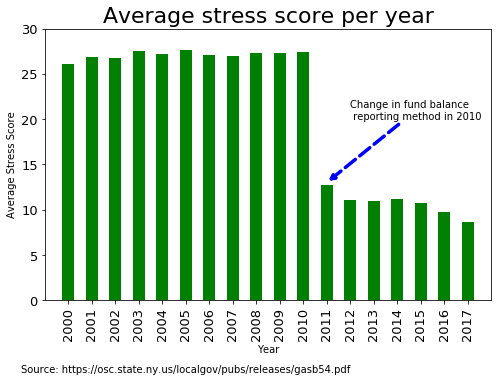

In [148]:
# EDA
# stress score trend per year
# print(stress_score_df.groupby(['Year'])['Stress_Score'].mean())
average_stress_score_per_year = stress_score_df.groupby(['Year'])['Stress_Score'].mean()

ax = average_stress_score_per_year.plot(kind='bar', figsize=(8,5), color="green", fontsize=13);
ax.set_alpha(0.8)
ax.set_title("Average stress score per year", fontsize=22)
ax.set_ylabel("Average Stress Score", fontsize=10);
ax.annotate('Change in fund balance \n reporting method in 2010', xy=(11, 13),
             xycoords='data',
             xytext=(12, 20),
             arrowprops=dict(arrowstyle= '-|>',color='blue', lw=3.5,ls='--'))

ax.set_xlim(-1,18)
ax.set_ylim(0,30)
plt.text(-2, -8, 'Source: https://osc.state.ny.us/localgov/pubs/releases/gasb54.pdf')
plt.show()


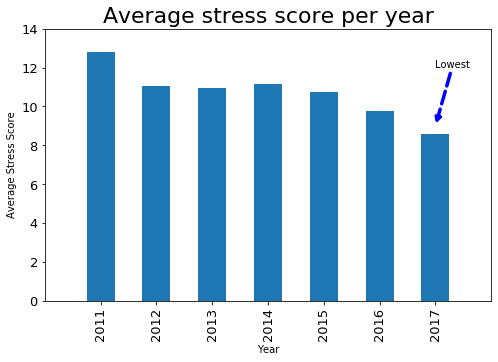

In [210]:
# stress score trend per year from 2011
stress_score_df_from_2011 = stress_score_df[stress_score_df.Year >2010]
average_stress_score_from_2011 = stress_score_df_from_2011.groupby(['Year'])['Stress_Score'].mean()
ax = average_stress_score_from_2011.plot(kind='bar', figsize=(8,5), fontsize=13);
ax.set_alpha(0.8)
ax.set_title("Average stress score per year", fontsize=22)
ax.set_ylabel("Average Stress Score", fontsize=10);
ax.annotate('Lowest', xy=(6,9),
             xycoords='data',
             xytext=(6, 12),
             arrowprops=dict(arrowstyle= '-|>',color='blue', lw=3.5,ls='--'))

ax.set_xlim(-1,7)
ax.set_ylim(0,14)
plt.show()

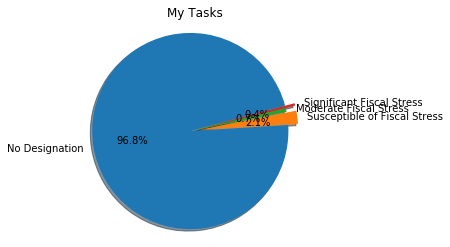

In [180]:
# stress score trend based on classification
score_classification =stress_score_df[['Score_Classifications']]
score_classification.head()
score_classification.Score_Classifications.value_counts()

# initialize list of lists 
data = [['No Designation', 15907], ['Susceptible of Fiscal Stress', 353],
        ['Moderate Fiscal Stress', 108], ['Significant Fiscal Stress', 63]] 
  
# Create the pandas DataFrame 
score_classification_df = pd.DataFrame(data, columns = ['Stress_Score_Classifications', 'Count']) 
score_classification_df
# # print dataframe. 
score_classification_df 
my_explode = (0, 0.1, 0, 0.1)
plt.pie(score_classification_df.Count, labels=score_classification_df.Stress_Score_Classifications, autopct='%1.1f%%', startangle=15, shadow = True, explode=my_explode)
plt.title('My Tasks')
plt.axis('equal')
plt.show()

In [181]:
stress_score_df.head()

,Year,Town_Name,Indicator_1 (25%),Indicator_2 (25%),Indicator_3 (10%),Indicator_4 (10%),Indicator_5 (10%),Indicator_6 (5%),Indicator_7 (5%),Indicator_8 (5%),Indicator_9 (5%),Max_score,Stress_Score,Score_Classifications
0,2000,Town of Adams,18.75,6.25,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,100,25.000000,No Designation
1,2000,Town of Addison,18.75,6.25,6.666667,0.0,0.0,0.0,0.0,0.0,0.0,100,31.666667,No Designation
2,2000,Town of Afton,18.75,6.25,6.666667,0.0,0.0,0.0,0.0,0.0,0.0,100,31.666667,No Designation
3,2000,Town of Alabama,18.75,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,100,18.750000,No Designation
4,2000,Town of Albion,18.75,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,100,18.750000,No Designation


In [ ]:
significant_stress = stress_score_df
no_designation

In [194]:
# stress score trend of one random town
town_of_adam = stress_score_df[stress_score_df.Town_Name == 'Town of Rochester']
town_of_adam = town_of_adam[town_of_adam.Year >2010]
town_of_adam.reset_index()
town_of_adam.head()
# height = [3, 12, 5, 18, 45]
# bars = ('A', 'B', 'C', 'D', 'E')
# y_pos = np.arange(len(bars))
 
# Create bars
# plt.bar(y_pos, height)

# stress_score_per_year = town_of_adam['Stress_Score']
# x_ticks = np.arange(2011,2017,1)
# plt.xticks(x_ticks)

# stress_score_per_year.plot.bar()


,Year,Town_Name,Indicator_1 (25%),Indicator_2 (25%),Indicator_3 (10%),Indicator_4 (10%),Indicator_5 (10%),Indicator_6 (5%),Indicator_7 (5%),Indicator_8 (5%),Indicator_9 (5%),Max_score,Stress_Score,Score_Classifications
10781,2011,Town of Rochester,0.00,0.00,6.666667,0.000000,0.000000,0.0,0.0,0.0,0.0,100,6.666667,No Designation
11696,2012,Town of Rochester,0.00,0.00,6.666667,0.000000,0.000000,0.0,0.0,0.0,0.0,100,6.666667,No Designation
12610,2013,Town of Rochester,12.50,12.50,6.666667,0.000000,0.000000,0.0,0.0,0.0,0.0,100,31.666667,No Designation
13524,2014,Town of Rochester,18.75,18.75,10.000000,6.666667,3.333333,0.0,0.0,0.0,0.0,100,57.500000,Moderate Fiscal Stress
14435,2015,Town of Rochester,18.75,18.75,10.000000,3.333333,3.333333,0.0,0.0,0.0,0.0,100,54.166667,Susceptible of Fiscal Stress


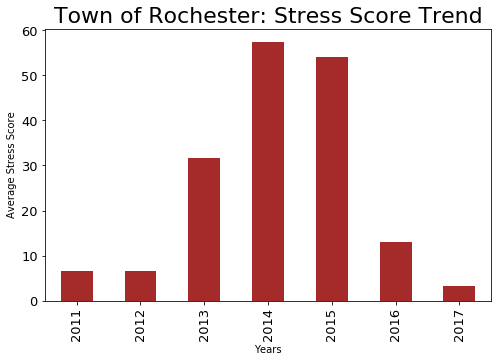

In [206]:
# stress score for Town of Rochester
town_of_rochester = stress_score_df[stress_score_df.Town_Name == 'Town of Rochester']
town_of_rochester = town_of_rochester[town_of_rochester.Year >2010]

stress_score_per_year = town_of_rochester['Stress_Score']

ax = stress_score_per_year.plot(kind='bar', figsize=(8,5), color="brown", fontsize=13);
ax.set_alpha(0.8)
ax.set_title("Town of Rochester: Stress Score Trend", fontsize=22)
ax.set_ylabel("Average Stress Score", fontsize=10);
ax.set_xlabel("Years", fontsize=10);

ax.set_xticklabels(['2011', '2012', '2013', '2014', '2015', '2016', '2017'])

plt.show()


In [211]:
stress_score_df.head(2)

,Year,Town_Name,Indicator_1 (25%),Indicator_2 (25%),Indicator_3 (10%),Indicator_4 (10%),Indicator_5 (10%),Indicator_6 (5%),Indicator_7 (5%),Indicator_8 (5%),Indicator_9 (5%),Max_score,Stress_Score,Score_Classifications
0,2000,Town of Adams,18.75,6.25,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,100,25.000000,No Designation
1,2000,Town of Addison,18.75,6.25,6.666667,0.0,0.0,0.0,0.0,0.0,0.0,100,31.666667,No Designation


In [217]:
# creating a df for population based analysis
stress_score_subset = stress_score_df[['Town_Name','Stress_Score','Year']]
accounting_data_subset = accounting_data_df[['ENTITY_NAME', 'COUNTY']]
print(accounting_data_subset.shape)
accounting_data_subset = accounting_data_subset.drop_duplicates(subset='ENTITY_NAME')
accounting_data_subset = accounting_data_subset.rename({'ENTITY_NAME': 'Town_Name'}, axis=1)
print(accounting_data_subset.shape)
# stress_score_subset.head()
accounting_data_subset.head()


(3843617, 2)
(919, 2)


,Town_Name,COUNTY
0,Town of Adams,Jefferson
191,Town of Addison,Steuben
315,Town of Afton,Chenango
463,Town of Alabama,Genesee
557,Town of Albion,Oswego


In [221]:
county_wise_df = pd.merge(stress_score_subset,accounting_data_subset,on='Town_Name',how='left')
county_wise_df.head()

,Town_Name,Stress_Score,Year,COUNTY
0,Town of Adams,25.000000,2000,Jefferson
1,Town of Addison,31.666667,2000,Steuben
2,Town of Afton,31.666667,2000,Chenango
3,Town of Alabama,18.750000,2000,Genesee
4,Town of Albion,18.750000,2000,Oswego


In [266]:
# stress score trend for population
county_wise_df_1 = county_wise_df[county_wise_df.Year == 2017]
x = county_wise_df_1[['COUNTY', 'Stress_Score']]
x = county_wise_df_1.groupby(['COUNTY'])['Stress_Score'].mean().to_frame().reset_index()
x.head()


,COUNTY,Stress_Score
0,Albany,13.250000
1,Allegany,9.984568
2,Broome,4.973958
3,Cattaraugus,9.892473
4,Cayuga,8.011364


In [281]:
# importing population df
population_df = pd.read_csv('../data/population_data.csv')
merged_df = pd.merge(x, population_df, on='COUNTY',how='inner')
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57 entries, 0 to 56
Data columns (total 3 columns):
COUNTY          57 non-null object
Stress_Score    57 non-null float64
Population      57 non-null int64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.8+ KB


Correlation between Stress Score by County and Population of County is: =0.3731792663581337


Text(0.5, 1.0, 'Relationship between Population size & \n Average Stress Score of a County')

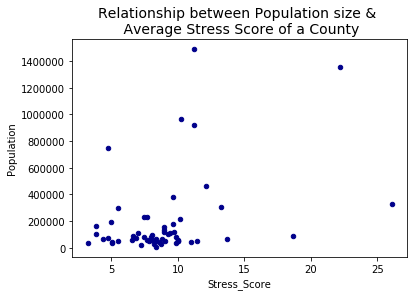

In [307]:
# correlation
correlation = merged_df['Stress_Score'].corr(merged_df['Population'])
print(f'Correlation between Stress Score by County and Population of County is: ={correlation}')

scatter_plot = merged_df.plot.scatter(x='Stress_Score', y='Population', c='DarkBlue')
scatter_plot.plot()
plt.title("Relationship between Population size & \n Average Stress Score of a County", fontsize=14)